## Final Project Submission

Please fill out:
* Student name: 
* Student pace: self paced / part time / full time
* Scheduled project review date/time: 
* Instructor name: 
* Blog post URL:


# Introduction

<b>Goal:</b> The purpose of this project is to use machine learning classification models to predict the functional status of water wells in Tanzania. The different status groups for classification are functional, non functional, and functional but needs repair.
 
<b>Data:</b> The data used for this project is from the Data Driven website where, at the time of completing this project, it is an active competition. The dataset contains nearly 60,000 records of water wells across Tanzania. Each record has information that includes various location data, technical specifications of the well, information about the water, etc. The website provides a list of the features contained and a brief description of each. The list is included here for reference. The link to the website to obtain the data for yourself is: https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/
 
- amount_tsh - Total static head (amount water available to waterpoint)
- date_recorded - The date the row was entered
- funder - Who funded the well
- gps_height - Altitude of the well
- installer - Organization that installed the well
- longitude - GPS coordinate
- latitude - GPS coordinate
- wpt_name - Name of the waterpoint if there is one
- num_private -
- basin - Geographic water basin
- subvillage - Geographic location
- region - Geographic location
- region_code - Geographic location (coded)
- district_code - Geographic location (coded)
- lga - Geographic location
- ward - Geographic location
- population - Population around the well
- public_meeting - True/False
- recorded_by - Group entering this row of data
- scheme_management - Who operates the waterpoint
- scheme_name - Who operates the waterpoint
- permit - If the waterpoint is permitted
- construction_year - Year the waterpoint was constructed
- extraction_type - The kind of extraction the waterpoint uses
- extraction_type_group - The kind of extraction the waterpoint uses
- extraction_type_class - The kind of extraction the waterpoint uses
- management - How the waterpoint is managed
- management_group - How the waterpoint is managed
- payment - What the water costs
- payment_type - What the water costs
- water_quality - The quality of the water
- quality_group - The quality of the water
- quantity - The quantity of water
- quantity_group - The quantity of water
- source - The source of the water
- source_type - The source of the water
- source_class - The source of the water
- waterpoint_type - The kind of waterpoint
- waterpoint_type_group - The kind of waterpoint

<b>Approach:</b> The approach for this project was to create many different model types to see what performs the best and to compare and contrast the different types of models. The way the data was preprocessed with feature engineering, filling missing values, and scaling was done with the goal of increasing accuracy of the models.  The OSEMiN process is the overarching structure of this project. 

<b>Methods:</b> For each type of model, a base model was first performed with default parameters as a base. Then, key parameters were chosen to tune using sklearn GridSearchCV and the best parameters were used to run the model. Finally, the tuned parameters were used to fit the same model using the dataset after SMOTE had been performed. Performance was compared after the tuning to the base model for each type, as well as between different model types. 

# OBTAIN

In [2]:
# Importing libraries that I will use
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from scipy.spatial import distance

# Setting default seaborn setting for my visuals
sns.set(style="whitegrid")

# Supressing warnings
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Setting pandas to display max columns and rows
pd.set_option('display.max_columns', 0)
pd.set_option('display.max_rows', None)

# Turning off scientific notation in pandas
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [5]:
# Opening the features and label files
values = pd.read_csv('TrainingSetValues.csv', index_col='id')
labels = pd.read_csv('TrainingSetLabels.csv', index_col='id')

In [6]:
# Combining the features and labels into one dataframe
df = pd.concat([values, labels], axis=1)

In [7]:
# Checking the shape
df.shape

(59400, 40)

In [8]:
# Checking out the dataframe
df.head()

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
69572,6000.000,2011-03-14,Roman,1390,Roman,34.938,-9.856,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
8776,0.000,2013-03-06,Grumeti,1399,GRUMETI,34.699,-2.147,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
34310,25.000,2013-02-25,Lottery Club,686,World vision,37.461,-3.821,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
67743,0.000,2013-01-28,Unicef,263,UNICEF,38.486,-11.155,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
19728,0.000,2011-07-13,Action In A,0,Artisan,31.131,-1.825,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


### Competition Predictions

The Data Driven website has the .csv file to download of the wells to predict for the competition. This file does not contain labels since it will need to be run through the model at the end to predict them. The predictions will be submitted to the website to see how many are correct. 

In [9]:
# Turning the competition labels into a dataframe
compdf = pd.read_csv('TestSetValues.csv', index_col='id')

In [10]:
# Checking the shape
compdf.shape

(14850, 39)

In [11]:
# Taking a look at the dataframe
compdf.head()

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
50785,0.000,2013-02-04,Dmdd,1996,DMDD,35.291,-4.060,Dinamu Secondary School,0,Internal,Magoma,Manyara,21,3,Mbulu,Bashay,321,True,GeoData Consultants Ltd,Parastatal,NaN,True,2012,other,other,other,parastatal,parastatal,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other
51630,0.000,2013-02-04,Government Of Tanzania,1569,DWE,36.657,-3.309,Kimnyak,0,Pangani,Kimnyak,Arusha,2,2,Arusha Rural,Kimnyaki,300,True,GeoData Consultants Ltd,VWC,TPRI pipe line,True,2000,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe
17168,0.000,2013-02-01,NaN,1567,NaN,34.768,-5.004,Puma Secondary,0,Internal,Msatu,Singida,13,2,Singida Rural,Puma,500,True,GeoData Consultants Ltd,VWC,P,NaN,2010,other,other,other,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other
45559,0.000,2013-01-22,Finn Water,267,FINN WATER,38.058,-9.419,Kwa Mzee Pange,0,Ruvuma / Southern Coast,Kipindimbi,Lindi,80,43,Liwale,Mkutano,250,NaN,GeoData Consultants Ltd,VWC,NaN,True,1987,other,other,other,vwc,user-group,unknown,unknown,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other
49871,500.000,2013-03-27,Bruder,1260,BRUDER,35.006,-10.950,Kwa Mzee Turuka,0,Ruvuma / Southern Coast,Losonga,Ruvuma,10,3,Mbinga,Mbinga Urban,60,NaN,GeoData Consultants Ltd,Water Board,BRUDER,True,2000,gravity,gravity,gravity,water board,user-group,pay monthly,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


# SCRUB

The scrubbing process began with looking at the values in each column. Null values and zero values were investigated. The columns were judged for usefulness and the unnecessary columns were dropped. A train-test-split was done early to prevent any data leakage when filling in values. Feature engineering was also done including adding distances to cities and water treatment facilities. Some features had values bucketed into categories for practicality.

## Looking at the values in each column

In [12]:
# Looking at datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 69572 to 26348
Data columns (total 40 columns):
amount_tsh               59400 non-null float64
date_recorded            59400 non-null object
funder                   55765 non-null object
gps_height               59400 non-null int64
installer                55745 non-null object
longitude                59400 non-null float64
latitude                 59400 non-null float64
wpt_name                 59400 non-null object
num_private              59400 non-null int64
basin                    59400 non-null object
subvillage               59029 non-null object
region                   59400 non-null object
region_code              59400 non-null int64
district_code            59400 non-null int64
lga                      59400 non-null object
ward                     59400 non-null object
population               59400 non-null int64
public_meeting           56066 non-null object
recorded_by              59400 non-null obj

In [13]:
# Looking at datatypes
compdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14850 entries, 50785 to 68707
Data columns (total 39 columns):
amount_tsh               14850 non-null float64
date_recorded            14850 non-null object
funder                   13981 non-null object
gps_height               14850 non-null int64
installer                13973 non-null object
longitude                14850 non-null float64
latitude                 14850 non-null float64
wpt_name                 14850 non-null object
num_private              14850 non-null int64
basin                    14850 non-null object
subvillage               14751 non-null object
region                   14850 non-null object
region_code              14850 non-null int64
district_code            14850 non-null int64
lga                      14850 non-null object
ward                     14850 non-null object
population               14850 non-null int64
public_meeting           14029 non-null object
recorded_by              14850 non-null obj

In [14]:
# Checking null values in the columns
df.isna().sum()

amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_group                0
quantity

In [15]:
# Checking null values in the columns
compdf.isna().sum()

amount_tsh                  0
date_recorded               0
funder                    869
gps_height                  0
installer                 877
longitude                   0
latitude                    0
wpt_name                    0
num_private                 0
basin                       0
subvillage                 99
region                      0
region_code                 0
district_code               0
lga                         0
ward                        0
population                  0
public_meeting            821
recorded_by                 0
scheme_management         969
scheme_name              7092
permit                    737
construction_year           0
extraction_type             0
extraction_type_group       0
extraction_type_class       0
management                  0
management_group            0
payment                     0
payment_type                0
water_quality               0
quality_group               0
quantity                    0
quantity_g

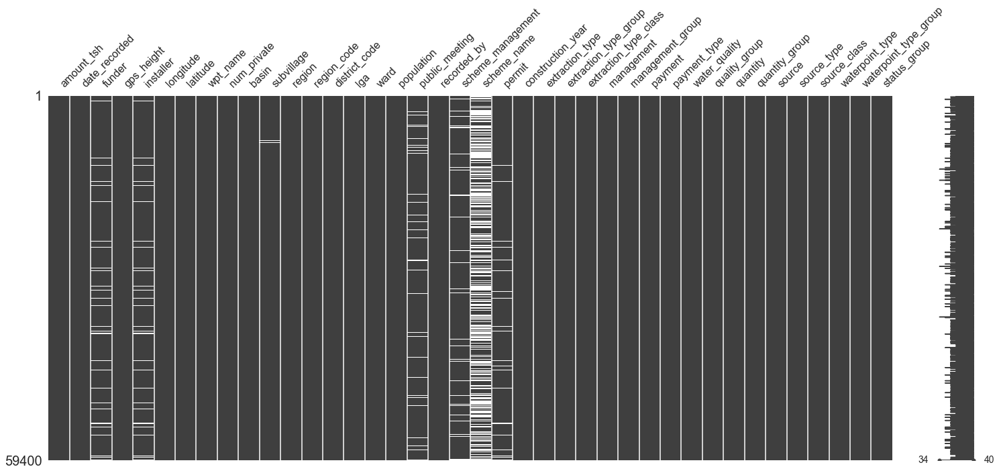

In [16]:
# Visualizing the null values
import missingno as ms
ms.matrix(df)

> From the visualization you can see that scheme_name is missing a lot of information. Funder and installer have a pattern that matches each other so the values missing in one are missing in the other.

In [17]:
# Checking some basic stats about each of the number columns
df.describe()

,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000,59400.000,59400.000,59400.000,59400.000,59400.000,59400.000,59400.000,59400.000
mean,317.650,668.297,34.077,-5.706,0.474,15.297,5.630,179.910,1300.652
std,2997.575,693.116,6.567,2.946,12.236,17.587,9.634,471.482,951.621
min,0.000,-90.000,0.000,-11.649,0.000,1.000,0.000,0.000,0.000
25%,0.000,0.000,33.090,-8.541,0.000,5.000,2.000,0.000,0.000
50%,0.000,369.000,34.909,-5.022,0.000,12.000,3.000,25.000,1986.000
75%,20.000,1319.250,37.178,-3.326,0.000,17.000,5.000,215.000,2004.000
max,350000.000,2770.000,40.345,-0.000,1776.000,99.000,80.000,30500.000,2013.000


In [18]:
# There is unbalance among the classes
df.status_group.value_counts()

functional                 32259
non functional             22824
functional needs repair     4317
Name: status_group, dtype: int64

There are a large amount of zero values for TSH (total static head). Some online research about TSH explains that zero is a valid possible value so it has to be assumed that the zero values are legitimate.

In [19]:
# Looking at column values
df.amount_tsh.value_counts(normalize=True)

0.000        0.701
500.000      0.052
50.000       0.042
1000.000     0.025
20.000       0.025
200.000      0.021
100.000      0.014
10.000       0.014
30.000       0.013
2000.000     0.012
250.000      0.010
300.000      0.009
5000.000     0.008
5.000        0.006
25.000       0.006
3000.000     0.006
1200.000     0.004
1500.000     0.003
6.000        0.003
600.000      0.003
4000.000     0.003
2400.000     0.002
2500.000     0.002
6000.000     0.002
7.000        0.001
8000.000     0.001
750.000      0.001
40.000       0.001
10000.000    0.001
12000.000    0.001
20000.000    0.001
3600.000     0.001
400.000      0.001
450.000      0.001
2200.000     0.001
700.000      0.000
4700.000     0.000
70.000       0.000
150.000      0.000
33.000       0.000
15000.000    0.000
60.000       0.000
15.000       0.000
2800.000     0.000
2.000        0.000
7200.000     0.000
1300.000     0.000
6500.000     0.000
25000.000    0.000
30000.000    0.000
7500.000     0.000
35.000       0.000
7000.000    

In [20]:
# Turning column data type to be an integer
df.amount_tsh = df.amount_tsh.astype('int64')
compdf.amount_tsh = compdf.amount_tsh.astype('int64')

In [21]:
# Looking at column values
df.date_recorded.value_counts()

2011-03-15    572
2011-03-17    558
2013-02-03    546
2011-03-14    520
2011-03-16    513
2011-03-18    497
2011-03-19    466
2013-02-04    464
2013-01-29    459
2011-03-04    458
2013-02-14    444
2013-01-24    435
2011-03-05    434
2013-02-15    429
2013-03-15    428
2011-03-11    426
2013-01-30    421
2013-02-16    418
2011-03-23    417
2011-03-09    416
2013-01-18    409
2013-02-26    391
2011-03-30    391
2013-03-19    381
2011-03-24    381
2013-02-13    380
2013-01-23    379
2011-03-12    379
2011-03-03    378
2013-01-28    376
2011-03-13    373
2011-07-27    373
2013-02-19    371
2013-02-02    370
2013-02-18    369
2013-01-19    368
2013-01-22    364
2011-03-10    364
2011-03-22    364
2013-02-08    363
2013-03-18    360
2012-10-22    353
2011-03-21    351
2011-02-26    351
2013-03-04    347
2013-03-13    346
2011-07-30    345
2011-03-26    342
2013-01-16    342
2011-02-28    341
2013-02-27    340
2013-02-01    338
2013-01-25    338
2011-07-19    338
2013-01-27    337
2011-03-28

In [22]:
# Dropping the column as it's not valuable information
df.drop('date_recorded', axis=1, inplace=True)
compdf.drop('date_recorded', axis=1, inplace=True)

In [23]:
# Looking at column values
df.funder.value_counts(dropna=False, normalize=True)

Government Of Tanzania           0.153
NaN                              0.061
Danida                           0.052
Hesawa                           0.037
Rwssp                            0.023
World Bank                       0.023
Kkkt                             0.022
World Vision                     0.021
Unicef                           0.018
Tasaf                            0.015
District Council                 0.014
Dhv                              0.014
Private Individual               0.014
Dwsp                             0.014
0                                0.013
Norad                            0.013
Germany Republi                  0.010
Tcrs                             0.010
Ministry Of Water                0.010
Water                            0.010
Dwe                              0.008
Netherlands                      0.008
Hifab                            0.008
Adb                              0.008
Lga                              0.007
Amref                    

In [24]:
# Filling null values with an 'other' placeholder
df.funder.fillna('other', inplace=True)
compdf.funder.fillna('other', inplace=True)

Again there are a lot of zero values for gps height (which refers to the altitude at the well), but zero is a legitimate possible value so it must be assumed that they are all legitimate.

In [25]:
# Looking at column values
df.gps_height.value_counts(dropna=False, normalize=True)

 0      0.344
-15     0.001
-16     0.001
-13     0.001
-20     0.001
 1290   0.001
-14     0.001
 303    0.001
-18     0.001
-19     0.001
 1269   0.001
 1295   0.001
 1304   0.001
-23     0.001
 280    0.001
 1538   0.001
 1286   0.001
-8      0.001
-17     0.001
 1332   0.001
 320    0.001
 1317   0.001
 1293   0.001
 1319   0.001
 1359   0.001
 1264   0.001
 1288   0.001
 1401   0.001
 1303   0.001
-27     0.001
-6      0.001
 1272   0.001
 1613   0.001
 1152   0.001
 12     0.001
-11     0.001
 309    0.001
 1602   0.001
 1342   0.001
 1323   0.001
 336    0.001
 1322   0.001
 338    0.001
 1325   0.001
 1330   0.001
-21     0.001
 1180   0.001
-2      0.001
 1311   0.001
 1240   0.001
 1271   0.001
 1384   0.001
 1307   0.001
 1597   0.001
 1314   0.001
 17     0.001
 1289   0.001
 1370   0.001
 1329   0.001
 1582   0.001
 1270   0.001
 1407   0.001
 1306   0.001
-3      0.001
 1266   0.001
 1252   0.001
 306    0.001
 1362   0.001
-7      0.001
 1161   0.001
 259    0.001
-22   

In [26]:
# Looking at column values
df.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
NaN                              0.062
Government                       0.031
RWE                              0.020
Commu                            0.018
DANIDA                           0.018
KKKT                             0.015
Hesawa                           0.014
0                                0.013
TCRS                             0.012
Central government               0.010
CES                              0.010
Community                        0.009
DANID                            0.009
District Council                 0.009
HESAWA                           0.009
LGA                              0.007
World vision                     0.007
WEDECO                           0.007
TASAF                            0.007
District council                 0.007
Gover                            0.006
AMREF                            0.006
TWESA                            0.005
WU                               0.005
Dmdd                     

In [27]:
# Filling null values with an 'other' placeholder
df.installer.fillna('other', inplace=True)
compdf.installer.fillna('other', inplace=True)

There is quite a lot of chaos in the installer column with different spellings of the same values. Some effort was made to clean up and consolidate these to make them neater, especially those that are most common. The zero values will be dealt with after the train-test-split when the lesser common values are bucketed into an "other" category. 

In [28]:
# Converging some of the different spellings of values 
df.installer = df.installer.replace({'World vision': 'World Vision', 
                      'District council': 'District Council', 
                      'Central government': 'Government',
                    'Central Government': 'Government',
                    'Gover': 'Government',
                    'KKKT _ Konde and DWE': 'KKKT',
                     'Hesawa': 'HESAWA',
                    'DANID': 'DANIDA', 'Commu':'Community'})

In [29]:
# Looking at column values for the compdf
compdf.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
other                            0.059
Government                       0.031
RWE                              0.020
Commu                            0.019
DANIDA                           0.017
Hesawa                           0.015
KKKT                             0.015
0                                0.014
TCRS                             0.012
CES                              0.010
Central government               0.010
HESAWA                           0.009
DANID                            0.009
Community                        0.009
District Council                 0.008
World vision                     0.007
TASAF                            0.007
Gover                            0.007
WEDECO                           0.007
District council                 0.007
LGA                              0.006
TWESA                            0.005
WU                               0.005
AMREF                            0.005
Dmdd                     

In [30]:
# Converging some of the different spellings of values 
compdf.installer = compdf.installer.replace({'World vision': 'World Vision', 
                      'District council': 'District Council', 
                      'Central government': 'Government',
                    'Central Government': 'Government',
                    'Gover': 'Government',
                    'KKKT _ Konde and DWE': 'KKKT',
                     'Hesawa': 'HESAWA',
                    'DANID': 'DANIDA', 'Commu':'Community'})

In [31]:
# Checking to see that it is a bit tidier.
df.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
other                            0.062
Government                       0.049
Community                        0.027
DANIDA                           0.027
HESAWA                           0.023
RWE                              0.020
KKKT                             0.018
District Council                 0.016
0                                0.013
TCRS                             0.012
World Vision                     0.011
CES                              0.010
LGA                              0.007
WEDECO                           0.007
TASAF                            0.007
AMREF                            0.006
TWESA                            0.005
WU                               0.005
Dmdd                             0.005
ACRA                             0.005
SEMA                             0.004
DW                               0.004
OXFAM                            0.004
Da                               0.004
Idara ya maji            

In [32]:
# Checking to see that it is a bit tidier
compdf.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
other                            0.059
Government                       0.049
Community                        0.028
DANIDA                           0.026
HESAWA                           0.025
RWE                              0.020
KKKT                             0.018
District Council                 0.014
0                                0.014
TCRS                             0.012
World Vision                     0.011
CES                              0.010
TASAF                            0.007
WEDECO                           0.007
LGA                              0.006
TWESA                            0.005
WU                               0.005
AMREF                            0.005
Dmdd                             0.005
ACRA                             0.005
Da                               0.004
UNICEF                           0.004
Villagers                        0.004
SEMA                             0.004
DW                       

There are a lot of zero values for latitude and longitude which are not possible for Tanzania's location. The zero values will be dealt after the train-test-split to avoid data leakage. They will be filled based on other entries with similar values in the other location based features.

In [33]:
# Looking at column values 
df.longitude.value_counts(dropna=False)

0.000     1812
37.541       2
33.011       2
39.093       2
32.973       2
33.006       2
39.104       2
37.543       2
36.802       2
39.098       2
33.090       2
33.005       2
32.978       2
39.089       2
31.620       2
39.093       2
39.105       2
32.937       2
32.988       2
39.091       2
37.314       2
32.985       2
39.091       2
37.274       2
32.920       2
37.531       2
32.956       2
39.099       2
32.989       2
32.988       2
32.993       2
37.298       2
37.252       2
32.983       2
39.096       2
37.533       2
39.096       2
37.374       2
37.319       2
37.376       2
38.181       2
39.086       2
39.092       2
37.269       2
39.104       2
32.994       2
37.250       2
39.096       2
39.099       2
37.281       2
39.101       2
39.095       2
39.092       2
32.926       2
37.539       2
37.542       2
37.340       2
37.329       2
37.543       2
32.957       2
32.967       2
39.086       2
37.534       2
39.086       2
32.966       2
39.090       2
32.925    

In [34]:
# Looking at column values
df.latitude.value_counts(dropna=False)

-0.000     1812
-6.986        2
-3.798        2
-6.982        2
-7.105        2
-7.057        2
-7.175        2
-6.991        2
-6.979        2
-6.995        2
-2.495        2
-6.964        2
-2.507        2
-6.991        2
-2.485        2
-2.494        2
-6.962        2
-6.989        2
-6.957        2
-6.959        2
-6.993        2
-6.991        2
-7.177        2
-2.502        2
-1.793        2
-7.102        2
-2.467        2
-2.517        2
-7.095        2
-6.981        2
-6.980        2
-7.177        2
-6.990        2
-2.480        2
-6.964        2
-6.957        2
-2.465        2
-6.978        2
-6.975        2
-6.978        2
-2.504        2
-6.964        2
-2.490        2
-6.976        2
-2.520        2
-2.464        2
-6.984        2
-7.105        2
-2.515        2
-7.094        2
-7.065        2
-2.496        2
-2.517        2
-6.982        2
-7.104        2
-6.983        2
-2.529        2
-9.289        2
-6.980        2
-2.492        2
-2.487        2
-2.489        2
-2.511  

In [35]:
# Looking at column values
df.wpt_name.value_counts(dropna=False, normalize=True)

none                             0.060
Shuleni                          0.029
Zahanati                         0.014
Msikitini                        0.009
Kanisani                         0.005
Bombani                          0.005
Sokoni                           0.004
Ofisini                          0.004
School                           0.004
Shule Ya Msingi                  0.003
Shule                            0.003
Sekondari                        0.002
Muungano                         0.002
Mkombozi                         0.002
Madukani                         0.002
Mbugani                          0.002
Hospital                         0.002
Upendo                           0.002
Kituo Cha Afya                   0.002
Mkuyuni                          0.001
Umoja                            0.001
Center                           0.001
Ccm                              0.001
Kisimani                         0.001
Ofisi Ya Kijiji                  0.001
Mtakuja                  

In [36]:
# Removing the column as there is no value in this column
df.drop('wpt_name', axis=1, inplace=True)
compdf.drop('wpt_name', axis=1, inplace=True)

In [37]:
# Looking at column values
df.num_private.value_counts(dropna=False, normalize=True)

0      0.987
6      0.001
1      0.001
5      0.001
8      0.001
32     0.001
45     0.001
15     0.001
39     0.001
93     0.000
3      0.000
7      0.000
2      0.000
65     0.000
47     0.000
102    0.000
4      0.000
17     0.000
80     0.000
20     0.000
25     0.000
11     0.000
41     0.000
34     0.000
16     0.000
120    0.000
150    0.000
22     0.000
12     0.000
24     0.000
50     0.000
38     0.000
58     0.000
9      0.000
10     0.000
14     0.000
61     0.000
27     0.000
26     0.000
160    0.000
30     0.000
698    0.000
60     0.000
1402   0.000
450    0.000
668    0.000
131    0.000
35     0.000
672    0.000
42     0.000
136    0.000
87     0.000
300    0.000
280    0.000
141    0.000
62     0.000
111    0.000
240    0.000
1776   0.000
755    0.000
180    0.000
213    0.000
23     0.000
55     0.000
94     0.000
Name: num_private, dtype: float64

In [38]:
# Removing the column as there is no value in this column
df.drop('num_private', axis=1, inplace=True)
compdf.drop('num_private', axis=1, inplace=True)

In [39]:
# Looking at column values
df.basin.value_counts(dropna=False, normalize=True)

Lake Victoria             0.173
Pangani                   0.151
Rufiji                    0.134
Internal                  0.131
Lake Tanganyika           0.108
Wami / Ruvu               0.101
Lake Nyasa                0.086
Ruvuma / Southern Coast   0.076
Lake Rukwa                0.041
Name: basin, dtype: float64

In [40]:
# Looking at column values
df.subvillage.value_counts(dropna=False, normalize=True)

Madukani                         0.009
Shuleni                          0.009
Majengo                          0.008
Kati                             0.006
NaN                              0.006
Mtakuja                          0.004
Sokoni                           0.004
M                                0.003
Muungano                         0.003
Mbuyuni                          0.003
Mlimani                          0.003
Songambele                       0.002
Msikitini                        0.002
Miembeni                         0.002
1                                0.002
Kibaoni                          0.002
Kanisani                         0.002
I                                0.002
Mapinduzi                        0.002
Mjini                            0.002
Mjimwema                         0.002
Mkwajuni                         0.002
Mwenge                           0.002
Azimio                           0.002
Mabatini                         0.002
Mission                  

In [41]:
# Removing the column as there is no value in this column
df.drop('subvillage', axis=1, inplace=True)
compdf.drop('subvillage', axis=1, inplace=True)

In [42]:
# Looking at column values
df.region.value_counts(dropna=False, normalize=True)

Iringa          0.089
Shinyanga       0.084
Mbeya           0.078
Kilimanjaro     0.074
Morogoro        0.067
Arusha          0.056
Kagera          0.056
Mwanza          0.052
Kigoma          0.047
Ruvuma          0.044
Pwani           0.044
Tanga           0.043
Dodoma          0.037
Singida         0.035
Mara            0.033
Tabora          0.033
Rukwa           0.030
Mtwara          0.029
Manyara         0.027
Lindi           0.026
Dar es Salaam   0.014
Name: region, dtype: float64

In [43]:
# Looking at column values
df.region_code.value_counts(dropna=False, normalize=True)

11   0.089
17   0.084
12   0.078
3    0.074
5    0.068
18   0.056
19   0.051
2    0.051
16   0.047
10   0.044
4    0.042
1    0.037
13   0.035
14   0.033
20   0.033
15   0.030
6    0.027
21   0.027
80   0.021
60   0.017
90   0.015
7    0.014
99   0.007
9    0.007
24   0.005
8    0.005
40   0.000
Name: region_code, dtype: float64

In [44]:
# Removing the column as there is no value in this column
df.drop('region_code', axis=1, inplace=True)
compdf.drop('region_code', axis=1, inplace=True)

In [45]:
# Looking at column values
df.district_code.value_counts(dropna=False, normalize=True)

1    0.205
2    0.188
3    0.168
4    0.151
5    0.073
6    0.069
7    0.056
8    0.018
30   0.017
33   0.015
53   0.013
43   0.009
13   0.007
23   0.005
63   0.003
62   0.002
60   0.001
0    0.000
80   0.000
67   0.000
Name: district_code, dtype: float64

In [46]:
# Removing the column as there is no value in this column
df.drop('district_code', axis=1, inplace=True)
compdf.drop('district_code', axis=1, inplace=True)

In [47]:
# Looking at column values
df.lga.value_counts(dropna=False, normalize=True)

Njombe             0.042
Arusha Rural       0.021
Moshi Rural        0.021
Bariadi            0.020
Rungwe             0.019
Kilosa             0.018
Kasulu             0.018
Mbozi              0.017
Meru               0.017
Bagamoyo           0.017
Singida Rural      0.017
Kilombero          0.016
Same               0.015
Kibondo            0.015
Kyela              0.014
Kahama             0.014
Magu               0.014
Kigoma Rural       0.014
Maswa              0.014
Karagwe            0.013
Mbinga             0.013
Iringa Rural       0.012
Serengeti          0.012
Namtumbo           0.012
Lushoto            0.012
Songea Rural       0.012
Mpanda             0.011
Mvomero            0.011
Ngara              0.011
Ulanga             0.011
Makete             0.011
Kwimba             0.011
Mbarali            0.011
Hai                0.011
Rombo              0.010
Shinyanga Rural    0.010
Nzega              0.010
Ludewa             0.009
Mkuranga           0.009
Iramba             0.009


In [48]:
# Looking at column values
df.ward.value_counts(dropna=False)

Igosi                      307
Imalinyi                   252
Siha Kati                  232
Mdandu                     231
Nduruma                    217
Kitunda                    203
Mishamo                    203
Msindo                     201
Chalinze                   196
Maji ya Chai               190
Usuka                      187
Ngarenanyuki               172
Chanika                    171
Vikindu                    162
Mtwango                    153
Matola                     145
Zinga/Ikerege              141
Maramba                    139
Wanging'ombe               139
Itete                      137
Magomeni                   135
Kikatiti                   134
Ifakara                    134
Olkokola                   133
Maposeni                   130
Igongolo                   129
Mvomero                    129
Mlangali                   125
Nkoma                      122
Nkungulu                   121
Mahongole                  121
Rujewa                     120
Simbo   

In [49]:
# Removing the column as it is basically a repeat of lga
df.drop('ward', axis=1, inplace=True)
compdf.drop('ward', axis=1, inplace=True)

The zero population values will be filled after the train-test-split since they will be filled based on other entries of similar location. 

In [50]:
# Looking at column values
df.population.value_counts(dropna=False, normalize=True)

0       0.360
1       0.118
200     0.033
150     0.032
250     0.028
300     0.025
100     0.019
50      0.019
500     0.017
350     0.017
120     0.015
400     0.013
60      0.012
30      0.011
40      0.009
80      0.009
450     0.008
20      0.008
600     0.007
230     0.007
75      0.005
1000    0.005
800     0.005
90      0.004
130     0.004
25      0.004
320     0.004
35      0.004
360     0.004
140     0.004
210     0.004
70      0.004
45      0.003
15      0.003
700     0.003
1500    0.003
180     0.003
650     0.003
65      0.003
1200    0.003
10      0.003
420     0.003
240     0.003
750     0.003
56      0.003
2000    0.002
160     0.002
260     0.002
55      0.002
125     0.002
96      0.002
540     0.002
560     0.002
280     0.002
550     0.002
86      0.002
380     0.001
98      0.001
340     0.001
220     0.001
170     0.001
270     0.001
85      0.001
900     0.001
520     0.001
256     0.001
530     0.001
110     0.001
950     0.001
145     0.001
156     0.001
89    

In [51]:
# Looking at column values
df.public_meeting.value_counts(dropna=False, normalize=True)

True    0.859
False   0.085
NaN     0.056
Name: public_meeting, dtype: float64

In [52]:
# Looking at column values
compdf.public_meeting.value_counts(dropna=False, normalize=True)

True    0.858
False   0.087
NaN     0.055
Name: public_meeting, dtype: float64

In [53]:
# Filling null values with an unknown placeholder
df.public_meeting.fillna('unknown', inplace=True)
compdf.public_meeting.fillna('unknown', inplace=True)

In [54]:
# Changing all the values to be strings and not boolean
df.public_meeting = df.public_meeting.astype('str')
compdf.public_meeting = compdf.public_meeting.astype('str')

In [55]:
# Changing the values to yes and no 
df['public_meeting'] = df['public_meeting'].map({'True': 'yes', 'False': 'no', 'unknown': 'unknown'})
compdf['public_meeting'] = compdf['public_meeting'].map({'True': 'yes', 'False': 'no', 'unknown': 'unknown'})

In [56]:
# Looking at column values
df.recorded_by.value_counts(dropna=False, normalize=True)

GeoData Consultants Ltd   1.000
Name: recorded_by, dtype: float64

In [57]:
# Dropping the column since all the values are the same
df.drop('recorded_by', axis=1, inplace=True)
compdf.drop('recorded_by', axis=1, inplace=True)

In [58]:
# Looking at column values
df.scheme_management.value_counts(dropna=False, normalize=True)

VWC                0.619
WUG                0.088
NaN                0.065
Water authority    0.053
WUA                0.049
Water Board        0.046
Parastatal         0.028
Private operator   0.018
Company            0.018
Other              0.013
SWC                0.002
Trust              0.001
None               0.000
Name: scheme_management, dtype: float64

In [59]:
# Filling null values with an "other" placeholder
df.scheme_management.fillna('Other', inplace=True)
compdf.scheme_management.fillna('Other', inplace=True)

In [60]:
# Looking at column values
df.scheme_name.value_counts(dropna=False, normalize=True)

NaN                                              0.474
K                                                0.011
None                                             0.011
Borehole                                         0.009
Chalinze wate                                    0.007
M                                                0.007
DANIDA                                           0.006
Government                                       0.005
Ngana water supplied scheme                      0.005
wanging'ombe water supply s                      0.004
wanging'ombe supply scheme                       0.004
I                                                0.004
Bagamoyo wate                                    0.004
Uroki-Bomang'ombe water sup                      0.004
N                                                0.003
Kirua kahe gravity water supply trust            0.003
Machumba estate pipe line                        0.003
Makwale water supplied sche                      0.003
Kijiji    

In [61]:
# Dropping the column as there is no value
df.drop('scheme_name', axis=1, inplace=True)
compdf.drop('scheme_name', axis=1, inplace=True)

In [62]:
# Looking at column values
df.permit.value_counts(dropna=False, normalize=True)

True    0.654
False   0.294
NaN     0.051
Name: permit, dtype: float64

In [63]:
# Filling null values with "unknown" placeholder
df.permit.fillna('unknown', inplace=True)
compdf.permit.fillna('unknown', inplace=True)

In [64]:
# Changing the data type to be a string instead of boolean
df.permit = df.permit.astype('str')
compdf.permit = compdf.permit.astype('str')

In [65]:
# Changing the values to yes and no 
df['permit'] = df['permit'].map({'True': 'yes', 'False': 'no', 'unknown': 'unknown'})
compdf['permit'] = compdf['permit'].map({'True': 'yes', 'False': 'no', 'unknown': 'unknown'})

In [66]:
# Looking at column values, zeros will be dealt with after train-test-split
df.construction_year.value_counts(dropna=False, normalize=True)

0      0.349
2010   0.045
2008   0.044
2009   0.043
2000   0.035
2007   0.027
2006   0.025
2003   0.022
2011   0.021
2004   0.019
2012   0.018
2002   0.018
1978   0.017
1995   0.017
2005   0.017
1999   0.016
1998   0.016
1990   0.016
1985   0.016
1980   0.014
1996   0.014
1984   0.013
1982   0.013
1994   0.012
1972   0.012
1974   0.011
1997   0.011
1992   0.011
1993   0.010
2001   0.009
1988   0.009
1983   0.008
1975   0.007
1986   0.007
1976   0.007
1970   0.007
1991   0.005
1989   0.005
1987   0.005
1981   0.004
1977   0.003
1979   0.003
1973   0.003
2013   0.003
1971   0.002
1960   0.002
1967   0.001
1963   0.001
1968   0.001
1969   0.001
1964   0.001
1962   0.001
1961   0.000
1965   0.000
1966   0.000
Name: construction_year, dtype: float64

In [67]:
# Looking at column values
df.extraction_type.value_counts(dropna=False, normalize=True)

gravity                     0.451
nira/tanira                 0.137
other                       0.108
submersible                 0.080
swn 80                      0.062
mono                        0.048
india mark ii               0.040
afridev                     0.030
ksb                         0.024
other - rope pump           0.008
other - swn 81              0.004
windmill                    0.002
india mark iii              0.002
cemo                        0.002
other - play pump           0.001
walimi                      0.001
climax                      0.001
other - mkulima/shinyanga   0.000
Name: extraction_type, dtype: float64

In [68]:
# Looking at column values
df.extraction_type_group.value_counts(dropna=False, normalize=True)

gravity           0.451
nira/tanira       0.137
other             0.108
submersible       0.104
swn 80            0.062
mono              0.048
india mark ii     0.040
afridev           0.030
rope pump         0.008
other handpump    0.006
other motorpump   0.002
wind-powered      0.002
india mark iii    0.002
Name: extraction_type_group, dtype: float64

In [69]:
# Looking at column values
df.extraction_type_class.value_counts(dropna=False, normalize=True)

gravity        0.451
handpump       0.277
other          0.108
submersible    0.104
motorpump      0.050
rope pump      0.008
wind-powered   0.002
Name: extraction_type_class, dtype: float64

In [70]:
# Dropping the columns that contain nearly duplicate information
df.drop(columns=['extraction_type_group', 'extraction_type_class'], 
        inplace=True)
compdf.drop(columns=['extraction_type_group', 'extraction_type_class'], 
            inplace=True)

In [71]:
# Looking at column values
df.management.value_counts(dropna=False, normalize=True)

vwc                0.682
wug                0.110
water board        0.049
wua                0.043
private operator   0.033
parastatal         0.030
water authority    0.015
other              0.014
company            0.012
unknown            0.009
other - school     0.002
trust              0.001
Name: management, dtype: float64

In [72]:
# Looking at column values
df.management_group.value_counts(dropna=False, normalize=True)

user-group   0.884
commercial   0.061
parastatal   0.030
other        0.016
unknown      0.009
Name: management_group, dtype: float64

In [73]:
# Dropping column that is mostly dupicate information
df.drop('management_group', axis=1, inplace=True)
compdf.drop('management_group', axis=1, inplace=True)

In [74]:
# Looking at column values
df.payment.value_counts(dropna=False, normalize=True)

never pay               0.427
pay per bucket          0.151
pay monthly             0.140
unknown                 0.137
pay when scheme fails   0.066
pay annually            0.061
other                   0.018
Name: payment, dtype: float64

In [75]:
# Looking at column values
df.payment_type.value_counts(dropna=False, normalize=True)

never pay    0.427
per bucket   0.151
monthly      0.140
unknown      0.137
on failure   0.066
annually     0.061
other        0.018
Name: payment_type, dtype: float64

In [76]:
# Dropping column that is mostly dupicate information
df.drop('payment', axis=1, inplace=True)
compdf.drop('payment', axis=1, inplace=True)

In [77]:
# Looking at column values
df.water_quality.value_counts(dropna=False, normalize=True)

soft                 0.856
salty                0.082
unknown              0.032
milky                0.014
coloured             0.008
salty abandoned      0.006
fluoride             0.003
fluoride abandoned   0.000
Name: water_quality, dtype: float64

In [78]:
# Looking at column values
df.quality_group.value_counts(dropna=False, normalize=True)

good       0.856
salty      0.087
unknown    0.032
milky      0.014
colored    0.008
fluoride   0.004
Name: quality_group, dtype: float64

In [79]:
# Dropping column that is mostly dupicate information
df.drop('quality_group', axis=1, inplace=True)
compdf.drop('quality_group', axis=1, inplace=True)

In [80]:
# Looking at column values
df.quantity.value_counts(dropna=False, normalize=True)

enough         0.559
insufficient   0.255
dry            0.105
seasonal       0.068
unknown        0.013
Name: quantity, dtype: float64

In [81]:
# Looking at column values
df.quantity_group.value_counts(dropna=False, normalize=True)

enough         0.559
insufficient   0.255
dry            0.105
seasonal       0.068
unknown        0.013
Name: quantity_group, dtype: float64

In [82]:
# Dropping column that is dupicate information
df.drop('quantity_group', axis=1, inplace=True)
compdf.drop('quantity_group', axis=1, inplace=True)

In [83]:
# Looking at column values
df.source.value_counts(dropna=False, normalize=True)

spring                 0.287
shallow well           0.283
machine dbh            0.186
river                  0.162
rainwater harvesting   0.039
hand dtw               0.015
lake                   0.013
dam                    0.011
other                  0.004
unknown                0.001
Name: source, dtype: float64

In [84]:
# Looking at column values
df.source_type.value_counts(dropna=False, normalize=True)

spring                 0.287
shallow well           0.283
borehole               0.201
river/lake             0.175
rainwater harvesting   0.039
dam                    0.011
other                  0.005
Name: source_type, dtype: float64

In [85]:
# Dropping column that is dupicate information
df.drop('source_type', axis=1, inplace=True)
compdf.drop('source_type', axis=1, inplace=True)

In [86]:
# Looking at column values
df.source_class.value_counts(dropna=False, normalize=True)

groundwater   0.771
surface       0.224
unknown       0.005
Name: source_class, dtype: float64

In [87]:
# Dropping column that is dupicate information
df.drop('source_class', axis=1, inplace=True)
compdf.drop('source_class', axis=1, inplace=True)

In [88]:
# Looking at column values
df.waterpoint_type.value_counts(dropna=False, normalize=True)

communal standpipe            0.480
hand pump                     0.294
other                         0.107
communal standpipe multiple   0.103
improved spring               0.013
cattle trough                 0.002
dam                           0.000
Name: waterpoint_type, dtype: float64

In [89]:
# Looking at column values
df.waterpoint_type_group.value_counts(dropna=False, normalize=True)

communal standpipe   0.583
hand pump            0.294
other                0.107
improved spring      0.013
cattle trough        0.002
dam                  0.000
Name: waterpoint_type_group, dtype: float64

In [90]:
# Dropping column that is dupicate information
df.drop('waterpoint_type_group', axis=1, inplace=True)
compdf.drop('waterpoint_type_group', axis=1, inplace=True)

In [91]:
# CHecking that the shapes of the dataframes are right
print(df.shape)
print(compdf.shape)

(59400, 22)
(14850, 21)


In [92]:
# Looking at columns and datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 69572 to 26348
Data columns (total 22 columns):
amount_tsh           59400 non-null int64
funder               59400 non-null object
gps_height           59400 non-null int64
installer            59400 non-null object
longitude            59400 non-null float64
latitude             59400 non-null float64
basin                59400 non-null object
region               59400 non-null object
lga                  59400 non-null object
population           59400 non-null int64
public_meeting       59400 non-null object
scheme_management    59400 non-null object
permit               59400 non-null object
construction_year    59400 non-null int64
extraction_type      59400 non-null object
management           59400 non-null object
payment_type         59400 non-null object
water_quality        59400 non-null object
quantity             59400 non-null object
source               59400 non-null object
waterpoint_type      59400 no

In [93]:
# Looking that columns and datatypes match
compdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14850 entries, 50785 to 68707
Data columns (total 21 columns):
amount_tsh           14850 non-null int64
funder               14850 non-null object
gps_height           14850 non-null int64
installer            14850 non-null object
longitude            14850 non-null float64
latitude             14850 non-null float64
basin                14850 non-null object
region               14850 non-null object
lga                  14850 non-null object
population           14850 non-null int64
public_meeting       14850 non-null object
scheme_management    14850 non-null object
permit               14850 non-null object
construction_year    14850 non-null int64
extraction_type      14850 non-null object
management           14850 non-null object
payment_type         14850 non-null object
water_quality        14850 non-null object
quantity             14850 non-null object
source               14850 non-null object
waterpoint_type      14850 no

In [94]:
# Verifying that there are no null values
df.isna().sum()

amount_tsh           0
funder               0
gps_height           0
installer            0
longitude            0
latitude             0
basin                0
region               0
lga                  0
population           0
public_meeting       0
scheme_management    0
permit               0
construction_year    0
extraction_type      0
management           0
payment_type         0
water_quality        0
quantity             0
source               0
waterpoint_type      0
status_group         0
dtype: int64

In [95]:
# Verifying that there are no null values
compdf.isna().sum()

amount_tsh           0
funder               0
gps_height           0
installer            0
longitude            0
latitude             0
basin                0
region               0
lga                  0
population           0
public_meeting       0
scheme_management    0
permit               0
construction_year    0
extraction_type      0
management           0
payment_type         0
water_quality        0
quantity             0
source               0
waterpoint_type      0
dtype: int64

## Train Test Split

Any filling of values or transforming of data that relies on looking at other data points in the dataframe will be performed after the train-test-split to avoid data leakage between the test and training sets.

In [96]:
# Import the module
from sklearn.model_selection import train_test_split

In [97]:
# Define X and y as the features and the target
X = df.drop('status_group', axis=1)
y = df['status_group'].map({'functional': 0, 'non functional': 2, 
                            'functional needs repair': 1})

In [98]:
# Perform train test split keeping the same ratios of the target class
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                random_state=123, stratify=y)

In [99]:
# Checking the distribution of the training set classes
y_train.value_counts(normalize=True)

0   0.543
2   0.384
1   0.073
Name: status_group, dtype: float64

In [100]:
# Checking the distribution of the test set classes
y_test.value_counts(normalize=True)

0   0.543
2   0.384
1   0.073
Name: status_group, dtype: float64

## Filling Zero Values

### Latitude and Longitude

There are zero values for latitude and longitude which is not possible for Tanzania. The entries with zeros in latitude were the same as those with missing latitude. The values were filled using the average latitude and longitude for the other nearest wells in order to get the most accurate numbers possible.

In [101]:
def fix_lat(x):
    '''
    Fill the zero latitude values in the data with the average latitude of
    other wells that are in the same area. Ignores entries that are not zero.
    This function must be run before longitude as it depends on the longitude
    values being zero to fill the latitude appropriately.
    
    Args:
        x (row): Datapoint of a dataframe
    
    Returns:
        Mean latitude: Average latitude value for non-zero valued wells in the
            same area as input datapoint
    Example: 
        df['latitude'] = df.apply(fix_lat, axis=1)
    '''
    
# Leaves the latitude the same if latitude value is not zero    
    if x['longitude'] != 0: 
        lat = x['latitude']
        return lat 
    
# Drill down to look for entries from the same region and lga(if possible)
# Find the mean of the similar entries, not including those that are zero
    else:
        lga = x['lga']
        region = x['region']
        tempdf = X_train[(X_train['lga'] == lga) & (X_train['longitude'] !=0)]
        
        if tempdf.shape[0] != 0:
            lat_mean = tempdf['latitude'].mean()
            
        else:
            tempdf = X_train[(X_train['region'] == region) & 
                             (X_train['longitude'] !=0)]
            lat_mean = tempdf['latitude'].mean()
            
        return lat_mean

In [102]:
def fix_long(x):
    '''
    Fill the zero longitude values in the data with the average longitude of
    other wells that are in the same area. Ignores entries that are not zero.
    
    Args:
        x (row): Datapoint of a dataframe
    
    Returns:
        Mean longitude: Average longitude value for non-zero valued wells in 
            the same area as input datapoint
    Example: 
        df['longitude'] = df.apply(fix_long, axis=1)
    '''
    
# Leaves the longitude the same if longitude value is not zero
    if x['longitude'] != 0:
        long = x['longitude']
        return long
    
# Drill down to look for entries from the same region and lga(if possible)
# Find the mean of the similar entries, not including those that are zero    
    else:
        lga = x['lga']
        region = x['region']
        tempdf = X_train[(X_train['lga'] == lga) & (X_train['longitude'] !=0)]
        
        if tempdf.shape[0] != 0:
            long_mean = tempdf['longitude'].mean()
            
        else:
            tempdf = X_train[(X_train['region'] == region) & 
                             (X_train['longitude'] !=0)]
            long_mean = tempdf['longitude'].mean()
            
        return long_mean

In [103]:
# Applying the latitude filling function to the dataframes
X_train['latitude'] = X_train.apply(fix_lat, axis=1)
X_test['latitude'] = X_test.apply(fix_lat, axis=1)
compdf['latitude'] = compdf.apply(fix_lat, axis=1)

In [104]:
# Verifying the function ran
X_train['latitude'].value_counts()

-2.964     739
-2.618     375
-2.574     231
-6.960       2
-7.105       2
-6.991       2
-7.065       2
-2.496       2
-6.976       2
-6.981       2
-2.487       2
-2.490       2
-6.976       2
-2.467       2
-7.056       2
-6.990       2
-3.342       2
-6.978       2
-7.175       2
-2.520       2
-6.993       2
-2.517       2
-2.507       2
-2.529       2
-6.984       2
-6.975       2
-2.489       2
-6.983       2
-6.982       2
-2.517       2
-2.495       2
-6.964       2
-6.983       2
-2.492       2
-6.982       2
-7.102       2
-2.464       2
-6.685       1
-6.180       1
-3.353       1
-8.521       1
-8.376       1
-4.104       1
-10.371      1
-8.219       1
-5.373       1
-3.209       1
-3.872       1
-3.239       1
-4.963       1
-3.258       1
-5.388       1
-1.051       1
-3.900       1
-4.448       1
-1.725       1
-3.202       1
-6.639       1
-4.597       1
-4.901       1
-9.215       1
-4.561       1
-9.794       1
-3.195       1
-7.057       1
-2.592       1
-3.759    

In [105]:
# Applying the longitude filling function to the dataframes
X_train['longitude'] = X_train.apply(fix_long, axis=1)
X_test['longitude'] = X_test.apply(fix_long, axis=1)
compdf['longitude'] = compdf.apply(fix_long, axis=1)

In [106]:
# Verifying the function ran
X_train['longitude'].value_counts()

34.158    739
33.087    375
33.301    231
37.541      2
32.973      2
32.937      2
32.926      2
39.098      2
32.989      2
39.092      2
39.086      2
37.274      2
39.091      2
37.340      2
39.096      2
32.988      2
33.090      2
32.994      2
33.016      2
37.376      2
32.967      2
37.329      2
39.101      2
37.531      2
39.092      2
39.091      2
32.985      2
39.089      2
39.095      2
33.006      2
39.096      2
39.105      2
32.977      2
39.104      2
33.005      2
32.988      2
37.250      2
37.293      1
35.486      1
33.795      1
31.989      1
33.011      1
32.963      1
33.902      1
35.667      1
35.323      1
34.259      1
33.195      1
33.884      1
34.640      1
37.038      1
31.423      1
36.425      1
31.709      1
36.821      1
36.557      1
33.633      1
39.273      1
36.704      1
32.639      1
35.895      1
37.441      1
30.345      1
34.581      1
34.448      1
39.399      1
34.662      1
32.867      1
32.610      1
36.875      1
32.338      1
37.704

### Year Built

In [107]:
# Looking at the zero values
X_train.construction_year.value_counts()

0       15531
2010     1989
2008     1958
2009     1887
2000     1562
2007     1161
2006     1108
2003      958
2011      931
2004      842
2012      821
2002      787
1978      782
1995      773
2005      769
1985      721
1998      721
1999      709
1990      705
1996      630
1980      616
1984      593
1982      561
1994      549
1972      518
1974      506
1992      488
1997      468
1993      463
2001      397
1988      385
1983      374
1986      346
1975      342
1976      326
1970      308
1991      244
1987      234
1989      229
1981      178
1977      151
1979      144
1973      136
2013      135
1971       99
1960       79
1967       72
1963       64
1968       61
1969       44
1964       28
1962       25
1961       17
1965       15
1966       10
Name: construction_year, dtype: int64

In [108]:
# Defining the median year, excluding zero values
yr_median = int(X_train[X_train['construction_year'] != 0]['construction_year'].median())

# Filling zeros with the median
X_train['construction_year'].replace(0, yr_median, inplace=True)
X_test['construction_year'].replace(0, yr_median, inplace=True)
compdf['construction_year'].replace(0, yr_median, inplace=True)

In [109]:
# Checking that zeros were filled
X_train.construction_year.value_counts(dropna=False)

2000    17093
2010     1989
2008     1958
2009     1887
2007     1161
2006     1108
2003      958
2011      931
2004      842
2012      821
2002      787
1978      782
1995      773
2005      769
1985      721
1998      721
1999      709
1990      705
1996      630
1980      616
1984      593
1982      561
1994      549
1972      518
1974      506
1992      488
1997      468
1993      463
2001      397
1988      385
1983      374
1986      346
1975      342
1976      326
1970      308
1991      244
1987      234
1989      229
1981      178
1977      151
1979      144
1973      136
2013      135
1971       99
1960       79
1967       72
1963       64
1968       61
1969       44
1964       28
1962       25
1961       17
1965       15
1966       10
Name: construction_year, dtype: int64

In [110]:
# Checking that zeros were filled
X_test.construction_year.value_counts(dropna=False)

2000    5707
2010     656
2008     655
2009     646
2007     426
2006     363
2003     328
2011     325
2002     288
2004     281
1999     270
2012     263
1978     255
1990     249
1998     245
2005     242
1995     241
1985     224
1980     195
1972     190
1994     189
1984     186
1982     183
1996     181
1997     176
1974     170
1992     152
1993     145
2001     143
1988     136
1983     114
1970     103
1975      95
1986      88
1976      88
1989      87
1991      80
1987      68
1981      60
1977      51
1979      48
1973      48
1971      46
2013      41
1960      23
1963      21
1967      16
1968      16
1969      15
1964      12
1966       7
1962       5
1961       4
1965       4
Name: construction_year, dtype: int64

In [111]:
# Checking that zeros were filled
compdf.construction_year.value_counts(dropna=False)

2000    5747
2010     669
2009     663
2008     630
2006     421
2007     373
2011     335
2004     294
2003     293
1995     269
2002     268
2005     264
2012     263
1999     243
1985     232
1978     230
1998     224
1990     222
1996     209
1994     202
1980     194
1984     191
1972     184
1982     182
1997     177
1992     167
2001     140
1974     138
1993     137
1988     136
1975     124
1986     119
1976     111
1983     106
1991      83
1970      82
1989      80
1987      68
1979      53
1981      53
1977      45
1973      43
2013      33
1971      32
1963      22
1960      22
1969      18
1967      18
1968      16
1964       8
1961       7
1962       6
1965       2
1966       2
Name: construction_year, dtype: int64

### Population

In [112]:
# Looking at the zero values
X_train.population.value_counts()

0        16057
1         5254
200       1428
150       1401
250       1257
300       1114
50         873
100        867
500        769
350        736
120        698
400        583
60         541
30         493
40         414
80         410
450        390
20         345
600        328
230        304
1000       211
75         209
800        204
130        200
90         190
25         186
320        185
35         183
360        162
140        159
70         158
210        157
45         156
700        151
65         145
180        142
1500       140
15         138
650        134
10         121
1200       119
750        115
420        110
56         109
240        105
2000       104
55          92
260         91
160         87
540         87
96          82
560         81
86          79
125         77
280         76
550         76
340         61
900         58
530         58
98          56
380         55
220         55
170         55
270         53
256         51
520         49
85        

In [113]:
def fix_pop(x):
    '''
    Fill zero population values in the data with the median population of
    other wells that are in the same area. Ignores entries that are not zero.
    
    Args:
        x (row): Datapoint of a dataframe
        
    Returns:
        Median population: Median population from non-zero valued wells in the
        same area as input datapoint
    
    Example:
        df['population'] = df.apply(fix_pop, axis=1)
    '''
    
# Leaves the population the same if population value is not zero      
    if x['population'] != 0:
        pop = int(x['population'])
        return pop

# Drill down to look for entries from the same region and lga(if possible)
# Find the median of the similar entries, not including those that are zero
    else:
        lga = x['lga']
        region = x['region']
        tempdf = X_train[(X_train['lga'] == lga) & (X_train['population'] !=0)]
        
        if tempdf.shape[0] != 0:
            pop_med = int(tempdf['population'].median())
            return pop_med
        
        else:
            tempdf = X_train[(X_train['region'] == region) & 
                             (X_train['population'] !=0)]
            
            if tempdf.shape[0] != 0:
                pop_med = int(tempdf['population'].median())
                return pop_med
            
# If there are no non-zero entries of nearby wells, the median of all the
# non-zero entries is returned.
            else:
                tempdf= X_train[X_train['population'] != 0]
                pop_med = int(tempdf['population'].median())
                return pop_med

In [114]:
# Applying the function
X_train['population'] = X_train.apply(fix_pop, axis=1)
X_test['population'] = X_test.apply(fix_pop, axis=1)
compdf['population'] = compdf.apply(fix_pop, axis=1)

In [115]:
# Checking that the values were filled
X_train.population.value_counts(dropna=False)

150      10537
1         5255
500       4358
400       2854
200       1428
250       1257
300       1114
54         894
50         873
100        867
350        736
120        698
60         541
30         493
40         414
80         410
450        390
20         345
600        328
230        304
800        237
1000       211
75         209
130        200
90         190
25         186
320        185
35         183
550        167
360        162
70         161
140        159
210        157
45         156
700        151
65         145
180        142
1500       140
15         138
650        134
10         121
1200       119
750        115
420        110
56         109
240        105
2000       104
55          92
260         91
540         87
160         87
96          82
560         81
86          79
125         77
280         76
340         61
900         58
530         58
98          56
170         55
380         55
220         55
270         53
256         51
520         49
36        

In [116]:
# Checking that the values were filled
X_test.population.value_counts(dropna=False)

150      3470
1        1773
500      1469
400       961
200       512
250       424
300       362
54        285
100       279
50        266
350       250
120       218
60        165
40        138
30        133
80        123
20        117
600       110
450       109
230        84
75         80
800        78
90         75
25         69
1000       67
320        64
130        64
35         62
360        60
140        56
15         55
420        52
210        52
70         52
550        50
1500       50
240        49
45         49
1200       49
650        43
10         42
180        41
56         41
700        41
160        40
750        38
125        36
260        34
65         30
96         30
280        28
2000       26
560        25
380        25
1250       25
85         24
950        24
55         24
540        23
98         21
89         21
2500       21
86         20
520        20
630        19
220        19
110        19
270        19
890        18
145        18
123        17
156   

In [117]:
# Checking that the values were filled
compdf.population.value_counts()

150      3498
1        1757
500      1523
400       985
200       430
250       406
300       366
50        298
54        292
100       273
350       266
120       219
30        153
60        150
80        149
40        132
450       117
600       113
230       102
20         96
800        87
90         81
130        67
25         66
35         66
70         62
75         62
320        62
1000       58
15         58
45         55
360        54
210        49
550        48
1500       47
180        43
1200       41
10         40
560        39
700        39
65         38
140        38
650        37
240        37
125        37
55         31
160        31
420        31
96         30
750        30
2000       30
86         27
260        25
270        25
56         24
98         24
220        24
540        23
850        23
340        23
280        22
145        21
890        20
380        20
900        19
520        19
530        19
170        18
3000       18
480        17
430        16
245   

## Creating New Columns

### Water Quality Lab

When doing background research for the dataset, information was found about water testing labs on the Tanzanian Ministry of Water website here: https://www.maji.go.tz/faqs. The website lists the servicing water lab for different areas of Tanzania. This information may be useful for model predictions. Perhaps water labs have a hand in making sure water pumps are functional and safe. The table was copied into a spreadsheet off of the website and, using Google, the latitude and longitude of each lab was found. Using the latitude and longitude, the distance of each well to the facility can be calculated as a feature. Perhaps the distance to the lab also has bearing on the functionality of wells.

In [118]:
# Loading the lab information
labs_df = pd.read_csv('WaterQualityServiceLocations.csv')

In [119]:
# Looking at the dataframe
labs_df

,CITY OF LABORATORY,SERVICED REGIONS,LGA,LATITUDE,LONGITUDE
0,Arusha,Arusha,NaN,-3.372,36.695
1,Arusha,Kilimanjaro,"Rombo, Moshi Urban, Hai, Siha, Moshi Rural",-3.372,36.695
2,Arusha,Manyara,"Babati, Mbulu, Hanang",-3.372,36.695
3,Bukoba,Kagera,NaN,-1.325,31.818
4,Bukoba,Geita,Chato,-1.325,31.818
5,Dar es Salaam,Dar es Salaam,NaN,-6.815,39.288
6,Dar es Salaam,Pwani,NaN,-6.815,39.288
7,Dodoma,Dodoma,NaN,-6.181,35.748
8,Dodoma,Manyara,"Kiteto, Simanjiro",-6.181,35.748
9,Iringa,Iringa,NaN,-7.771,35.695


In [120]:
# Turning the dataframe into a list of dictionary
labs_dict_list = []
for index, row in labs_df.iterrows():
    d=row.to_dict()
    labs_dict_list.append(d)
    for dicts in labs_dict_list:
        for keys in dicts:
            dicts[keys] = str(dicts[keys])

In [121]:
# Looking at the list of dictionaries
labs_dict_list

[{'CITY OF LABORATORY': 'Arusha',
  'SERVICED REGIONS': 'Arusha',
  'LGA': 'nan',
  'LATITUDE': '-3.3717099999999998',
  'LONGITUDE': '36.694771'},
 {'CITY OF LABORATORY': 'Arusha',
  'SERVICED REGIONS': 'Kilimanjaro',
  'LGA': 'Rombo, Moshi Urban, Hai, Siha, Moshi Rural',
  'LATITUDE': '-3.3717099999999998',
  'LONGITUDE': '36.694771'},
 {'CITY OF LABORATORY': 'Arusha',
  'SERVICED REGIONS': 'Manyara',
  'LGA': 'Babati, Mbulu, Hanang',
  'LATITUDE': '-3.3717099999999998',
  'LONGITUDE': '36.694771'},
 {'CITY OF LABORATORY': 'Bukoba',
  'SERVICED REGIONS': 'Kagera',
  'LGA': 'nan',
  'LATITUDE': '-1.3246200000000001',
  'LONGITUDE': '31.81813'},
 {'CITY OF LABORATORY': 'Bukoba',
  'SERVICED REGIONS': 'Geita ',
  'LGA': 'Chato',
  'LATITUDE': '-1.3246200000000001',
  'LONGITUDE': '31.81813'},
 {'CITY OF LABORATORY': 'Dar es Salaam',
  'SERVICED REGIONS': 'Dar es Salaam',
  'LGA': 'nan',
  'LATITUDE': '-6.81492',
  'LONGITUDE': '39.28841'},
 {'CITY OF LABORATORY': 'Dar es Salaam',
  'SER

In [122]:
def servicing_lab(x):
    '''
    Find the assigned servicing water lab for each entry in the dataframe
    
    Args:
        x (row): Datapoint of the dataframe
        
    Returns:
        Servicing water lab assigned to the well according to location
    
    Example:
        df['water_lab'] = df.apply(servicing_lab, axis=1)
    '''
    
    reg = x['region']
    lga = x['lga']
    lab_list = []
    lga_lookup = ['Kilimanjaro', 'Manyara', 'Geita', 'Njombe', 'Tabora', 
                  'Simiyu']
    
# Looking through the list of water lab dictionaries for the appropriate lab
    for dic in labs_dict_list:
        
        if reg in lga_lookup:
            if lga in dic['LGA'].split(', '):
                lab = dic['CITY OF LABORATORY'] 
                lab_list.append(str(lab))
                
        else:
            if dic['SERVICED REGIONS'] == reg:
                lab = dic['CITY OF LABORATORY']
                lab_list.append(lab)
    
    return lab_list[0]


In [123]:
# Applying the function to the dataframe
X_train['servicing_water_lab'] = X_train.apply(servicing_lab, axis=1)
X_test['servicing_water_lab'] = X_test.apply(servicing_lab, axis=1)
compdf['servicing_water_lab'] = compdf.apply(servicing_lab, axis=1)

In [124]:
# Checking the new column
X_train.head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,basin,region,lga,population,public_meeting,scheme_management,permit,construction_year,extraction_type,management,payment_type,water_quality,quantity,source,waterpoint_type,servicing_water_lab
id,,,,,,,,,,,,,,,,,,,,,,
2218,0,Government Of Tanzania,485,Government,38.082,-4.491,Pangani,Kilimanjaro,Same,120,yes,Water authority,yes,1961,gravity,vwc,never pay,soft,enough,spring,communal standpipe multiple,Tanga
41466,0,Wsdp,1480,KILANGANI CO,34.051,-1.906,Lake Victoria,Mara,Bunda,250,yes,WUG,no,2009,india mark ii,wug,on failure,soft,enough,shallow well,hand pump,Musoma
49804,0,Save The Rain Usa,936,Save the rain USA,36.883,-3.524,Pangani,Arusha,Meru,500,yes,WUA,no,2011,gravity,wua,unknown,soft,insufficient,rainwater harvesting,communal standpipe,Arusha
65860,0,Government Of Tanzania,0,Government,33.656,-8.999,Lake Nyasa,Mbeya,Mbeya Rural,150,yes,VWC,no,2000,gravity,wug,on failure,soft,enough,river,communal standpipe,Mbeya
15139,0,Government Of Tanzania,1341,DWE,38.344,-4.572,Pangani,Tanga,Lushoto,1,yes,VWC,yes,1963,gravity,vwc,never pay,soft,enough,spring,communal standpipe,Tanga


In [125]:
# Making sure there are no missing values
X_test['servicing_water_lab'].value_counts(dropna=False)

Arusha           1870
Shinyanga        1536
Iringa           1328
Mbeya            1134
Morogoro          992
Tanga             975
Kigoma            858
Bukoba            855
Dar es Salaam     837
Mwanza            794
Mtwara            786
Dodoma            661
Songea            657
Singida           633
Musoma            490
Sumbawanga        444
Name: servicing_water_lab, dtype: int64

### Water Lab Distance

In [126]:
def distance_servicing_lab(x):
    '''
    Find the euclidean distance to the water lab for each entry in the 
    dataframe using latitude and longitude entries
    
    Args:
        x (row): Datapoint of the dataframe
        
    Returns:
        Servicing water lab distance based on euclidean distance
    
    Example:
        df['lab_distance'] = df.apply(distance_servicing_lab, axis=1)
    '''
    
    lab = x['servicing_water_lab']
    A = [x['latitude'], x['longitude']]

# Find the distance between the lab and the well using latitude and longitude
    for dic in labs_dict_list:
        if lab == dic['CITY OF LABORATORY']:
            B = [float(dic['LATITUDE']), float(dic['LONGITUDE'])]
            dist = distance.euclidean(A, B)
            return dist

In [127]:
# Applying the function to the dataframe
X_train['lab_distance'] = X_train.apply(distance_servicing_lab, axis=1)
X_test['lab_distance'] = X_test.apply(distance_servicing_lab, axis=1)
compdf['lab_distance'] = compdf.apply(distance_servicing_lab, axis=1)

In [128]:
# Checking the values
X_train['lab_distance'].value_counts(dropna=False)

1.019    739
0.219    375
0.402    231
0.250      2
0.200      2
0.100      2
0.262      2
0.081      2
0.266      2
0.080      2
0.512      2
0.417      2
0.254      2
0.073      2
0.244      2
0.108      2
0.080      2
0.254      2
0.258      2
0.074      2
0.077      2
0.086      2
0.250      2
0.039      2
0.250      2
0.061      2
0.209      2
0.268      2
0.491      2
0.384      2
0.034      2
0.256      2
0.501      2
0.102      2
0.259      2
0.256      2
0.683      1
2.247      1
0.392      1
2.392      1
0.332      1
2.350      1
1.189      1
0.739      1
1.427      1
0.346      1
0.993      1
1.931      1
1.117      1
0.646      1
0.817      1
1.609      1
1.877      1
0.249      1
0.731      1
1.526      1
0.367      1
0.462      1
1.798      1
0.531      1
0.155      1
1.734      1
0.551      1
0.870      1
1.703      1
1.125      1
0.310      1
2.989      1
0.458      1
0.565      1
0.493      1
1.020      1
0.510      1
1.679      1
0.807      1
1.132      1
1.524      1

### Closest City

Wikipedia has a page that lists the largest cities in Tanzania here: https://en.wikipedia.org/wiki/List_of_cities_in_Tanzania. The distance of wells from a larger city may have an impact on convenience of servicing a well. Using this wikipedia page, a spreadsheet was created that listed the cities with a population of at least 100,000. Using Google maps the latitude and longitude was found for these cities. Similar to the water lab information, the information can be turned into a list of dictionaries and new features can be added of the closest city and the euclidean distance from the well to the city. 

In [129]:
# Loading in the cities information
cities_df = pd.read_csv('LargestCities.csv')

In [130]:
# Looking at the data
cities_df

,CITY,LATITUDE,LONGITUDE
0,Dar es Salaam,-6.815,39.288
1,Mwanza,-2.493,32.908
2,Arusha,-3.372,36.695
3,Dodoma,-6.181,35.748
4,Mbeya,-8.905,33.463
5,Morogoro,-6.802,37.663
6,Tanga,-5.083,39.101
7,Kahama,-3.827,32.597
8,Tabora,-5.030,32.818
9,Zanzibar City,-6.168,39.206


In [131]:
# Turning the dataframe into a list of dictionaries
cities_dict_list = []
for index, row in cities_df.iterrows():
    d=row.to_dict()
    cities_dict_list.append(d)
    for dicts in cities_dict_list:
        for keys in dicts:
            dicts[keys] = str(dicts[keys])

In [132]:
# Looking at the list of dictionaries
cities_dict_list

[{'CITY': 'Dar es Salaam', 'LATITUDE': '-6.81492', 'LONGITUDE': '39.28841'},
 {'CITY': 'Mwanza',
  'LATITUDE': '-2.4927740000000003',
  'LONGITUDE': '32.907765999999995'},
 {'CITY': 'Arusha',
  'LATITUDE': '-3.3717099999999998',
  'LONGITUDE': '36.694771'},
 {'CITY': 'Dodoma', 'LATITUDE': '-6.18124', 'LONGITUDE': '35.74816'},
 {'CITY': 'Mbeya', 'LATITUDE': '-8.90519', 'LONGITUDE': '33.463428'},
 {'CITY': 'Morogoro',
  'LATITUDE': '-6.802225999999999',
  'LONGITUDE': '37.663418'},
 {'CITY': 'Tanga', 'LATITUDE': '-5.082829', 'LONGITUDE': '39.101496999999995'},
 {'CITY': 'Kahama',
  'LATITUDE': '-3.8272699999999995',
  'LONGITUDE': '32.597309'},
 {'CITY': 'Tabora', 'LATITUDE': '-5.029853', 'LONGITUDE': '32.817851'},
 {'CITY': 'Zanzibar City', 'LATITUDE': '-6.167662', 'LONGITUDE': '39.205908'},
 {'CITY': 'Kigoma', 'LATITUDE': '-4.880948', 'LONGITUDE': '29.659303'},
 {'CITY': 'Sumbawanga', 'LATITUDE': '-7.961031', 'LONGITUDE': '31.624759'},
 {'CITY': 'Kasulu', 'LATITUDE': '-4.571847', 'LONG

In [251]:
def closest_city(x):
    '''
    Find the closest city to a well based on euclidean distance.
    
    Args:
        x (row): Datapoint of a dataframe
        
    Returns:
        Closest city: Closest city to the well as a string
        
    Example:
        df['city'] = df.apply(closest_city, axis=1)
    '''

    A = [x['latitude'], x['longitude']]
    distance = 10000 # Variable to be overwritten
    city = '' # Variable to be overwritten
    
# Looping through the cities to find the closest one
    for dic in cities_dict_list:
        B = [float(dic['LATITUDE']), float(dic['LONGITUDE'])]
        B = np.array(B)
        dist = np.linalg.norm(A - B)
        
        if dist < distance:
            distance = dist
            city = dic['CITY']
    return city

In [134]:
# Applying the function to the dataframe
X_train['closest_city'] = X_train.apply(closest_city, axis=1)
X_test['closest_city'] = X_test.apply(closest_city, axis=1)
compdf['closest_city'] = compdf.apply(closest_city, axis=1)

In [135]:
# Checking the output
X_train['closest_city'].value_counts(dropna=False)

Mbeya            3388
Moshi            3306
Njombe           3125
Shinyanga        3029
Arusha           2819
Mwanza           2365
Singida          2314
Mtwara           2299
Morogoro         2201
Iringa           2119
Bukoba           2086
Songea           1969
Tanga            1830
Kasulu           1635
Kahama           1538
Dodoma           1530
Kibaha           1460
Musoma           1422
Dar es Salaam    1118
Tabora            896
Sumbawanga        891
Kigoma            579
Mpanda            499
Zanzibar City     132
Name: closest_city, dtype: int64

### Closest City Distance

In [136]:
def city_distance(x):
    '''
    Find the euclidean distance between a well and the closest city.
    
    Args:
        x (row): Datapoint of a dataframe
        
    Returns:
        Distance: Euclidean distance between well and closest city
        
    Example:
        df['distance'] = df.apply(city_distance, axis=1)
    '''
    
    city = x['closest_city']
    A = [x['latitude'], x['longitude']]

# Using the latitude and longitude of the city and the well to get the distance
    for dic in cities_dict_list:
        if city == dic['CITY']:
            B = [float(dic['LATITUDE']), float(dic['LONGITUDE'])]
            dist = distance.euclidean(A, B)
            return dist        

In [137]:
# Applying the function to the dataframe
X_train['city_distance'] = X_train.apply(city_distance, axis=1)
X_test['city_distance'] = X_test.apply(city_distance, axis=1)
compdf['city_distance'] = compdf.apply(city_distance, axis=1)

In [138]:
# Checking the values
X_train['city_distance'].value_counts(dropna=False)

1.019    739
0.219    375
0.402    231
0.100      2
0.501      2
0.108      2
0.200      2
0.222      2
0.034      2
0.417      2
0.491      2
0.061      2
0.231      2
0.228      2
0.081      2
0.102      2
0.080      2
0.225      2
0.209      2
0.224      2
0.080      2
0.074      2
0.077      2
0.221      2
0.232      2
0.230      2
0.236      2
0.226      2
0.073      2
0.086      2
0.229      2
0.220      2
0.231      2
0.384      2
0.512      2
0.039      2
0.313      1
1.083      1
0.625      1
0.296      1
0.689      1
0.263      1
0.651      1
0.470      1
0.343      1
0.188      1
0.131      1
1.394      1
0.313      1
0.448      1
0.557      1
0.027      1
0.569      1
0.891      1
0.329      1
1.033      1
0.138      1
0.509      1
0.697      1
1.135      1
1.020      1
0.552      1
0.392      1
0.245      1
0.517      1
0.475      1
0.132      1
0.092      1
0.186      1
0.816      1
0.531      1
0.750      1
0.110      1
0.454      1
1.639      1
0.231      1
0.846      1

## Creating Buckets

The funder and installer columns of the data both had a lot of different values. The values that are the most common will be kept and the rest will be put into a collective 'other' bucket. The values that will be kept are those that make up at least 1% of the entries in the training set.

### Funder

In [139]:
# Checking values
X_train.funder.value_counts(dropna=False, normalize=True)

Government Of Tanzania           0.152
other                            0.061
Danida                           0.052
Hesawa                           0.037
Rwssp                            0.023
World Bank                       0.023
Kkkt                             0.022
World Vision                     0.021
Unicef                           0.018
Tasaf                            0.015
District Council                 0.015
Dhv                              0.014
Dwsp                             0.014
Private Individual               0.014
0                                0.013
Norad                            0.013
Tcrs                             0.010
Water                            0.010
Germany Republi                  0.010
Ministry Of Water                0.010
Dwe                              0.008
Netherlands                      0.008
Adb                              0.008
Hifab                            0.008
Lga                              0.007
Amref                    

In [253]:
# Creating a list of the funders that make up at least 1% of the values
funder_cats = X_train.funder.value_counts(normalize=True) >= 0.010
funder_cats = funder_cats[funder_cats == True]
funder_cats.drop('0', inplace=True)
funder_cats

other                     True
Government Of Tanzania    True
Danida                    True
Hesawa                    True
Rwssp                     True
World Bank                True
Kkkt                      True
World Vision              True
Unicef                    True
Tasaf                     True
District Council          True
Dhv                       True
Dwsp                      True
Private Individual        True
Norad                     True
Tcrs                      True
Water                     True
Germany Republi           True
Name: funder, dtype: bool

In [ ]:
# Bucketing the appropriate entries as 'other'
X_train['funder'] = X_train['funder'].apply(lambda x: 'other' if x not in funder_cats)
X_test['funder'] = X_test['funder'].apply(lambda x: 'other' if x not in funder_cats)
compdf['funder'] = compdf['funder'].apply(lambda x: 'other' if x not in funder_cats)

In [143]:
# Checking values
X_test.funder.value_counts(normalize=True)

other                    0.538
Government Of Tanzania   0.156
Danida                   0.053
Hesawa                   0.038
Rwssp                    0.022
World Bank               0.022
World Vision             0.020
Kkkt                     0.020
Unicef                   0.018
Private Individual       0.015
Norad                    0.014
Dwsp                     0.014
Tasaf                    0.014
Dhv                      0.013
District Council         0.013
Germany Republi          0.011
Tcrs                     0.009
Water                    0.009
Name: funder, dtype: float64

In [144]:
# Checking values
X_train.funder.value_counts(dropna=False, normalize=True)

other                    0.538
Government Of Tanzania   0.152
Danida                   0.052
Hesawa                   0.037
Rwssp                    0.023
World Bank               0.023
Kkkt                     0.022
World Vision             0.021
Unicef                   0.018
Tasaf                    0.015
District Council         0.015
Dhv                      0.014
Dwsp                     0.014
Private Individual       0.014
Norad                    0.013
Tcrs                     0.010
Water                    0.010
Germany Republi          0.010
Name: funder, dtype: float64

In [145]:
# Checking values
compdf.funder.value_counts(dropna=False, normalize=True)

other                    0.534
Government Of Tanzania   0.149
Danida                   0.053
Hesawa                   0.039
World Bank               0.024
Kkkt                     0.023
Rwssp                    0.022
World Vision             0.021
Unicef                   0.018
Tasaf                    0.017
Dhv                      0.016
Private Individual       0.014
Dwsp                     0.014
District Council         0.013
Norad                    0.012
Water                    0.011
Germany Republi          0.010
Tcrs                     0.009
Name: funder, dtype: float64

### Installer

In [146]:
# Checking values
X_train.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
other                            0.062
Government                       0.049
Community                        0.027
DANIDA                           0.027
HESAWA                           0.023
RWE                              0.020
KKKT                             0.019
District Council                 0.016
0                                0.013
TCRS                             0.012
World Vision                     0.011
CES                              0.010
TASAF                            0.007
LGA                              0.007
WEDECO                           0.006
AMREF                            0.006
TWESA                            0.005
WU                               0.005
Dmdd                             0.005
ACRA                             0.005
SEMA                             0.004
DW                               0.004
Da                               0.004
OXFAM                            0.004
Sengerema Water Departmen

In [147]:
# Creating a list of the installers that make up at least 1% of the values
installer_cats = X_train.installer.value_counts(normalize=True) >= 0.010
installer_cats = installer_cats[installer_cats == True]
installer_cats.drop('0', inplace=True)
installer_cats

DWE                 True
other               True
Government          True
Community           True
DANIDA              True
HESAWA              True
RWE                 True
KKKT                True
District Council    True
TCRS                True
World Vision        True
CES                 True
Name: installer, dtype: bool

In [ ]:
# Bucketing the appropriate entries as 'other'
X_train['installer'] = X_train['installer'].apply(lambda x: 'other' if x not in installer_cats)
X_test['installer'] = X_test['installer'].apply(lambda x: 'other' if x not in installer_cats)
compdf['installer'] = compdf['installer'].apply(lambda x: 'other' if x not in installer_cats)

In [150]:
# Checking values
X_train.installer.value_counts(dropna=False, normalize=True)

other              0.492
DWE                0.293
Government         0.049
Community          0.027
DANIDA             0.027
HESAWA             0.023
RWE                0.020
KKKT               0.019
District Council   0.016
TCRS               0.012
World Vision       0.011
CES                0.010
Name: installer, dtype: float64

In [151]:
# Checking values
X_test.installer.value_counts(dropna=False, normalize=True)

other              0.495
DWE                0.293
Government         0.051
DANIDA             0.027
Community          0.027
HESAWA             0.023
RWE                0.020
KKKT               0.016
District Council   0.014
World Vision       0.012
TCRS               0.011
CES                0.011
Name: installer, dtype: float64

In [152]:
# Checking values
compdf.installer.value_counts(dropna=False, normalize=True)

other              0.493
DWE                0.293
Government         0.049
Community          0.028
DANIDA             0.026
HESAWA             0.025
RWE                0.020
KKKT               0.018
District Council   0.014
TCRS               0.012
World Vision       0.011
CES                0.010
Name: installer, dtype: float64

# EXPLORE

In [153]:
# Creating a dataframe with the training data for visualizations
y_train_df = pd.DataFrame(y_train)
train_df = pd.concat([X_train, y_train_df], axis=1)

This visual was created using the training dataset loaded into Tableau Public. The full image can be viewed and downloaded from https://public.tableau.com/profile/vivienne4370.

Some clear pockets can be seen of areas that have a high amount of non-functional wells. For example, the south eastern corner of Tanzania has an area with a high amount of non-functional wells.

<img src="WaterWellStatusByLocation.png">

In [155]:
def plotting_counts(df, col, target='status_group'):
    '''
    Generates countplot on a column in a dataframe.
    
    Args:
        df (dataframe): Dataframe that contains the column and target to be 
        plotted
        col (str): Column name of the data to be plotted against the target
        target (str): Target column of the dataframe
        
    Returns:
        Count plot figure with bars grouped by the target
    
    Example:
        plotting_counts(data, 'feature_name')
    '''

# Sort the column values for plotting
    order_list = list(df[col].unique())
    order_list.sort()
    
# Plot the figure
    fig, ax = plt.subplots(figsize=(16,8))
    x, y = col, target
    ax = sns.countplot(x=x, hue=y, data=df, order=order_list)

# Set labels and title
    plt.title(f'{col.title()} By Count {target.title()}', 
              fontdict={'fontsize': 30})
    plt.xlabel(f'{col.title()}', fontdict={'fontsize': 20})
    plt.ylabel(f'{target.title()} Count', fontdict={'fontsize': 20})
    plt.xticks(rotation=75)
    return fig, ax

In [156]:
def plotting_percentages(df, col, target='status_group'):
    '''
    Generates catplot on a column in a dataframe that shows percentages at the
    top of each bar.
    
    Args:
        df (dataframe): Dataframe that contains the column and target to be 
        plotted
        col (str): Column name of the data to be plotted against the target
        target (str): Target column of the dataframe
        
    Returns:
        Catplot figure with bars grouped by the target and representing
        percentages of the entries for each value
    
    Example:
        plotting_percentages(data, 'feature_name')
    '''
    
    x, y = col, target
# Temporary dataframe with percentage values
    temp_df = df.groupby(x)[y].value_counts(normalize=True)
    temp_df = temp_df.mul(100).rename('percent').reset_index()

# Sort the column values for plotting    
    order_list = list(df[col].unique())
    order_list.sort()

# Plot the figure
    sns.set(font_scale=1.5)
    g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=temp_df, 
                    height=8, aspect=2, order=order_list, legend_out=False)
    g.ax.set_ylim(0,100)

# Loop through each bar in the graph and add the percentage value    
    for p in g.ax.patches:
        txt = str(p.get_height().round(1)) + '%'
        txt_x = p.get_x() 
        txt_y = p.get_height()
        g.ax.text(txt_x,txt_y,txt)
        
# Set labels and title
    plt.title(f'{col.title()} By Percent {target.title()}', 
              fontdict={'fontsize': 30})
    plt.xlabel(f'{col.title()}', fontdict={'fontsize': 20})
    plt.ylabel(f'{target.title()} Percentage', fontdict={'fontsize': 20})
    plt.xticks(rotation=75)
    return g

In [157]:
# Creating list of category columns
cat_cols = train_df.select_dtypes('O').columns
cat_cols

Index(['funder', 'installer', 'basin', 'region', 'lga', 'public_meeting',
       'scheme_management', 'permit', 'extraction_type', 'management',
       'payment_type', 'water_quality', 'quantity', 'source',
       'waterpoint_type', 'servicing_water_lab', 'closest_city'],
      dtype='object')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


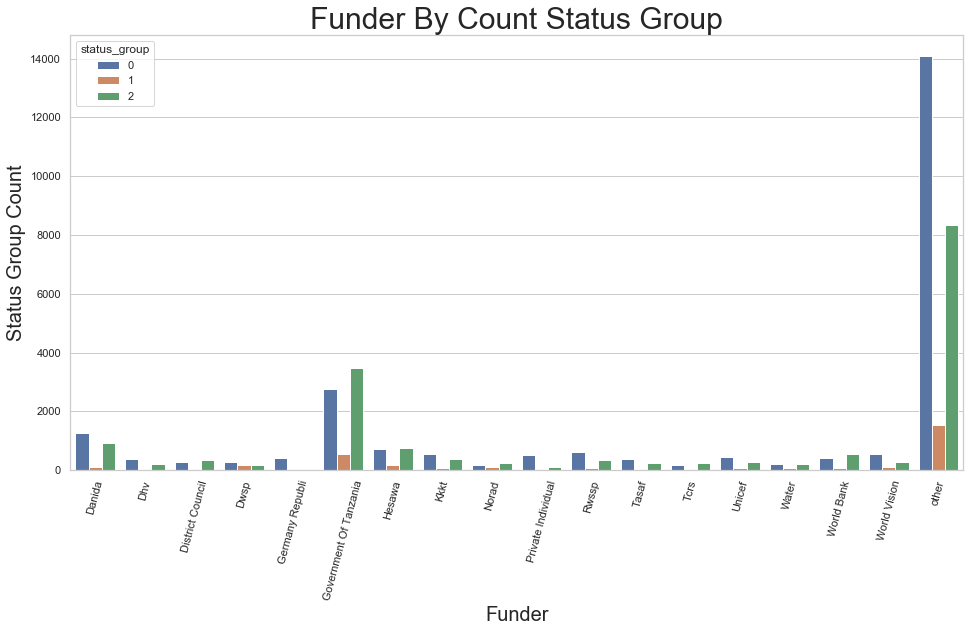

posx and posy should be finite values
posx and posy should be finite values


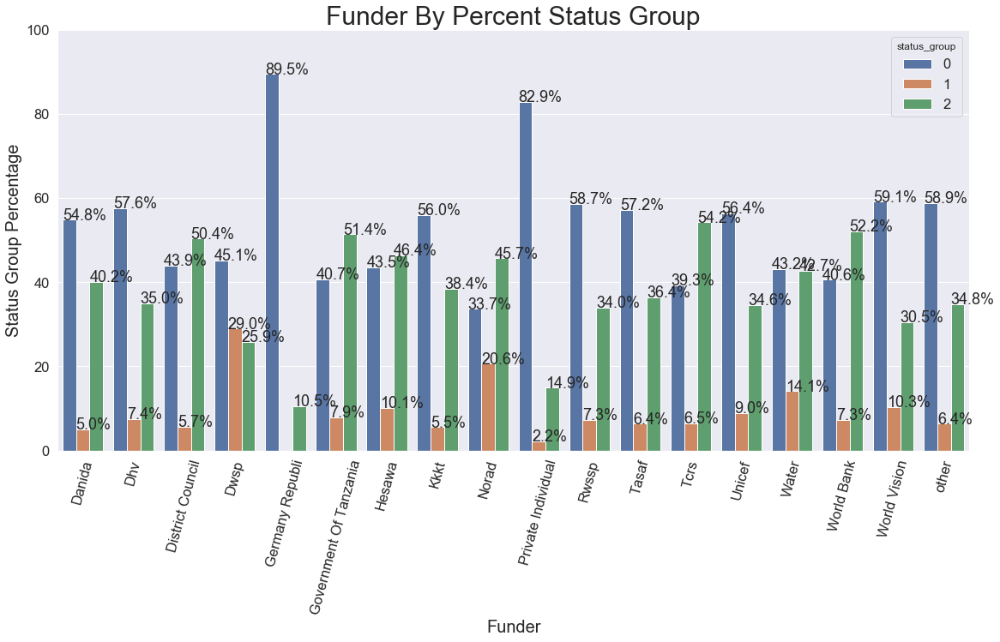

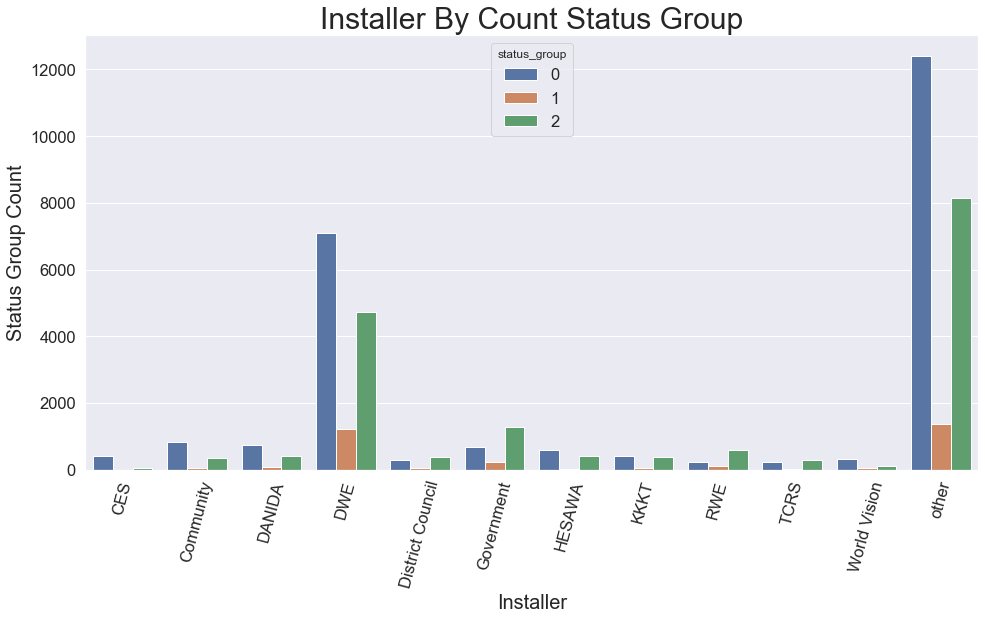

posx and posy should be finite values
posx and posy should be finite values


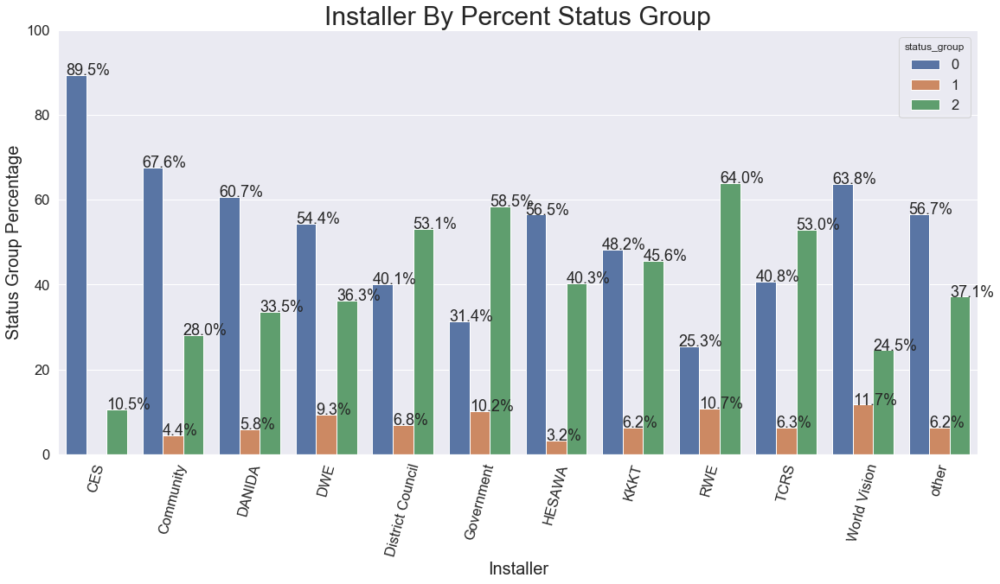

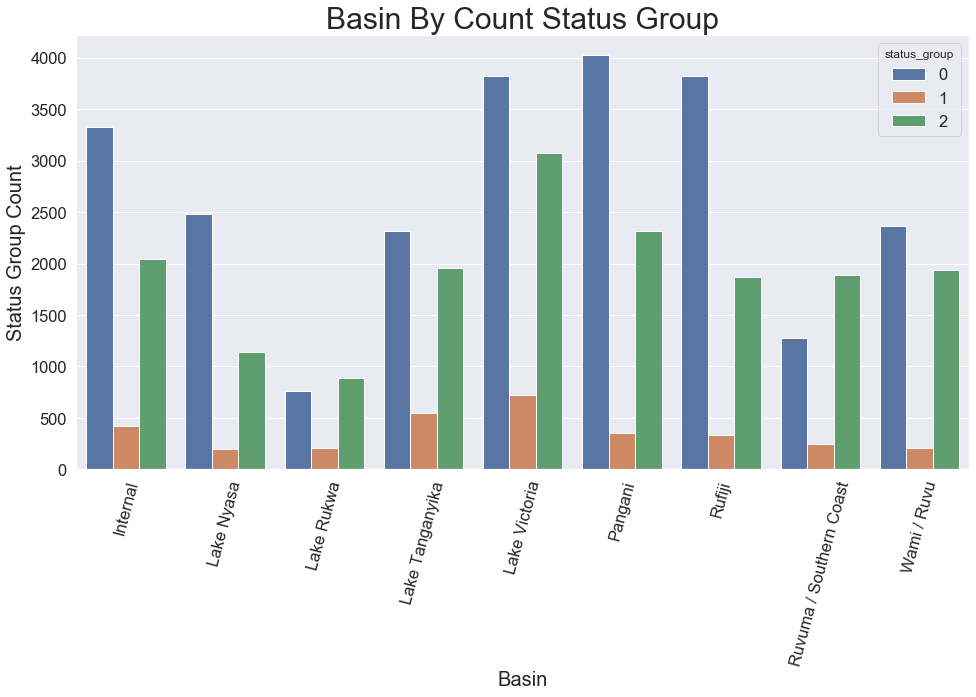

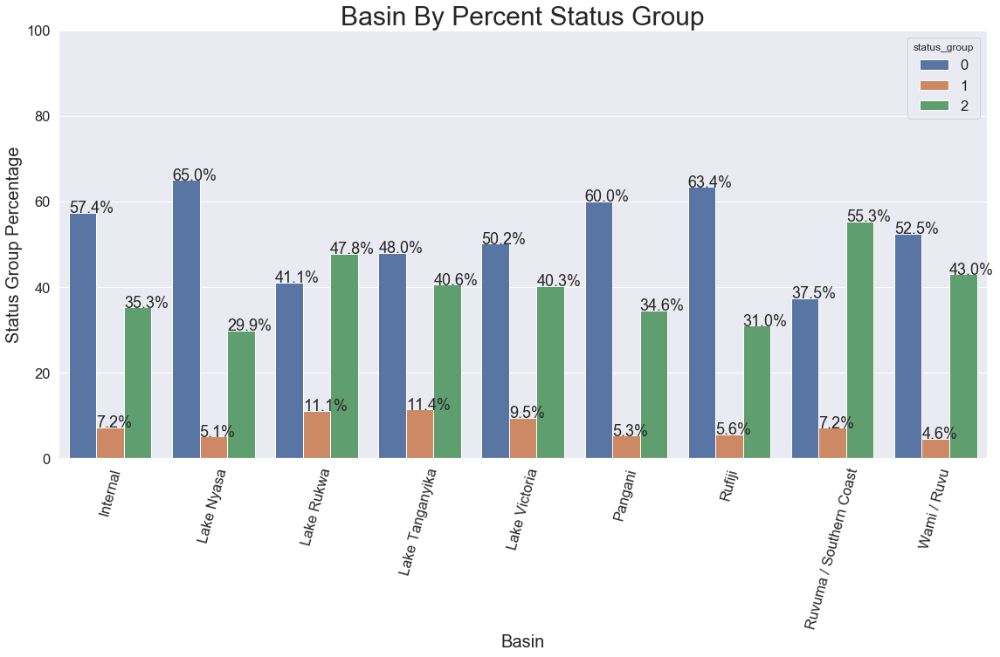

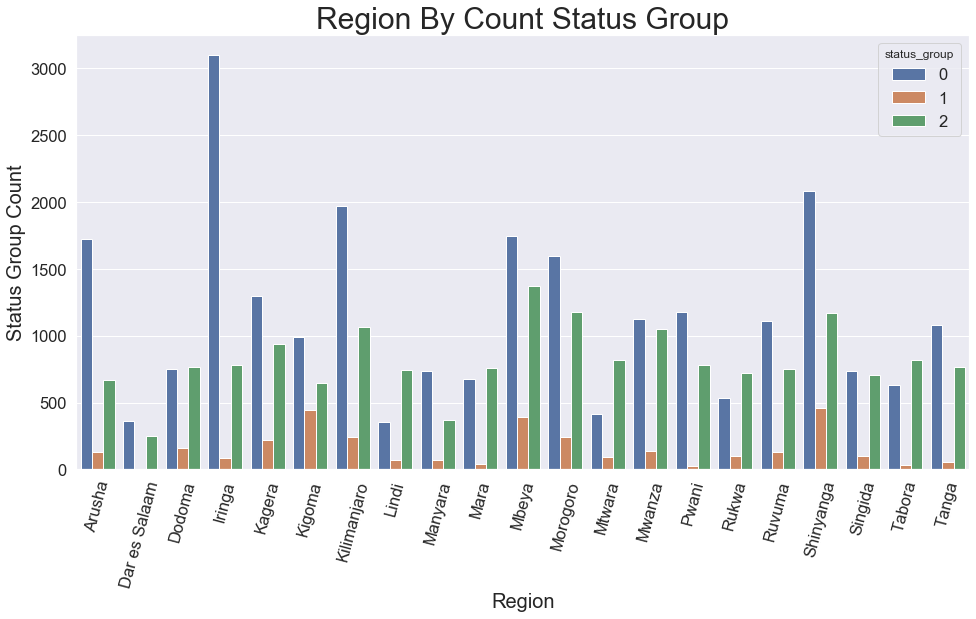

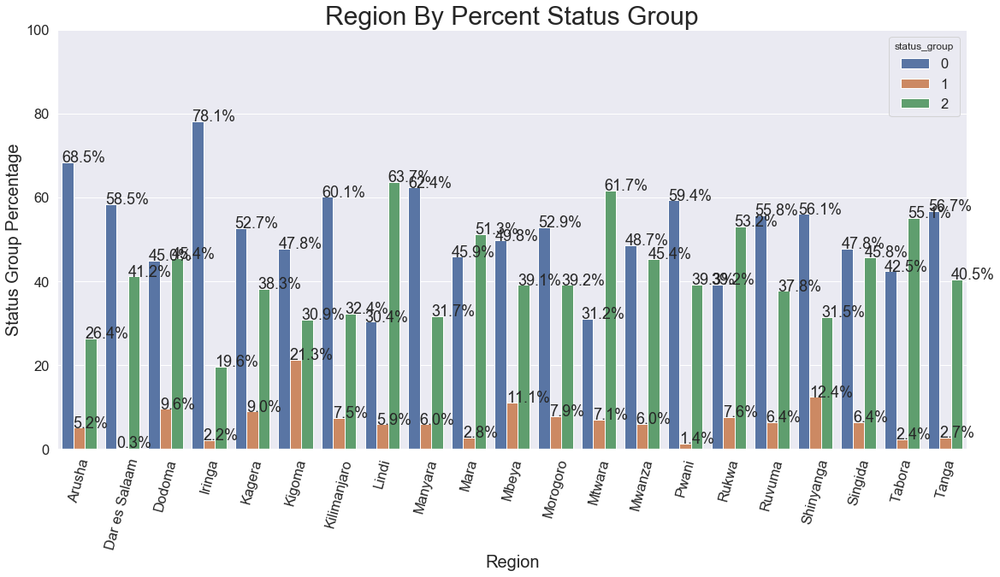

...

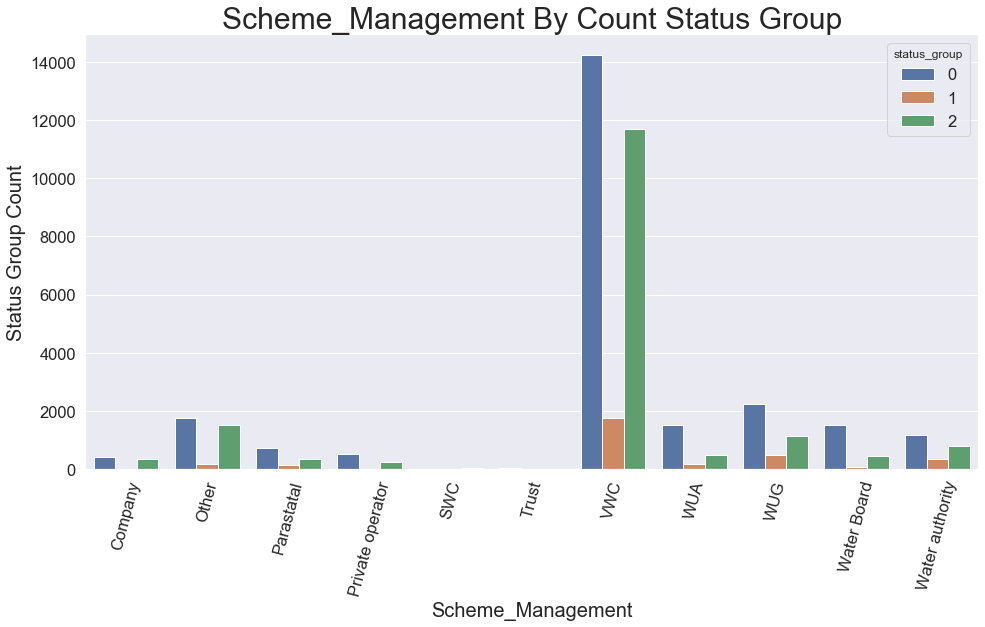

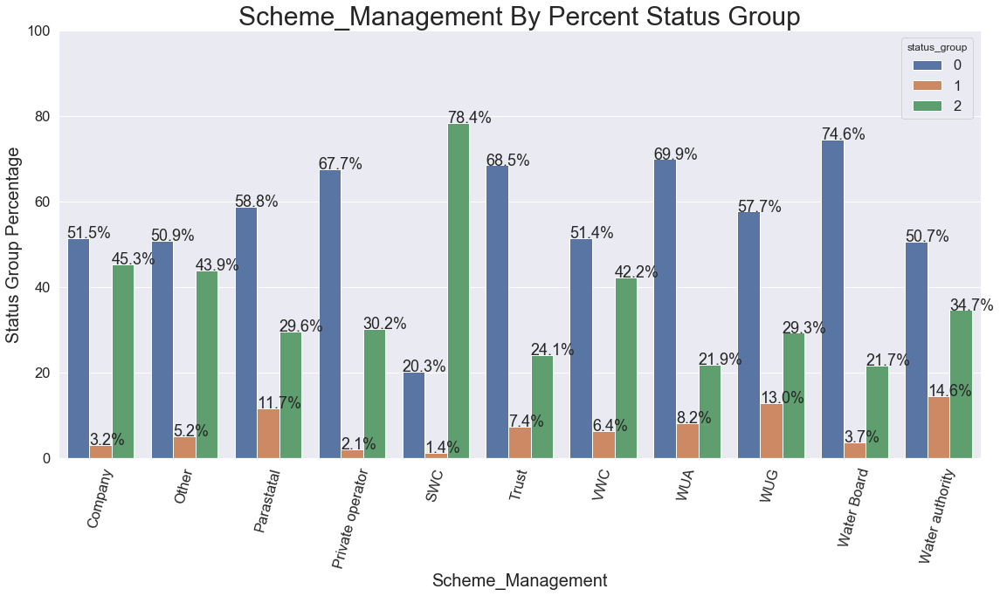

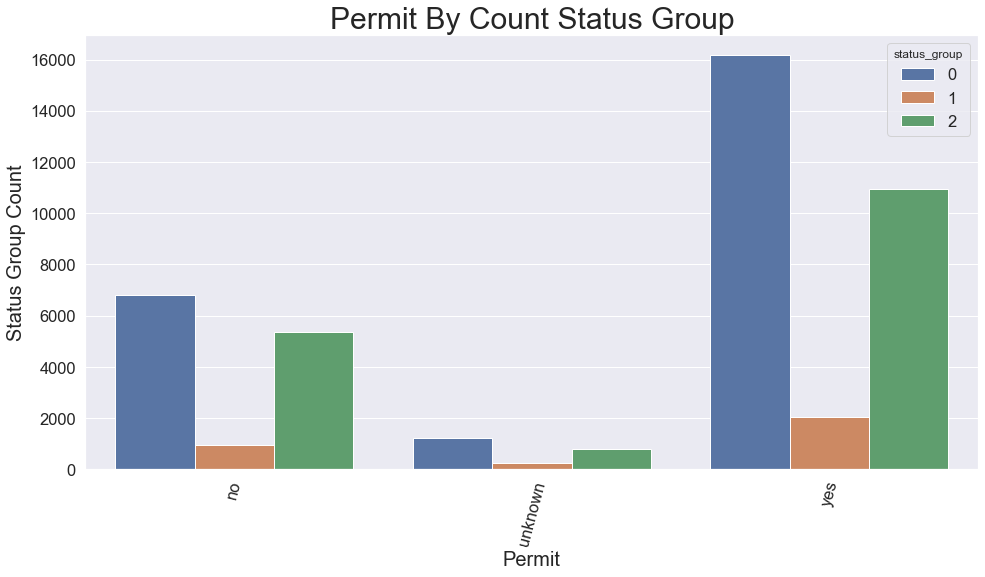

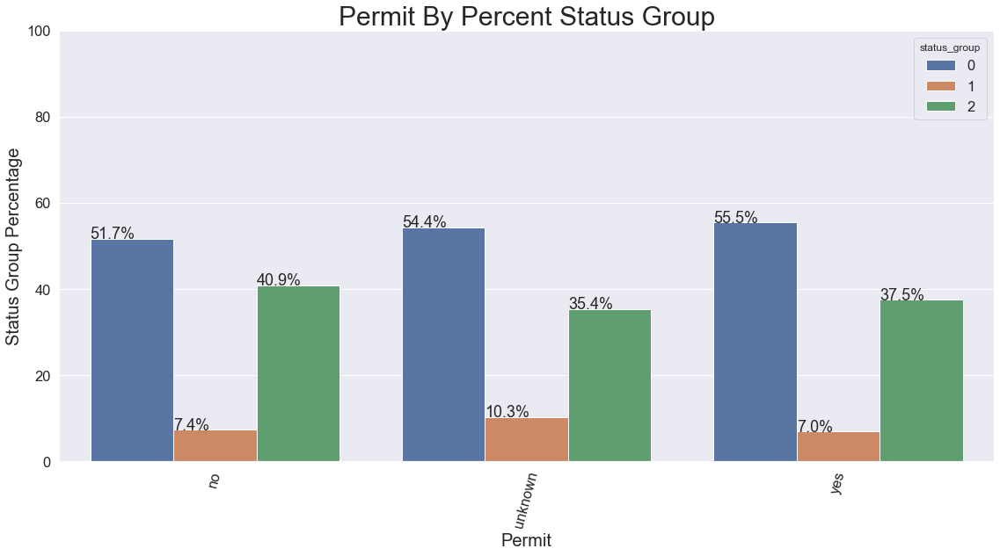

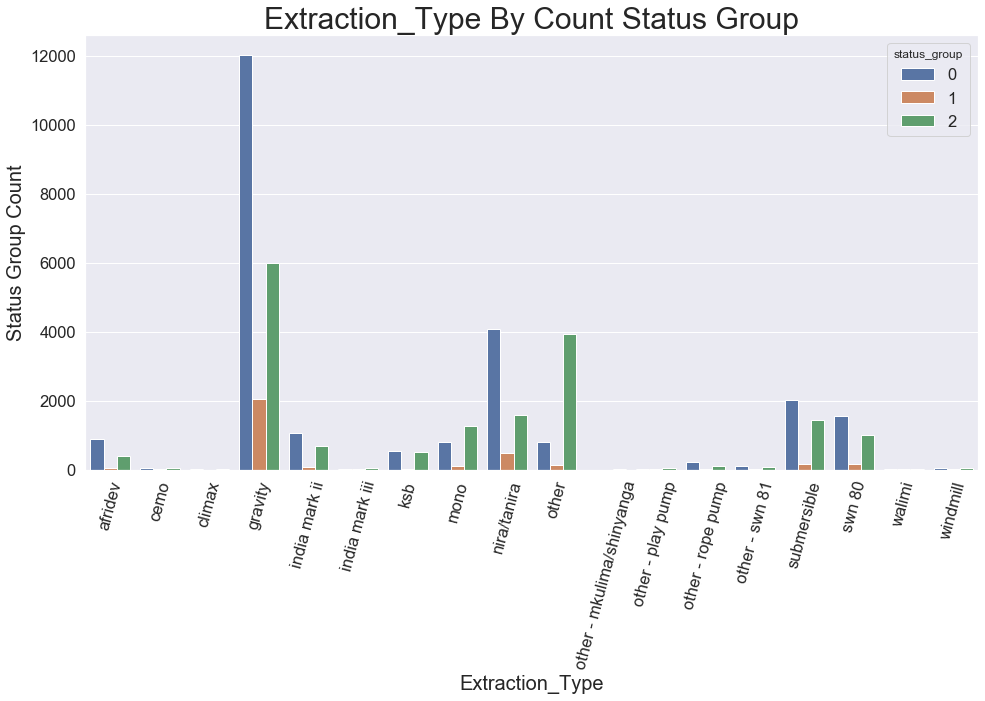

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


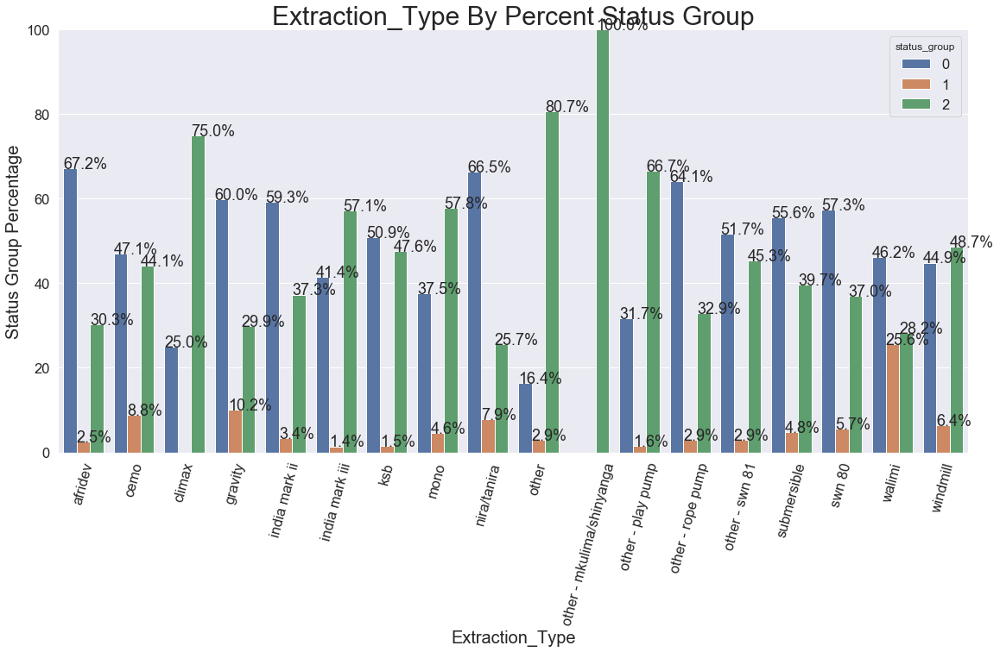

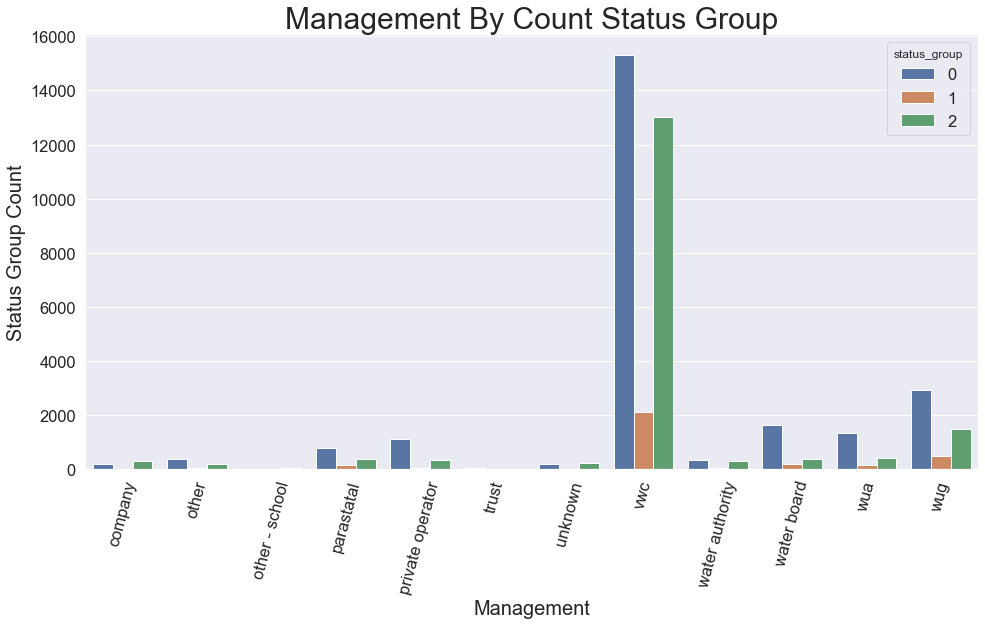

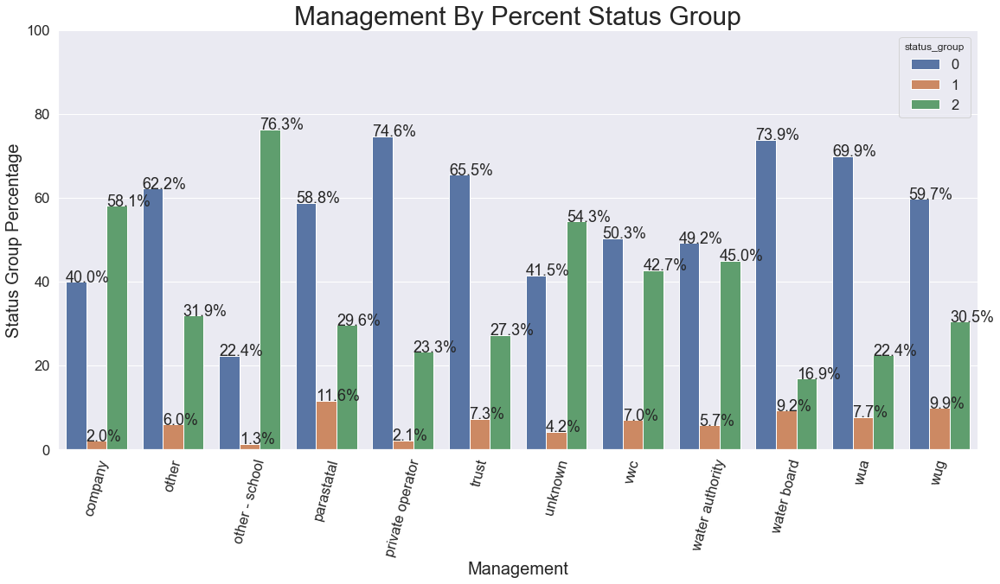

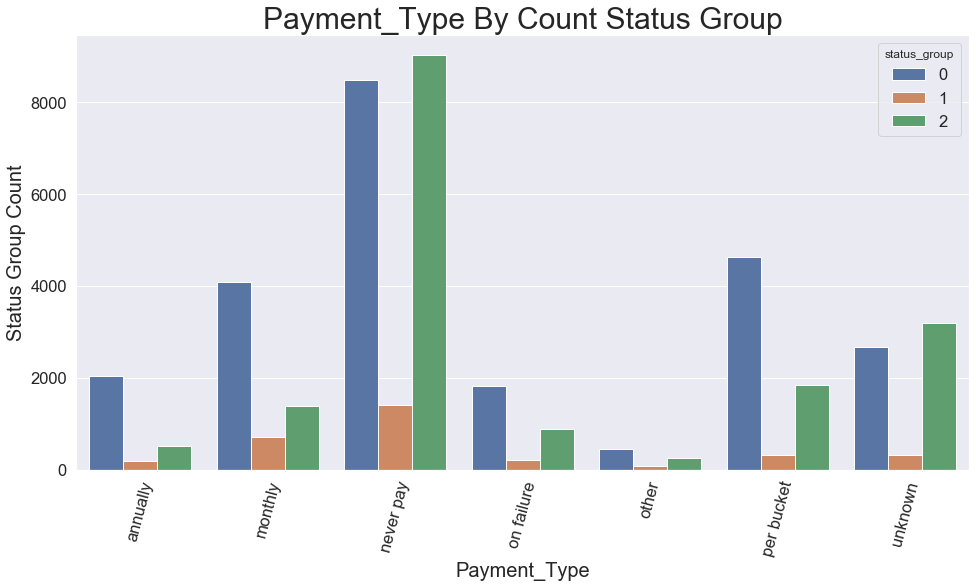

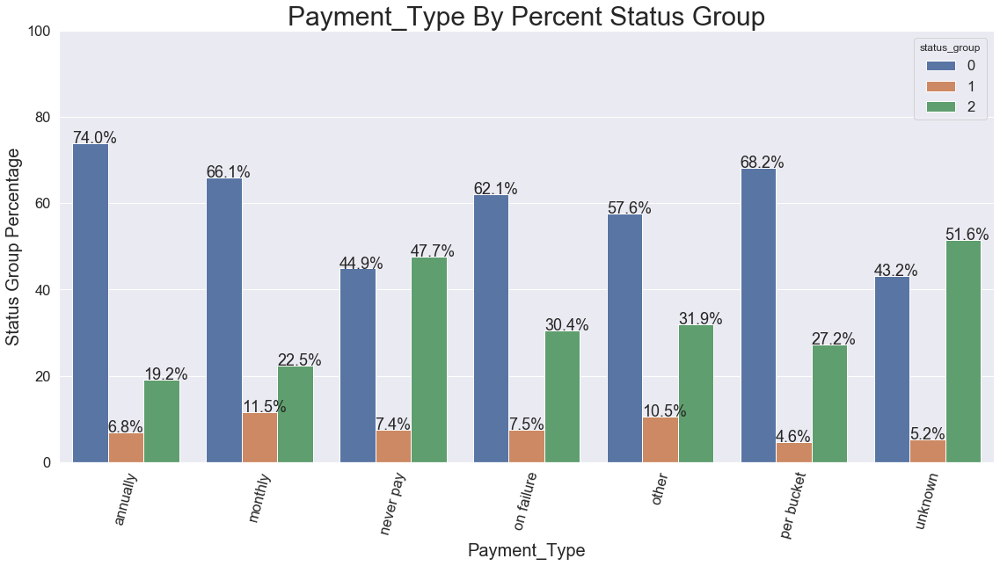

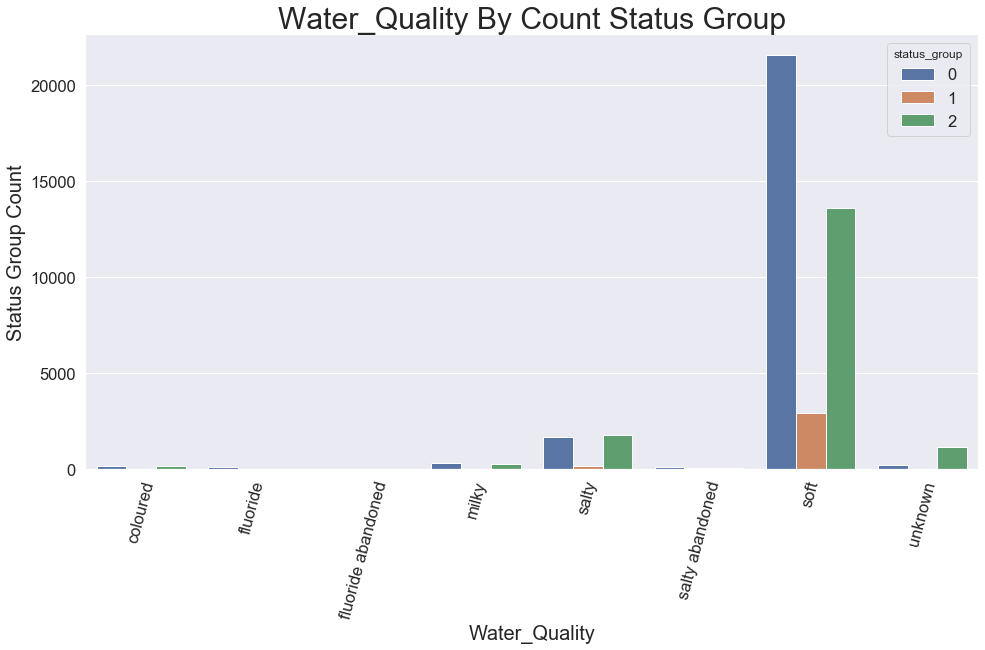

posx and posy should be finite values
posx and posy should be finite values


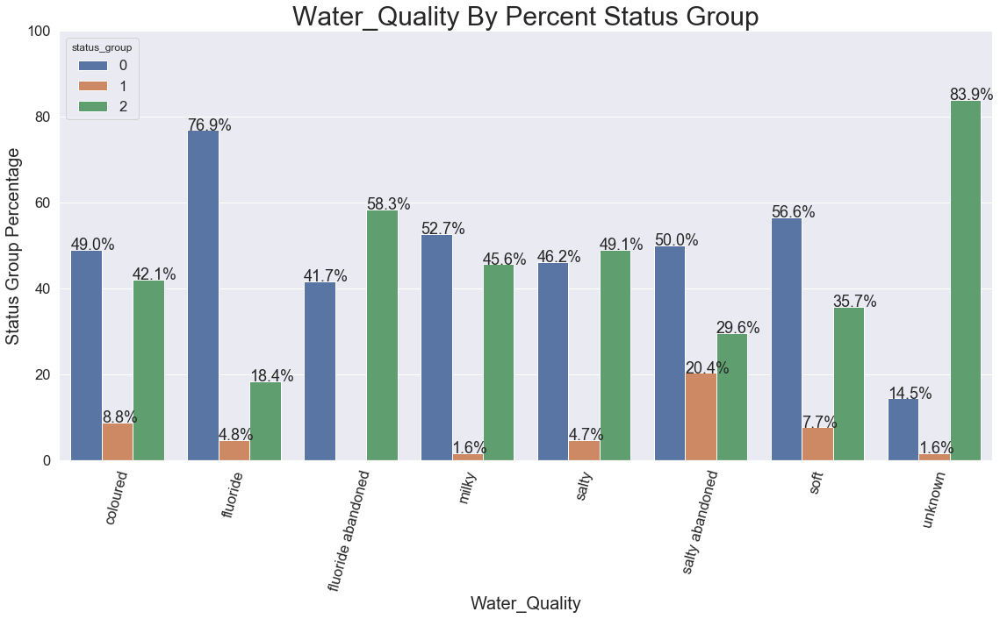

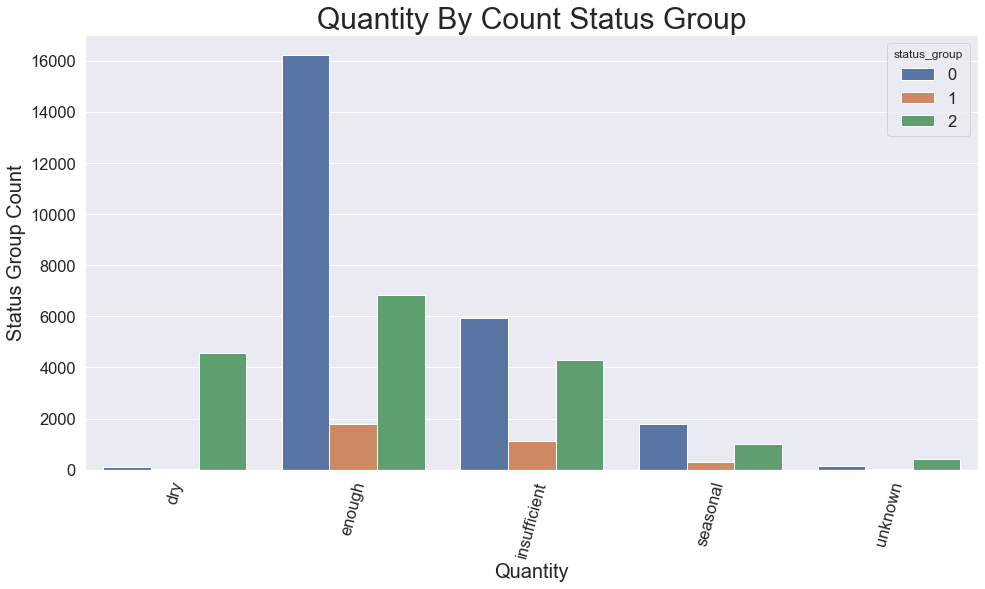

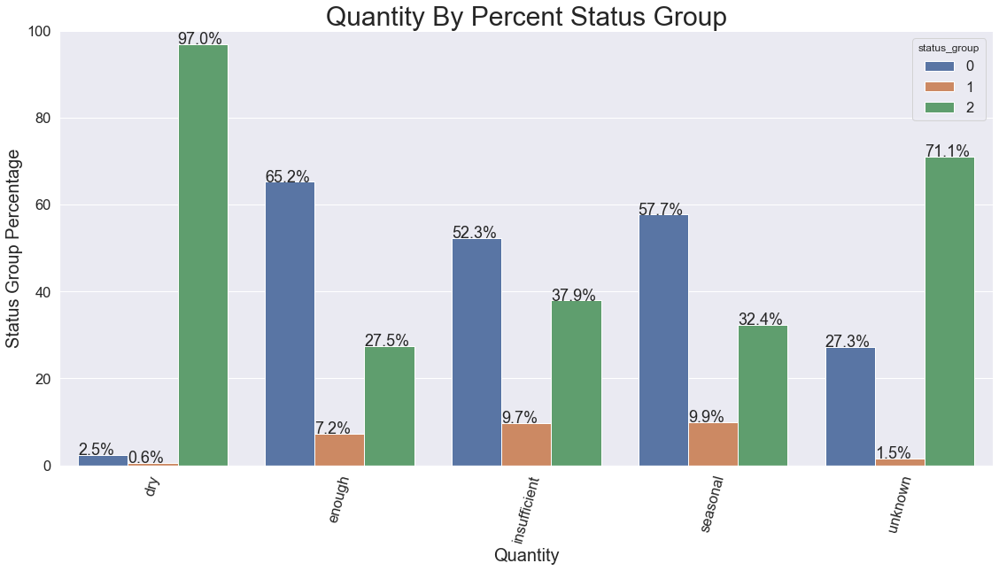

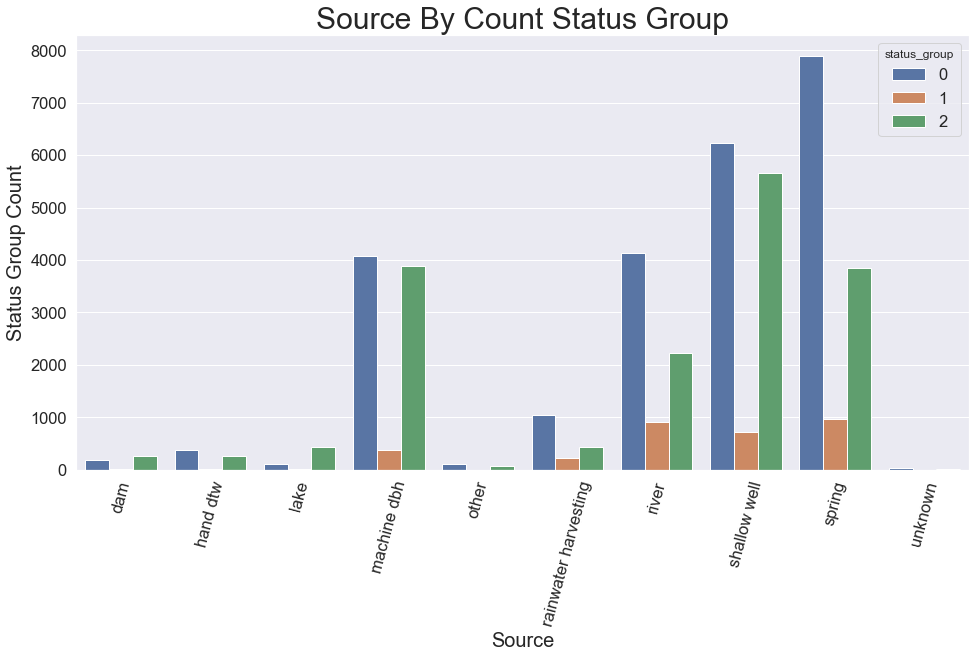

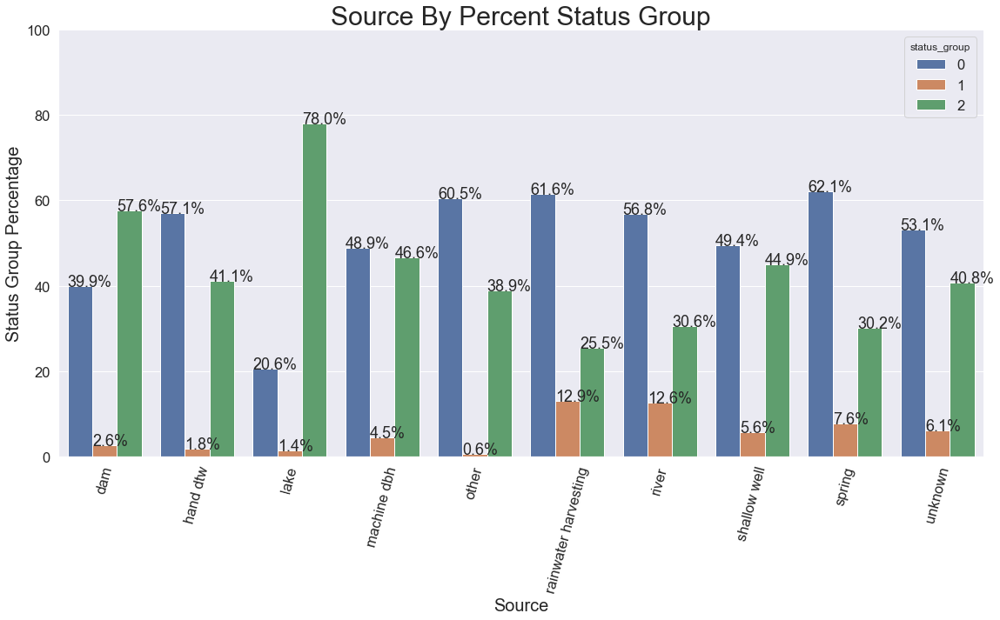

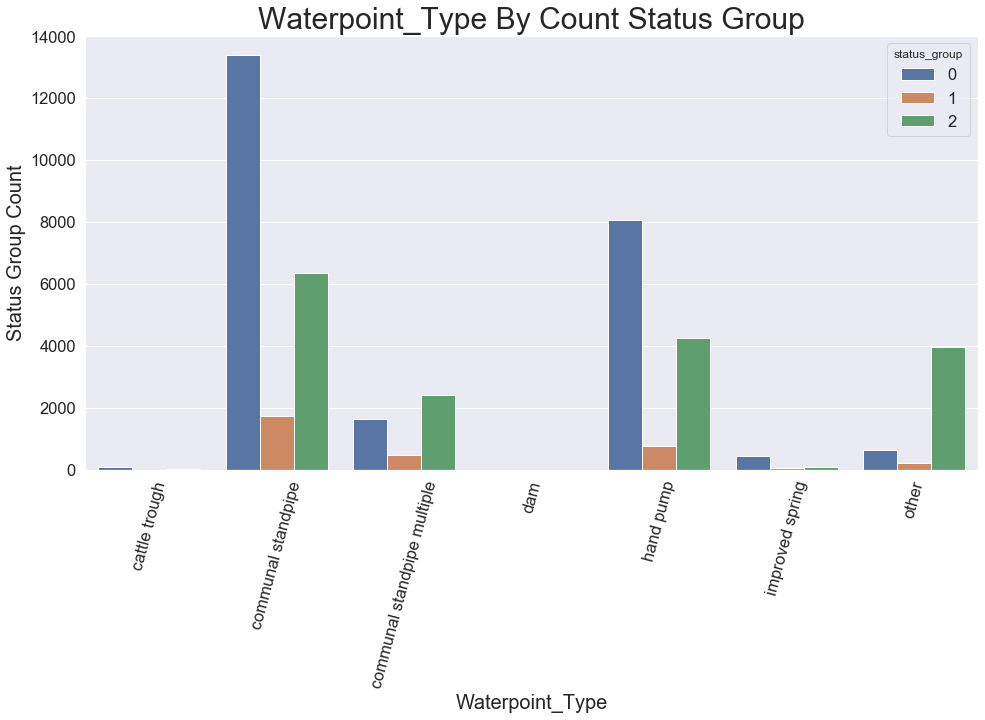

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


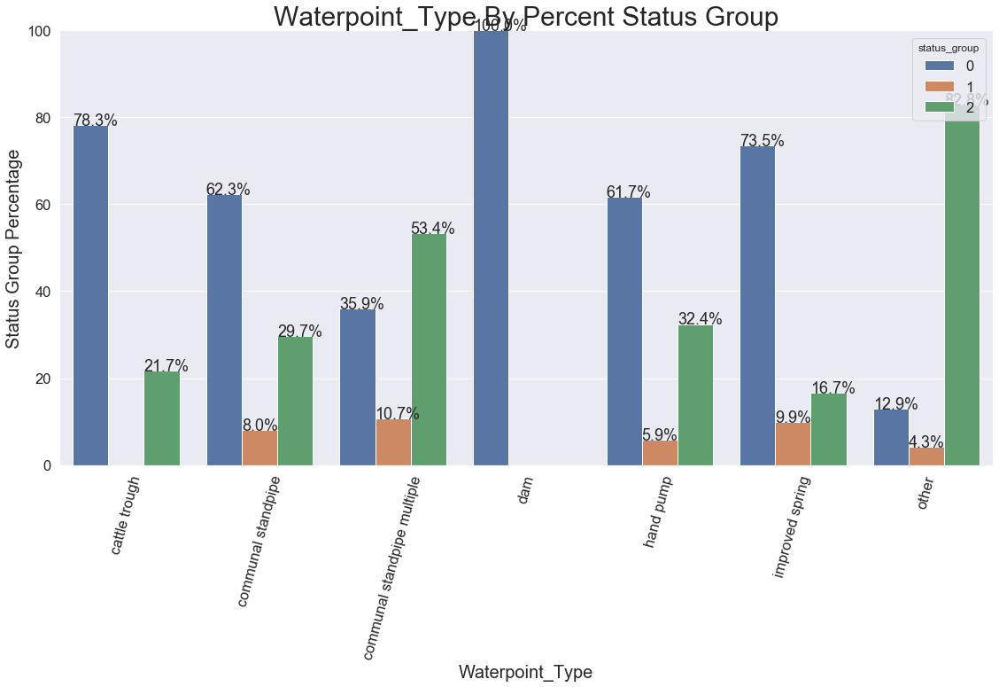

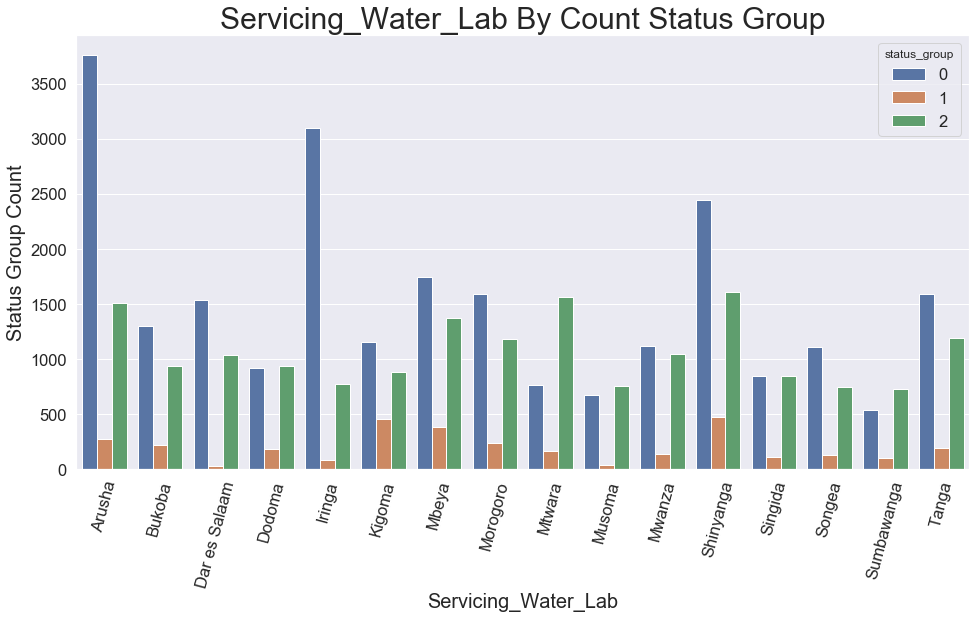

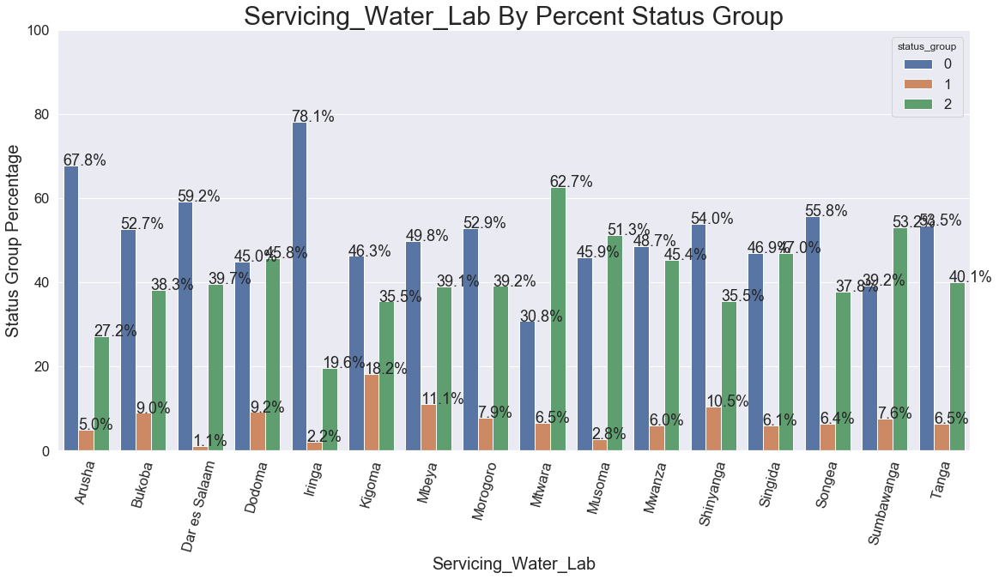

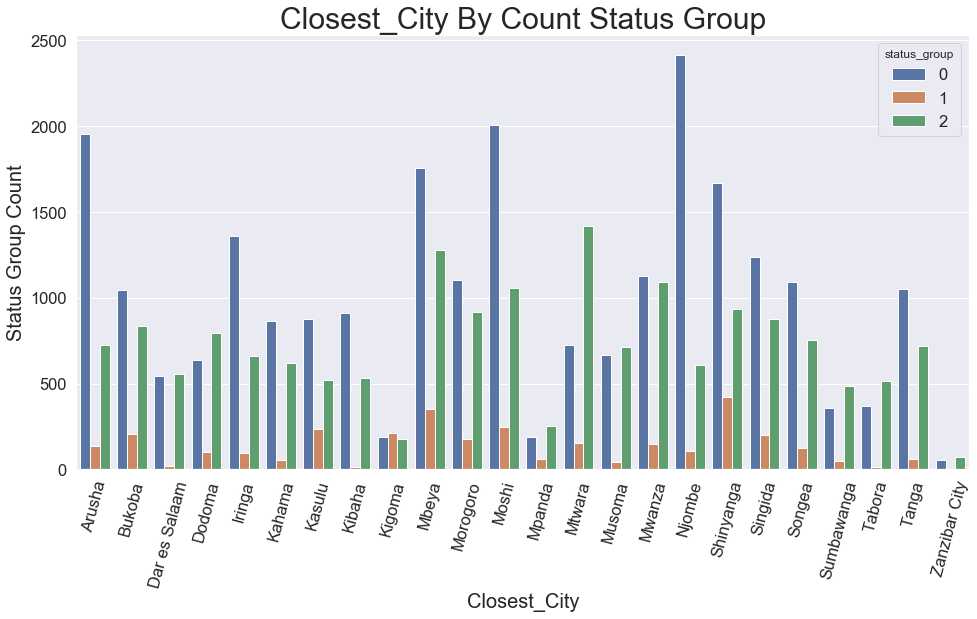

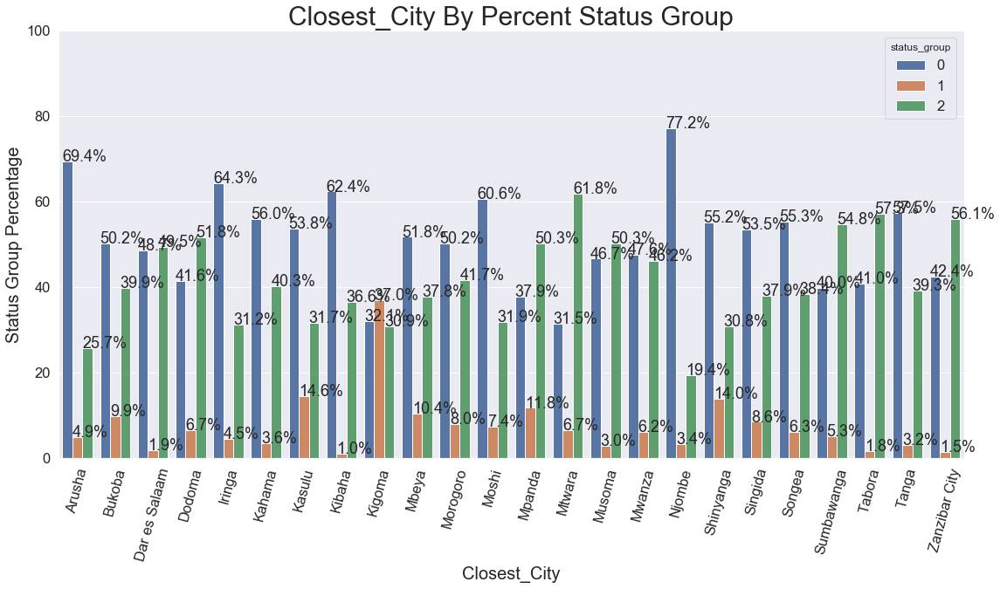

In [158]:
# Loop through the category columns and generate both plots
for col in cat_cols.drop('lga'):
    plotting_counts(train_df, col)
    plotting_percentages(train_df, col)

In [159]:
def plot_num_cols(df, col, target='status_group'):
    '''
    Generates 'boxen' type catplot on a column in a dataframe grouped by target
    
    Args:
        df (dataframe): Dataframe that contains the column and target to be 
        plotted
        col (str): Column name of the data to be plotted against the target
        target (str): Target column of the dataframe
        
    Returns:
        Catplot 'boxen' figure split by the target 
    
    Example:
        plotting_num_cols(data, 'feature_name')
    '''
# Generating the figure
    g = sns.catplot(x="status_group", y=col, data=train_df, kind='boxen', 
                    height=7, aspect=2)

# Setting the title
    plt.suptitle(f'{col.title()} and {target.title()}', fontsize=30, y=1.05)

In [160]:
# Creating list of number columns
num_cols = train_df.select_dtypes('number').columns
num_cols = num_cols.drop('status_group')
num_cols

Index(['amount_tsh', 'gps_height', 'longitude', 'latitude', 'population',
       'construction_year', 'lab_distance', 'city_distance'],
      dtype='object')

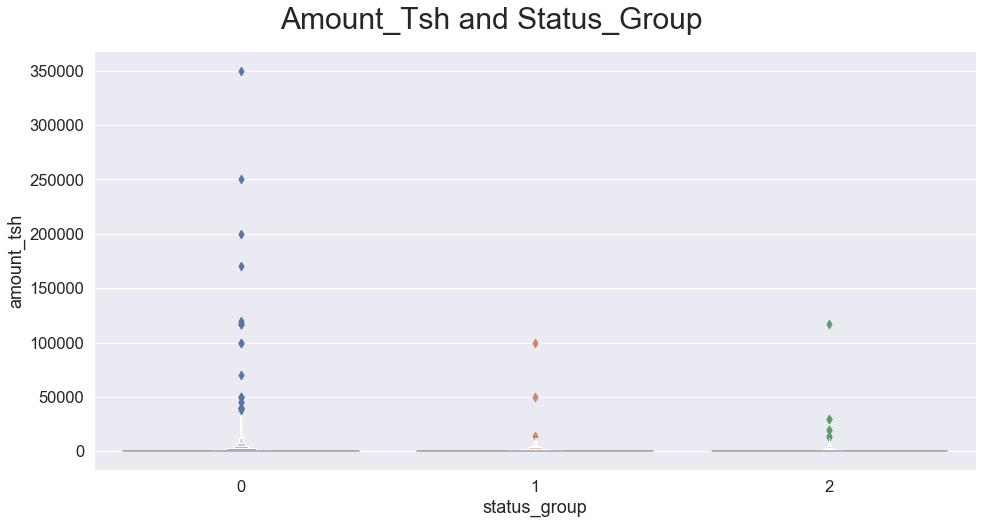

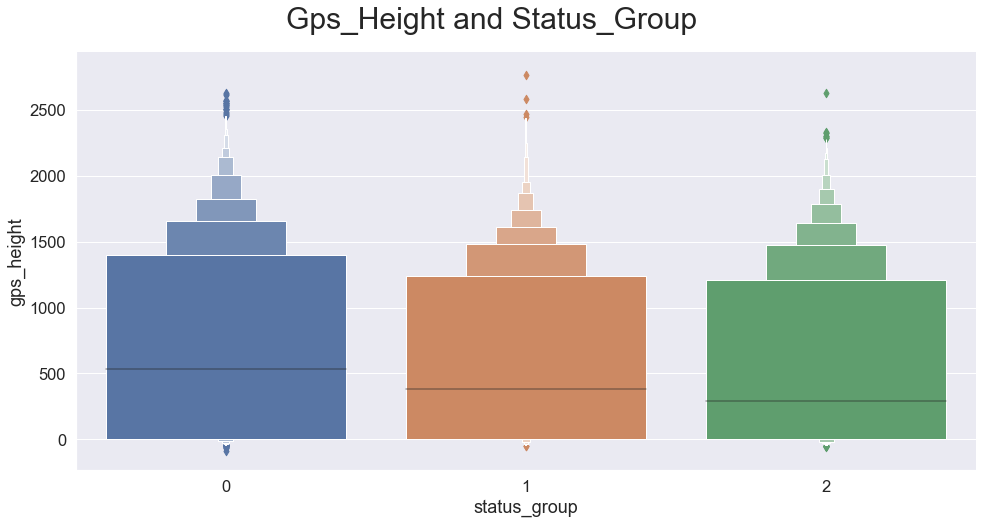

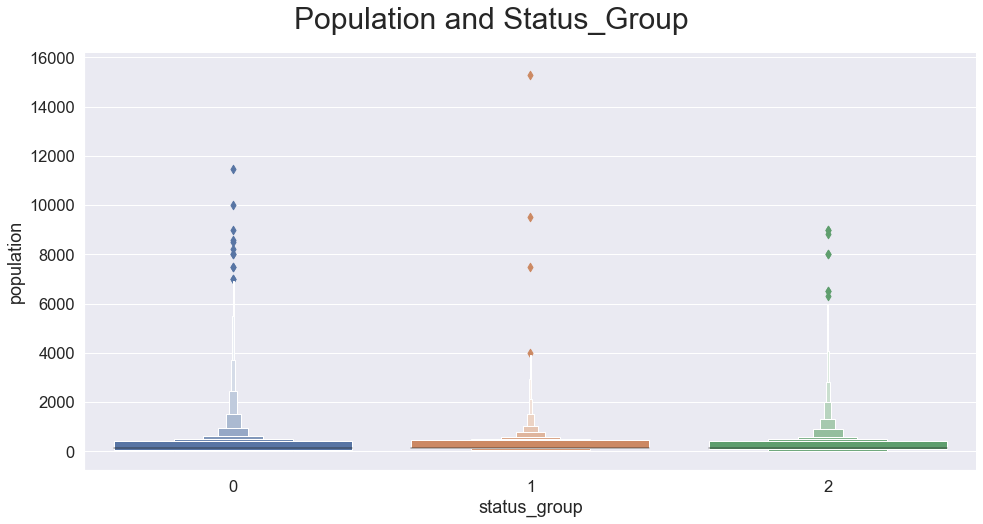

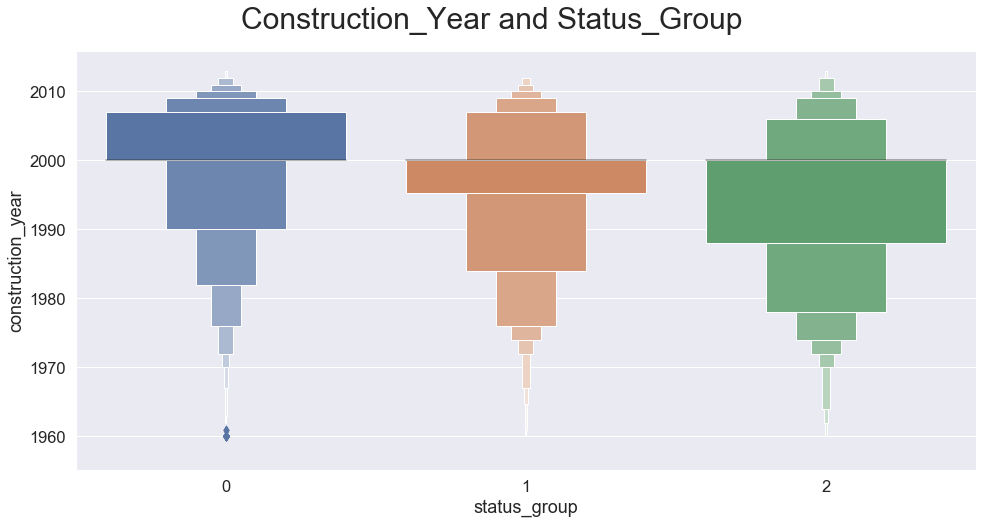

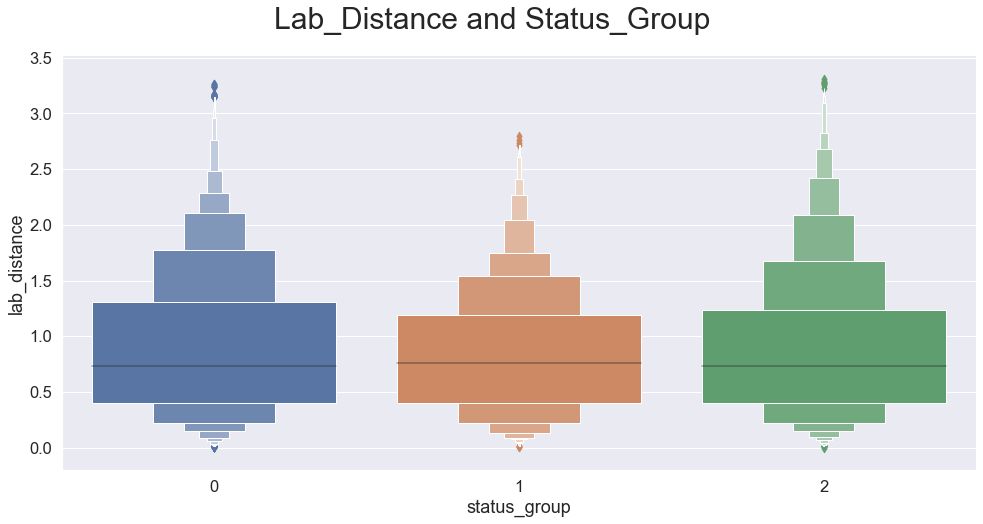

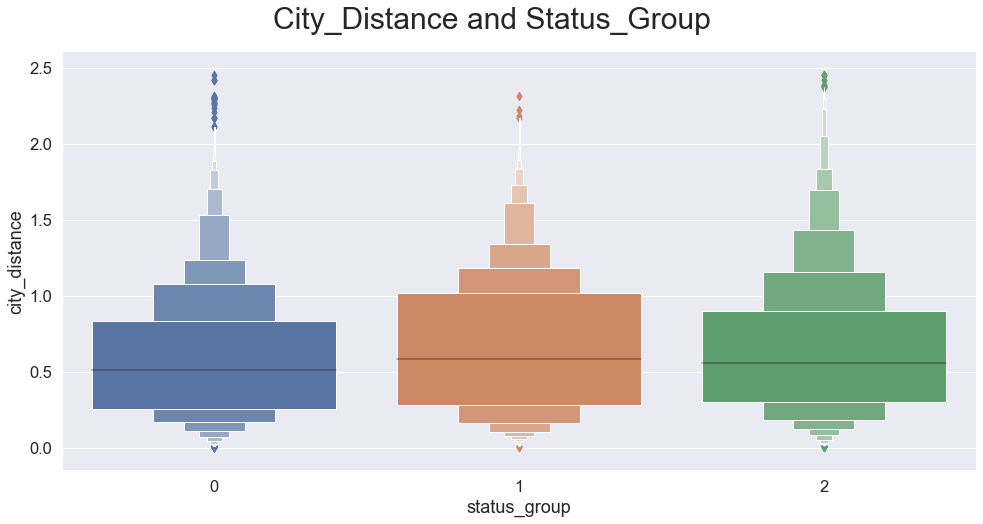

In [161]:
# Loop through each column and plot
for col in num_cols.drop(['longitude', 'latitude']):
    plot_num_cols(train_df, col)

# MODEL PREPARATION

## One Hot Encode

In [162]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)

In [163]:
# One hot encoding the categorical columns of the dataframes
ohe_train = encoder.fit_transform(X_train[cat_cols])
ohe_test = encoder.transform(X_test[cat_cols])
ohe_comp = encoder.transform(compdf[cat_cols])

In [164]:
# Getting the new names of the columns
col_names = encoder.get_feature_names(cat_cols)

In [165]:
# Turning the one hot encoded columns into a dataframe
ohe_train_df = pd.DataFrame(ohe_train, columns=col_names, index=X_train.index)
ohe_test_df = pd.DataFrame(ohe_test, columns=col_names, index=X_test.index)
ohe_comp_df = pd.DataFrame(ohe_comp, columns=col_names, index=compdf.index)

## Scaling

In [166]:
# QuantileTransformer scaler will be used as there are some number columns
# with far outliers
from sklearn.preprocessing import QuantileTransformer
qt = QuantileTransformer(random_state=123)

In [167]:
# Transforming the number columns
qt_train = qt.fit_transform(X_train[num_cols])
qt_test = qt.transform(X_test[num_cols])
qt_comp = qt.transform(compdf[num_cols])

In [168]:
# Turning the transformed number features into dataframes
qt_train_df = pd.DataFrame(qt_train, columns=X_train[num_cols].columns, 
                           index=X_train.index)
qt_test_df = pd.DataFrame(qt_test, columns=X_train[num_cols].columns, 
                          index=X_test.index)
qt_comp_df = pd.DataFrame(qt_comp, columns=X_train[num_cols].columns, 
                          index=compdf.index)

In [169]:
# Combining the categorical and number columns back together
X_train_tf = pd.concat([qt_train_df, ohe_train_df], axis=1)
X_test_tf = pd.concat([qt_test_df, ohe_test_df], axis=1)
comp_tf = pd.concat([qt_comp_df, ohe_comp_df], axis=1)

In [170]:
# Looking at the dataframe
X_train_tf.head()

,amount_tsh,gps_height,longitude,latitude,population,construction_year,lab_distance,city_distance,funder_Danida,funder_Dhv,funder_District Council,funder_Dwsp,funder_Germany Republi,funder_Government Of Tanzania,funder_Hesawa,funder_Kkkt,funder_Norad,funder_Private Individual,funder_Rwssp,funder_Tasaf,funder_Tcrs,funder_Unicef,funder_Water,funder_World Bank,funder_World Vision,funder_other,installer_CES,installer_Community,installer_DANIDA,installer_DWE,installer_District Council,installer_Government,installer_HESAWA,installer_KKKT,installer_RWE,installer_TCRS,installer_World Vision,installer_other,basin_Internal,basin_Lake Nyasa,...,servicing_water_lab_Arusha,servicing_water_lab_Bukoba,servicing_water_lab_Dar es Salaam,servicing_water_lab_Dodoma,servicing_water_lab_Iringa,servicing_water_lab_Kigoma,servicing_water_lab_Mbeya,servicing_water_lab_Morogoro,servicing_water_lab_Mtwara,servicing_water_lab_Musoma,servicing_water_lab_Mwanza,servicing_water_lab_Shinyanga,servicing_water_lab_Singida,servicing_water_lab_Songea,servicing_water_lab_Sumbawanga,servicing_water_lab_Tanga,closest_city_Arusha,closest_city_Bukoba,closest_city_Dar es Salaam,closest_city_Dodoma,closest_city_Iringa,closest_city_Kahama,closest_city_Kasulu,closest_city_Kibaha,closest_city_Kigoma,closest_city_Mbeya,closest_city_Morogoro,closest_city_Moshi,closest_city_Mpanda,closest_city_Mtwara,closest_city_Musoma,closest_city_Mwanza,closest_city_Njombe,closest_city_Shinyanga,closest_city_Singida,closest_city_Songea,closest_city_Sumbawanga,closest_city_Tabora,closest_city_Tanga,closest_city_Zanzibar City
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2218,0.000,0.532,0.847,0.581,0.300,0.002,0.728,0.901,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000
41466,0.000,0.828,0.361,0.943,0.645,0.892,0.303,0.443,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
49804,0.000,0.603,0.706,0.699,0.869,0.968,0.142,0.218,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
65860,0.000,0.199,0.303,0.195,0.442,0.499,0.114,0.177,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
15139,0.000,0.764,0.866,0.569,0.000,0.004,0.602,0.767,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.0

In [171]:
# Looking at the dataframe
X_test_tf.head()

,amount_tsh,gps_height,longitude,latitude,population,construction_year,lab_distance,city_distance,funder_Danida,funder_Dhv,funder_District Council,funder_Dwsp,funder_Germany Republi,funder_Government Of Tanzania,funder_Hesawa,funder_Kkkt,funder_Norad,funder_Private Individual,funder_Rwssp,funder_Tasaf,funder_Tcrs,funder_Unicef,funder_Water,funder_World Bank,funder_World Vision,funder_other,installer_CES,installer_Community,installer_DANIDA,installer_DWE,installer_District Council,installer_Government,installer_HESAWA,installer_KKKT,installer_RWE,installer_TCRS,installer_World Vision,installer_other,basin_Internal,basin_Lake Nyasa,...,servicing_water_lab_Arusha,servicing_water_lab_Bukoba,servicing_water_lab_Dar es Salaam,servicing_water_lab_Dodoma,servicing_water_lab_Iringa,servicing_water_lab_Kigoma,servicing_water_lab_Mbeya,servicing_water_lab_Morogoro,servicing_water_lab_Mtwara,servicing_water_lab_Musoma,servicing_water_lab_Mwanza,servicing_water_lab_Shinyanga,servicing_water_lab_Singida,servicing_water_lab_Songea,servicing_water_lab_Sumbawanga,servicing_water_lab_Tanga,closest_city_Arusha,closest_city_Bukoba,closest_city_Dar es Salaam,closest_city_Dodoma,closest_city_Iringa,closest_city_Kahama,closest_city_Kasulu,closest_city_Kibaha,closest_city_Kigoma,closest_city_Mbeya,closest_city_Morogoro,closest_city_Moshi,closest_city_Mpanda,closest_city_Mtwara,closest_city_Musoma,closest_city_Mwanza,closest_city_Njombe,closest_city_Shinyanga,closest_city_Singida,closest_city_Songea,closest_city_Sumbawanga,closest_city_Tabora,closest_city_Tanga,closest_city_Zanzibar City
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
61898,0.000,0.199,0.217,0.128,0.442,0.499,0.435,0.592,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,1.000,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
74121,0.000,0.199,0.158,0.792,0.869,0.499,0.690,0.562,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
6464,0.998,0.897,0.429,0.178,0.225,0.025,0.889,0.309,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
46594,0.718,0.646,0.662,0.692,0.442,0.499,0.101,0.156,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
54244,0.000,0.199,0.312,0.763,0.869,0.499,0.304,0.444,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.0

In [172]:
# Looking at the dataframe
comp_tf.head()

,amount_tsh,gps_height,longitude,latitude,population,construction_year,lab_distance,city_distance,funder_Danida,funder_Dhv,funder_District Council,funder_Dwsp,funder_Germany Republi,funder_Government Of Tanzania,funder_Hesawa,funder_Kkkt,funder_Norad,funder_Private Individual,funder_Rwssp,funder_Tasaf,funder_Tcrs,funder_Unicef,funder_Water,funder_World Bank,funder_World Vision,funder_other,installer_CES,installer_Community,installer_DANIDA,installer_DWE,installer_District Council,installer_Government,installer_HESAWA,installer_KKKT,installer_RWE,installer_TCRS,installer_World Vision,installer_other,basin_Internal,basin_Lake Nyasa,...,servicing_water_lab_Arusha,servicing_water_lab_Bukoba,servicing_water_lab_Dar es Salaam,servicing_water_lab_Dodoma,servicing_water_lab_Iringa,servicing_water_lab_Kigoma,servicing_water_lab_Mbeya,servicing_water_lab_Morogoro,servicing_water_lab_Mtwara,servicing_water_lab_Musoma,servicing_water_lab_Mwanza,servicing_water_lab_Shinyanga,servicing_water_lab_Singida,servicing_water_lab_Songea,servicing_water_lab_Sumbawanga,servicing_water_lab_Tanga,closest_city_Arusha,closest_city_Bukoba,closest_city_Dar es Salaam,closest_city_Dodoma,closest_city_Iringa,closest_city_Kahama,closest_city_Kasulu,closest_city_Kibaha,closest_city_Kigoma,closest_city_Mbeya,closest_city_Morogoro,closest_city_Moshi,closest_city_Mpanda,closest_city_Mtwara,closest_city_Musoma,closest_city_Mwanza,closest_city_Njombe,closest_city_Shinyanga,closest_city_Singida,closest_city_Songea,closest_city_Sumbawanga,closest_city_Tabora,closest_city_Tanga,closest_city_Zanzibar City
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
50785,0.000,0.979,0.536,0.637,0.703,0.987,0.831,0.779,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000
51630,0.000,0.869,0.662,0.761,0.685,0.499,0.020,0.031,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
17168,0.000,0.868,0.475,0.504,0.869,0.935,0.094,0.146,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000
45559,0.000,0.451,0.845,0.128,0.645,0.162,0.966,0.999,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
49871,0.894,0.716,0.514,0.018,0.225,0.499,0.478,0.640,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.

## SMOTE

In [173]:
# Importing the SMOTE packages
import six
import sys
sys.modules['sklearn.externals.six'] = six
from imblearn.over_sampling import SMOTENC

In [174]:
# Getting a list of categorical columns after tranforming
cat_cols_tf = list(X_train_tf.columns)
print('Starting lenghth of all columns:', len(cat_cols_tf))
print('Length of num_cols:', len(num_cols))
for col in num_cols:
    cat_cols_tf.remove(col)
print('Length of categorical columns after OHE:', len(cat_cols_tf))

Starting lenghth of all columns: 316
Length of num_cols: 8
Length of categorical columns after OHE: 308


In [175]:
# Creating a mask of categorical features
mask = []
for col in X_train_tf.columns:
    if col in cat_cols_tf:
        mask.append(True)
    else:
        mask.append(False)

In [176]:
# Distribution of classes before SMOTE
y_train.value_counts(1)

0   0.543
2   0.384
1   0.073
Name: status_group, dtype: float64

In [177]:
# SMOTEing my dataframes
smote = SMOTENC(categorical_features=mask, random_state=123, n_jobs=-1)
X_train_smote, y_train_smote = smote.fit_resample(X_train_tf, y_train)

In [178]:
# Turning the SMOTEd y into a series
y_train_smote = pd.Series(y_train_smote)

In [179]:
# Distributuion of classes after SMOTE
y_train_smote.value_counts(1)

2   0.333
1   0.333
0   0.333
dtype: float64

In [180]:
# Turning the SMOTEd X into a dataframe
X_train_smote = pd.DataFrame(X_train_smote, columns=X_train_tf.columns)
X_train_smote.head()

,amount_tsh,gps_height,longitude,latitude,population,construction_year,lab_distance,city_distance,funder_Danida,funder_Dhv,funder_District Council,funder_Dwsp,funder_Germany Republi,funder_Government Of Tanzania,funder_Hesawa,funder_Kkkt,funder_Norad,funder_Private Individual,funder_Rwssp,funder_Tasaf,funder_Tcrs,funder_Unicef,funder_Water,funder_World Bank,funder_World Vision,funder_other,installer_CES,installer_Community,installer_DANIDA,installer_DWE,installer_District Council,installer_Government,installer_HESAWA,installer_KKKT,installer_RWE,installer_TCRS,installer_World Vision,installer_other,basin_Internal,basin_Lake Nyasa,...,servicing_water_lab_Arusha,servicing_water_lab_Bukoba,servicing_water_lab_Dar es Salaam,servicing_water_lab_Dodoma,servicing_water_lab_Iringa,servicing_water_lab_Kigoma,servicing_water_lab_Mbeya,servicing_water_lab_Morogoro,servicing_water_lab_Mtwara,servicing_water_lab_Musoma,servicing_water_lab_Mwanza,servicing_water_lab_Shinyanga,servicing_water_lab_Singida,servicing_water_lab_Songea,servicing_water_lab_Sumbawanga,servicing_water_lab_Tanga,closest_city_Arusha,closest_city_Bukoba,closest_city_Dar es Salaam,closest_city_Dodoma,closest_city_Iringa,closest_city_Kahama,closest_city_Kasulu,closest_city_Kibaha,closest_city_Kigoma,closest_city_Mbeya,closest_city_Morogoro,closest_city_Moshi,closest_city_Mpanda,closest_city_Mtwara,closest_city_Musoma,closest_city_Mwanza,closest_city_Njombe,closest_city_Shinyanga,closest_city_Singida,closest_city_Songea,closest_city_Sumbawanga,closest_city_Tabora,closest_city_Tanga,closest_city_Zanzibar City
0,0.000,0.532,0.847,0.581,0.300,0.002,0.728,0.901,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000
1,0.000,0.828,0.361,0.943,0.645,0.892,0.303,0.443,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,0.000,0.603,0.706,0.699,0.869,0.968,0.142,0.218,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,0.000,0.199,0.303,0.195,0.442,0.499,0.114,0.177,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,0.000,0.764,0.866,0.569,0.000,0.004,0.602,0.767,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00

In [181]:
# Looking at the shapes
print(X_train_smote.shape)
print(y_train_smote.shape)

(72582, 316)
(72582,)


## Model Evaluation Function

In [183]:
# Importing necessary packages
import sklearn.metrics as metrics
from yellowbrick.classifier import ROCAUC

In [184]:
def make_classification_report(model, y_true, x_test, title=''):
    
    '''
    Generate and return the classification report for a model.
    
    Args: 
        Model (classification model): SKlearn compatable model.
        y_true (series or array): True labels to compare predictions
        x_test (dataframe or array): X data to generate predictions for
        title (str): Title for the report
        
    Returns:
        Dictionary of the classification results
    
    Example:
        make_classification_report(logreg_model, y_test, X_test, 
                                    title='Logistic Regression Model')
        
        '''
# Generate predictions
    y_preds = model.predict(x_test)
    print('__________________________________________________________________')
    print(f'CLASSIFICATION REPORT FOR: \n\t{title}')
    print('__________________________________________________________________')
    print('\n')
    report = metrics.classification_report(y_true, y_preds, 
                                    target_names=['functional', 'needs repair', 
                                             'nonfunctional'])
    report_dict = metrics.classification_report(y_true, y_preds, output_dict=True,
                            target_names=['functional', 'needs repair', 
                                     'nonfunctional'])
# Add the title to the report dictionary
    report_dict['title'] = title
    print(report)
    print('__________________________________________________________________')
    return report_dict

In [185]:
def plot_confusion_matrix(model, X, y, title=''):
    '''
    Plots the normalized confusion matrix for a model
    
    Args:
        Model (classification model): SKlearn compatable model
        X (dataframe or array): feature columns of a dataframe
        y (series or array): target column of a dataframe
        title (str): Title for the matrix
    
    Returns:
        Plotted figure of the confusion matrix for the model
    
    Example:
        plot_confusion_matrix(logreg_model, X_test, y_test, 
        title='Logistic Regression Model')
    '''
    
# Plot the matrix with labels    
    fig = metrics.plot_confusion_matrix(model, X, y, normalize='true', 
                                        cmap='Greens',
                                 display_labels=['functional', 'needs repair', 
                                             'nonfunctional'])
# Remove grid lines
    plt.grid(False)
    
# Set title
    plt.title(f'Confusion Matrix For {title}', fontdict={'fontsize':17})
    plt.show()
    print('__________________________________________________________________')
    return fig

In [186]:
def plot_ROC_curve(model, xtrain, ytrain, xtest, ytest):
    '''
    Plots the ROC AUC curves for a model
    
    Args:
        Model (classification model): SKlearn compatable model
        xtrain (dataframe or array): feature columns of the training set
        ytrain (series or array): target column of the training set
        xtest (dataframe or array): feature columns of the test set
        ytest (series or array): target column of the test set
        
    Returns:
        Plotted figure of ROC AUC curves for the model
    
    Example:
        plot_ROC_curve(logreg_model, X_train, y_train, X_test, y_test)
    '''


    visualizer = ROCAUC(model, encoder={0: 'functional', 
                                        1: 'needs repair', 
                                        2: 'nonfunctional'})
    visualizer.fit(xtrain, ytrain)
    visualizer.score(xtest, ytest)
    visualizer.show()
    return visualizer

In [ ]:
def plot_top_features(model, xtrain, title=''):
    '''
    Plots the top important features of a tree based model
    
    Args:
        Model (classification model): SKlearn compatable model
        xtrain (dataframe or array): feature columns for the training set
        title (str): Title for the plot
        
    Returns:
        Plotted figure of feature importances for the model
    
    Example:
        plot_top_features(rf_model, X_train, title='Random Forest Model')
    '''

# Turn the feature importances into a series 
    importances = pd.Series(model.feature_importances_, index=xtrain.columns)
    
# Plot the top most important features
    importances.nlargest(20).sort_values().plot(kind='barh')
    plt.title(f'Most Important Features For {title}', fontdict={'fontsize':17})
    plt.xlabel('Importance')
    return importances

In [188]:
def evaluate_model(model, xtrain, ytrain, xtest, ytest, 
                   tree=False, title=''):
    '''
    Runs all the evaluation functions on a model including the classification 
    report, confusion matrix, ROC AUC plot, and a top features plot if the 
    model is tree based.
    
    Args:
        model (classification model): SKlearn compatable model
        xtrain (dataframe or array): feature columns of the training set
        ytrain (series or array): target column of the training set
        xtest (dataframe or array): feature columns of the test set
        ytest (series or array): target column of the test set
        tree (boolean): if the model is tree based or not
        title (str): Title for the model
    
    Returns:
        The classification report, confusion matrix, ROC AUC plot, and top
        features plot if tree=True
    
    Example:
        evaluate_model(logreg_model, X_train, y_train, X_test, y_test,
                        title='Logistic Regression Model')
        
    '''
    make_classification_report(model, ytest, xtest, title=title)
    plot_confusion_matrix(model, xtest, ytest, title=title)
    plot_ROC_curve(model, xtrain, ytrain, xtest, ytest)
    if tree:
        plot_top_features(model, xtrain, title=title)

## Dummy Model

A dummy model provides a baseline of a model no better than chance to compare with and allows the evaluation function to be tested.

In [189]:
# Fitting a dummy classifier
from sklearn.dummy import DummyClassifier
dummy_clf = DummyClassifier(strategy='stratified', random_state=123)
dummy_clf.fit(X_train_tf, y_train)

DummyClassifier(random_state=123, strategy='stratified')

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Dummy Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.54      0.53      0.53      8065
 needs repair       0.09      0.08      0.09      1079
nonfunctional       0.38      0.39      0.39      5706

     accuracy                           0.45     14850
    macro avg       0.34      0.34      0.34     14850
 weighted avg       0.45      0.45      0.45     14850

__________________________________________________________________


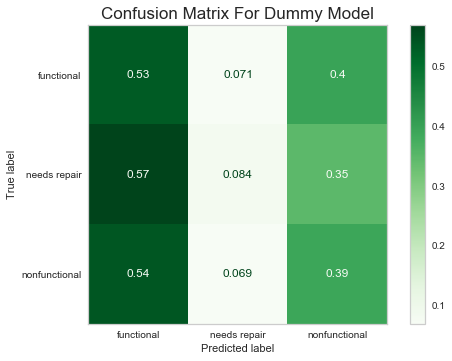

__________________________________________________________________


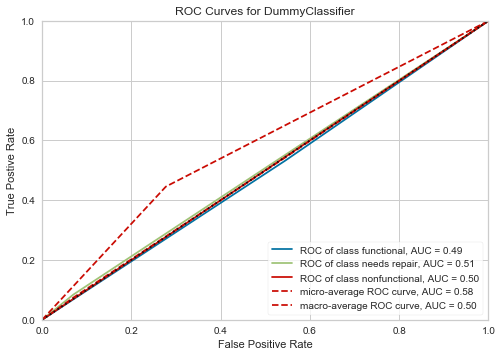

In [190]:
# Evaluating the model
evaluate_model(dummy_clf, X_train_tf, y_train, X_test_tf, y_test, 
               title='Dummy Model')

# LOGISTIC REGRESSION

In [ ]:
# normal, scaled
# logisticregressionCV
# look into not fitting an intercept vs dropping ohe column vs dropping binary
# don't worry multicolinearity
# ohe encoder is an either/or with ignoring vs dropping first

https://statisticsbyjim.com/regression/multicollinearity-in-regression-analysis/

Multicollinearity affects the coefficients and p-values, but it does not influence the predictions, precision of the predictions, and the goodness-of-fit statistics. If your primary goal is to make predictions, and you don’t need to understand the role of each independent variable, you don’t need to reduce severe multicollinearity.
Over the years, I’ve found that many people are incredulous over the third point, so here’s a reference!

The fact that some or all predictor variables are correlated among themselves does not, in general, inhibit our ability to obtain a good fit nor does it tend to affect inferences about mean responses or predictions of new observations.  —Applied Linear Statistical Models, p289, 4th Edition.

## Base Model

In [191]:
from sklearn.linear_model import LogisticRegressionCV

In [192]:
logreg_clf = LogisticRegressionCV(class_weight='balanced', 
                                  random_state=123, 
                                  scoring='recall_micro', 
                                  n_jobs=-1, cv=5,
                                  multi_class='multinomial')
logreg_base = logreg_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base Logistic Regression Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.66      0.72      8065
 needs repair       0.21      0.68      0.32      1079
nonfunctional       0.79      0.64      0.71      5706

     accuracy                           0.66     14850
    macro avg       0.60      0.66      0.58     14850
 weighted avg       0.75      0.66      0.69     14850

__________________________________________________________________


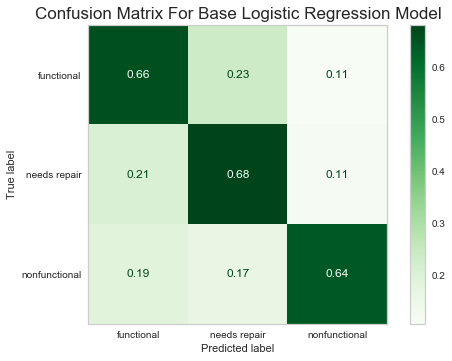

__________________________________________________________________


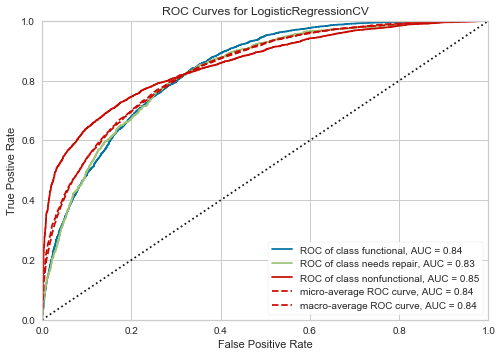

In [193]:
evaluate_model(logreg_base, X_train_tf, y_train, X_test_tf, y_test, 
               title='Base Logistic Regression Model')

In [194]:
coefs = logreg_base.coef_
pd.DataFrame(coefs).transpose()

,0,1,2
0,0.243,-0.160,-0.083
1,-0.202,0.380,-0.178
2,-0.058,0.082,-0.024
3,-0.317,0.353,-0.037
4,0.307,0.067,-0.375
5,0.717,-0.242,-0.474
6,-0.040,-0.326,0.367
7,-0.334,0.351,-0.017
8,0.061,-0.109,0.048
9,0.125,-0.075,-0.051


## Elastic Net

In [195]:
logreg_clf = LogisticRegressionCV(solver = 'saga', 
                                  penalty='elasticnet', 
                                  class_weight='balanced', 
                                  random_state=123,
                                  scoring='recall_micro', 
                                  n_jobs=-1, cv=5,
                                  l1_ratios=[.25, .5, .75],
                                  multi_class='multinomial')
logreg_elasticnet = logreg_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Elastic Net Logistic Regression Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.83      0.42      0.55      8065
 needs repair       0.14      0.80      0.24      1079
nonfunctional       0.74      0.59      0.66      5706

     accuracy                           0.51     14850
    macro avg       0.57      0.60      0.48     14850
 weighted avg       0.74      0.51      0.57     14850

__________________________________________________________________


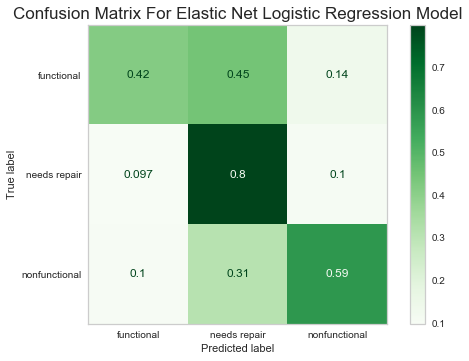

__________________________________________________________________


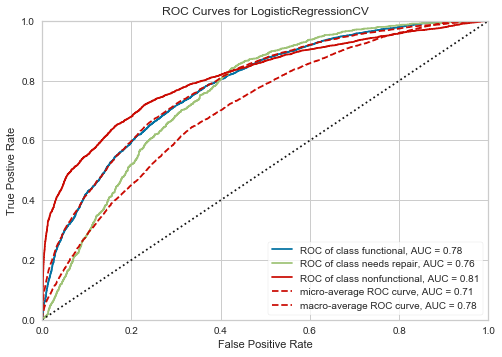

In [196]:
evaluate_model(logreg_elasticnet, X_train_tf, y_train, X_test_tf, y_test, 
               title='Elastic Net Logistic Regression Model')

## Grid Search

In [197]:
logreg_base.Cs_
Cs_list = list(logreg_base.Cs_)
Cs_list

[0.0001,
 0.000774263682681127,
 0.005994842503189409,
 0.046415888336127774,
 0.3593813663804626,
 2.782559402207126,
 21.54434690031882,
 166.81005372000558,
 1291.5496650148827,
 10000.0]

In [198]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

In [ ]:
logreg_params = {'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'], 
                 'C': Cs_list}

logreg_clf = LogisticRegression(class_weight='balanced', random_state=123, 
                                multi_class='multinomial')

grid = GridSearchCV(logreg_clf, logreg_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

logreg_grid = grid.fit(X_train_tf, y_train)

In [ ]:
logreg_grid.best_params_

```python
{'C': 0.3593813663804626, 'solver': 'saga'}
```

In [ ]:
C_drill_list = list(np.linspace(logreg_grid.best_params_['C']/5, logreg_grid.best_params_['C']*5, 10))

In [ ]:
logreg_params = {'C': C_drill_list}

logreg_clf = LogisticRegression(solver='saga', class_weight='balanced', 
                                random_state=123, multi_class='multinomial')

grid = GridSearchCV(logreg_clf, logreg_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

logreg_grid2 = grid.fit(X_train_tf, y_train)

In [ ]:
logreg_grid2.best_params_

```python
{'C': 0.4552163974152526}
```

In [ ]:
logreg_gridmodel = logreg_grid2.best_estimator_
logreg_gridmodel

```python
LogisticRegression(C=0.4552163974152526, class_weight='balanced',
                   multi_class='multinomial', random_state=123, solver='saga')
```

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched Logistic Regression Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.79      0.67      0.73      8065
 needs repair       0.21      0.54      0.30      1079
nonfunctional       0.73      0.66      0.70      5706

     accuracy                           0.66     14850
    macro avg       0.58      0.63      0.57     14850
 weighted avg       0.72      0.66      0.68     14850

__________________________________________________________________


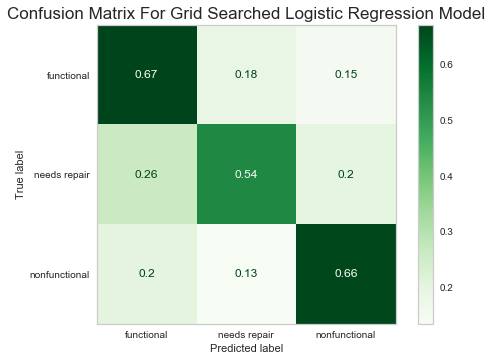

__________________________________________________________________


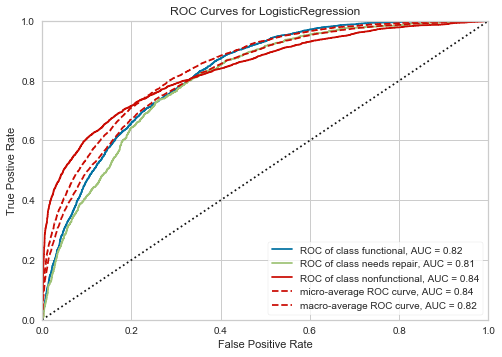

In [205]:
evaluate_model(logreg_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               title='Grid Searched Logistic Regression Model')

## SMOTE Model

In [ ]:
logreg_gridmodel

```python 
LogisticRegression(C=0.4552163974152526, class_weight='balanced',
                   multi_class='multinomial', random_state=123, solver='saga')
```

In [200]:
best_c = logreg_grid2.best_params_['C']
logreg_clf = LogisticRegressionCV(solver='saga', 
                                  random_state=123, n_jobs=-1, cv=5,
                                  scoring='recall_micro', 
                                  multi_class='multinomial', 
                                  Cs=[best_c])

logreg_smote = logreg_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	SMOTE Logistic Regression Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.67      0.73      8065
 needs repair       0.22      0.64      0.33      1079
nonfunctional       0.78      0.67      0.72      5706

     accuracy                           0.67     14850
    macro avg       0.60      0.66      0.59     14850
 weighted avg       0.75      0.67      0.70     14850

__________________________________________________________________


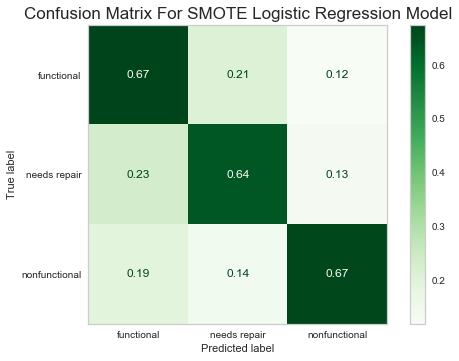

__________________________________________________________________


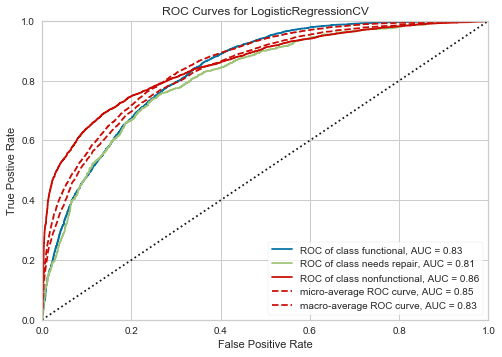

In [201]:
evaluate_model(logreg_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='SMOTE Logistic Regression Model')

# RANDOM FOREST

## Base Model

In [206]:
from sklearn.ensemble import RandomForestClassifier

forest_clf = RandomForestClassifier(n_jobs=-1, random_state=123, 
                                     class_weight='balanced')
forest_base = forest_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base Random Forest
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.81      0.87      0.84      8065
 needs repair       0.50      0.37      0.43      1079
nonfunctional       0.83      0.78      0.80      5706

     accuracy                           0.80     14850
    macro avg       0.71      0.67      0.69     14850
 weighted avg       0.79      0.80      0.80     14850

__________________________________________________________________


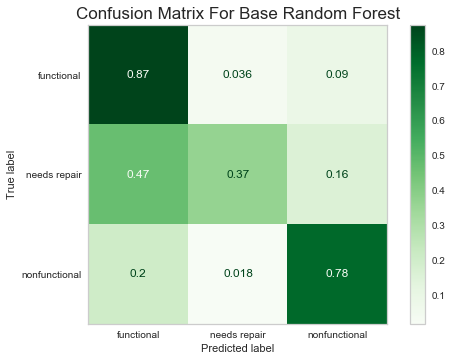

__________________________________________________________________


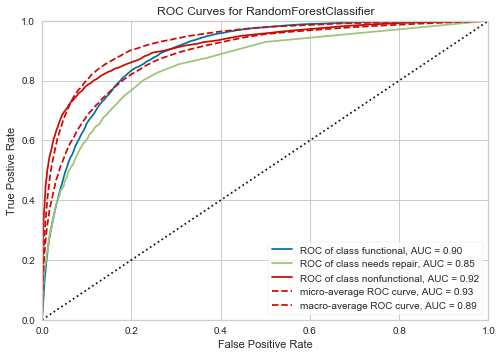

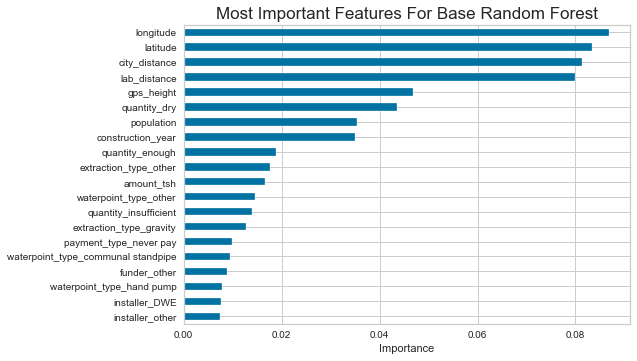

In [207]:
evaluate_model(forest_base, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Base Random Forest')

## Grid Search

In [ ]:
forest_params = {'criterion': ['gini', 'entropy'], 
                 'max_depth': [None, 5, 10, 20, 50], 
                 'min_samples_leaf': [1, 10, 20], 
                 'max_features': ['auto', None], 
                 'class_weight': ['balanced', 'balanced_subsample'], 
                 'max_samples': [None, .5, .7, .9]}
forest_clf = RandomForestClassifier(random_state=123)
grid = GridSearchCV(forest_clf, forest_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

forest_grid = grid.fit(X_train_tf, y_train)

In [ ]:
forest_grid.best_params_

```python
{'class_weight': 'balanced_subsample',
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_samples': 0.5,
 'min_samples_leaf': 1}
```

In [ ]:
forest_params = {'max_depth': [None, 75, 100], 
                 'max_samples': [.3, .4, .5, .6], 
                 'min_samples_leaf': [1, 3, 6]}

forest_clf = RandomForestClassifier(random_state=123, criterion='gini', 
                                    class_weight='balanced_subsample', 
                                    max_features='auto')

grid = GridSearchCV(forest_clf, forest_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

forest_grid2 = grid.fit(X_train_tf, y_train)

In [ ]:
forest_grid2.best_params_

```python
{'max_depth': None, 'max_samples': 0.5, 'min_samples_leaf': 1}
```

In [ ]:
forest_gridmodel = forest_grid2.best_estimator_
forest_gridmodel

```python
RandomForestClassifier(class_weight='balanced_subsample', max_samples=0.5,
                       random_state=123)
```

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched Random Forest Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.90      0.85      8065
 needs repair       0.58      0.33      0.42      1079
nonfunctional       0.84      0.77      0.80      5706

     accuracy                           0.81     14850
    macro avg       0.74      0.67      0.69     14850
 weighted avg       0.80      0.81      0.80     14850

__________________________________________________________________


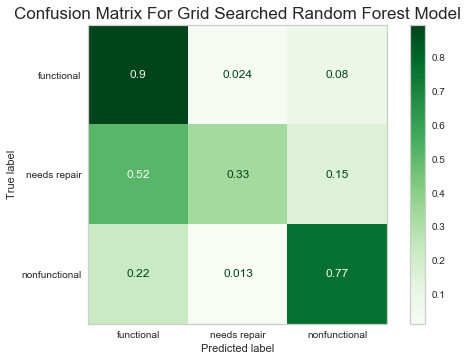

__________________________________________________________________


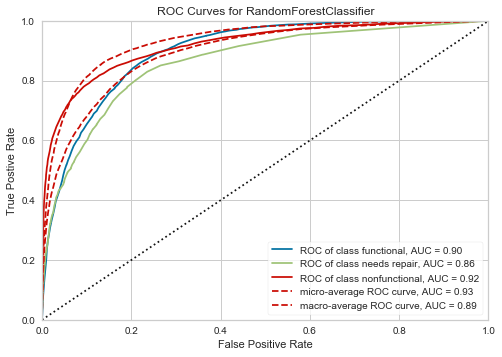

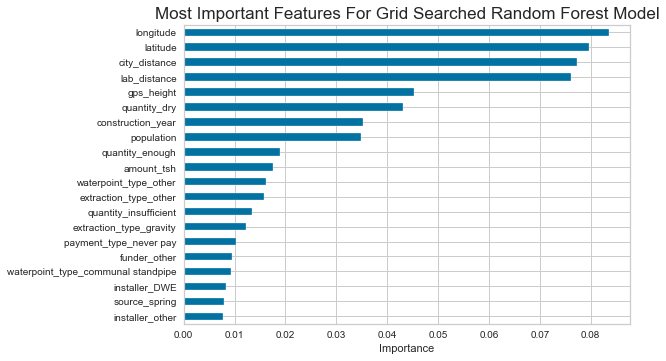

In [218]:
evaluate_model(forest_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Grid Searched Random Forest Model')

## SMOTE Model

In [219]:
forest_gridmodel

RandomForestClassifier(class_weight='balanced_subsample', max_samples=0.5,
                       random_state=123)

In [208]:
forest_clf = RandomForestClassifier(class_weight='balanced_subsample', 
                                    max_samples=0.5, random_state=123, 
                                    n_jobs=-1)

forest_smote = forest_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	SMOTE Random Forest Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.83      0.82      0.82      8065
 needs repair       0.38      0.49      0.43      1079
nonfunctional       0.82      0.79      0.80      5706

     accuracy                           0.78     14850
    macro avg       0.68      0.70      0.69     14850
 weighted avg       0.79      0.78      0.79     14850

__________________________________________________________________


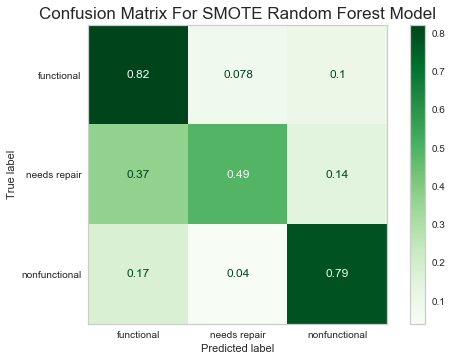

__________________________________________________________________


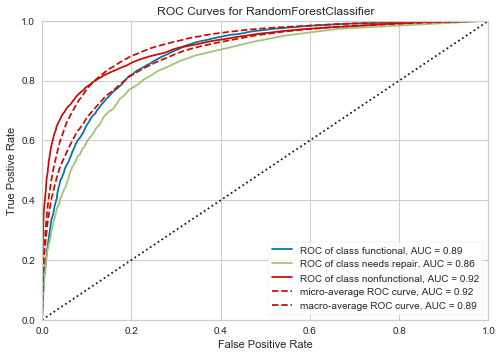

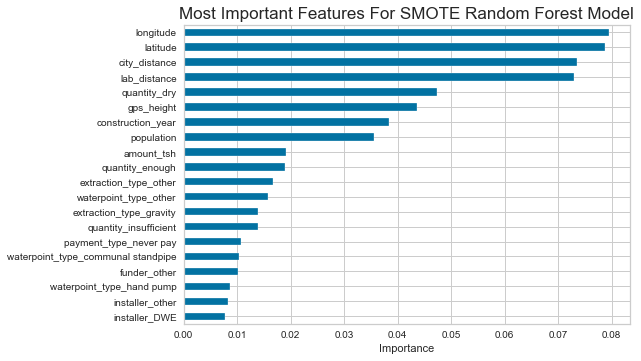

In [209]:
evaluate_model(forest_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='SMOTE Random Forest Model')

# EXTRA TREES

## Base Model

In [222]:
from sklearn.ensemble import ExtraTreesClassifier

In [220]:
extratrees_clf = ExtraTreesClassifier(n_jobs=-1, random_state=123, 
                                      class_weight='balanced')

extratrees_base = extratrees_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base Extra Trees Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.81      0.85      0.83      8065
 needs repair       0.45      0.39      0.42      1079
nonfunctional       0.81      0.78      0.79      5706

     accuracy                           0.79     14850
    macro avg       0.69      0.67      0.68     14850
 weighted avg       0.78      0.79      0.79     14850

__________________________________________________________________


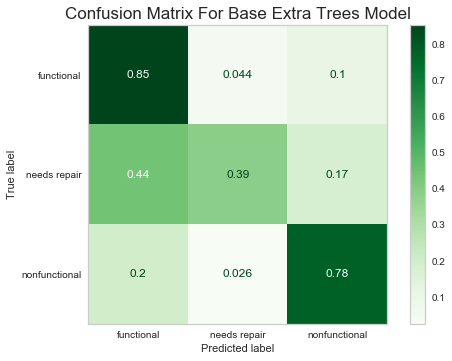

__________________________________________________________________


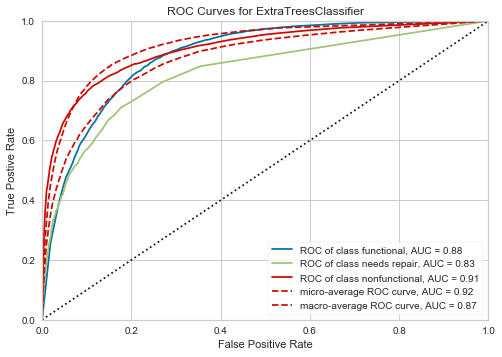

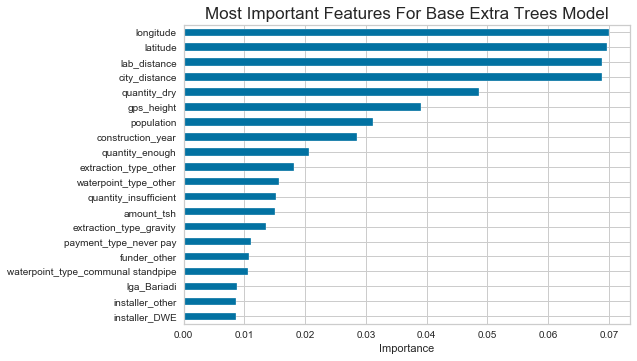

In [221]:
evaluate_model(extratrees_base, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Base Extra Trees Model')

## Grid Search

In [ ]:
trees_params = {'criterion': ['gini', 'entropy'], 
                'max_depth': [None, 10, 50], 
                'min_samples_leaf': [1, 5], 
                'max_features': ['auto', None], 
                'bootstrap': [True, False], 
                'class_weight': ['balanced', 'balanced_subsample'], 
                'max_samples': [.5, .7, .9]}

extratrees_clf = ExtraTreesClassifier(random_state=123)
grid = GridSearchCV(extratrees_clf, trees_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)
extratrees_grid = grid.fit(X_train_tf, y_train)

In [ ]:
extratrees_grid.best_params_

```python
{'bootstrap': True,
 'class_weight': 'balanced_subsample',
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_samples': 0.5,
 'min_samples_leaf': 1}
```

In [ ]:
trees_params ={'max_depth': [None, 75, 100], 
               'max_samples': [None, .3, .4, .5, .6], 
               'min_samples_leaf': [1, 2, 3]}

extratrees_clf = ExtraTreesClassifier(random_state=123, criterion='gini', 
                                      bootstrap=True, 
                                      class_weight='balanced_subsample', 
                                      max_features='auto')

grid = GridSearchCV(extratrees_clf, trees_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)
extratrees_grid2 = grid.fit(X_train_tf, y_train)

In [ ]:
extratrees_grid2.best_params_

```python
{'max_depth': None, 'max_samples': 0.5, 'min_samples_leaf': 1}
```

In [ ]:
extratrees_gridmodel = extratrees_grid2.best_estimator_
extratrees_gridmodel

```python
ExtraTreesClassifier(bootstrap=True, class_weight='balanced_subsample',
                     max_samples=0.5, random_state=123)
```

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched Extra Trees Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.89      0.84      8065
 needs repair       0.55      0.35      0.43      1079
nonfunctional       0.84      0.77      0.80      5706

     accuracy                           0.80     14850
    macro avg       0.73      0.67      0.69     14850
 weighted avg       0.80      0.80      0.80     14850

__________________________________________________________________


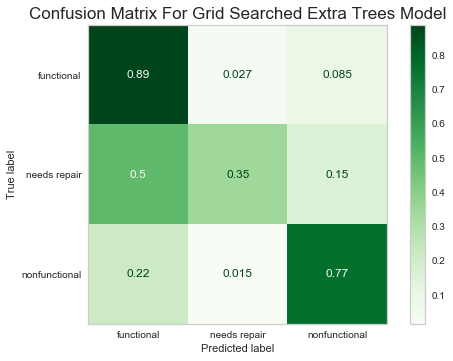

__________________________________________________________________


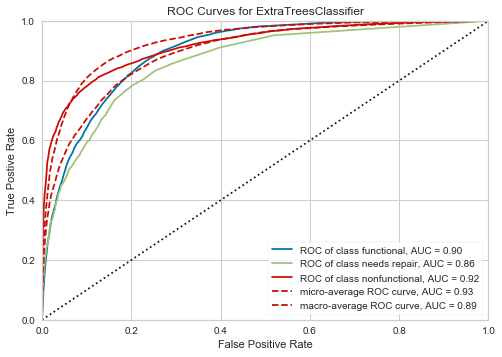

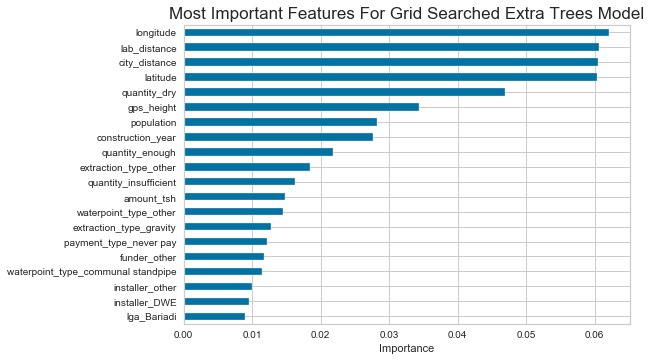

In [225]:
evaluate_model(extratrees_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Grid Searched Extra Trees Model')

## SMOTE Model

In [226]:
extratrees_gridmodel

ExtraTreesClassifier(bootstrap=True, class_weight='balanced_subsample',
                     max_samples=0.5, random_state=123)

In [227]:
extratrees_clf = ExtraTreesClassifier(bootstrap=True, 
                        class_weight='balanced_subsample', n_jobs=-1,
                        max_samples=0.5, random_state=123)

extratrees_smote = extratrees_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	SMOTE Extra Trees Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.83      0.81      0.82      8065
 needs repair       0.37      0.49      0.42      1079
nonfunctional       0.82      0.78      0.80      5706

     accuracy                           0.78     14850
    macro avg       0.67      0.70      0.68     14850
 weighted avg       0.79      0.78      0.78     14850

__________________________________________________________________


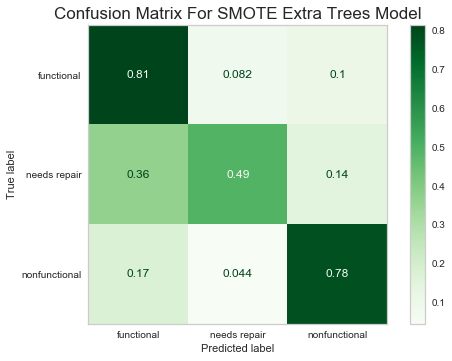

__________________________________________________________________


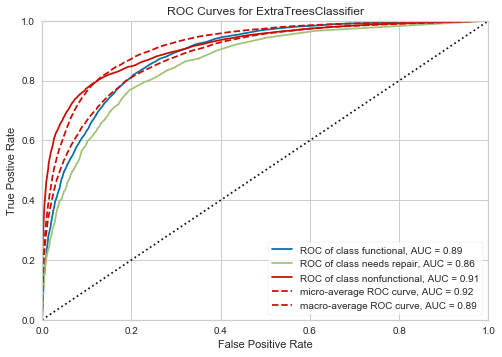

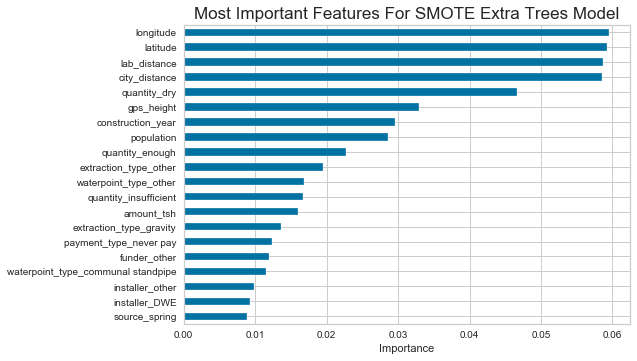

In [228]:
evaluate_model(extratrees_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='SMOTE Extra Trees Model')

# ADABOOSTING

## Base Model

In [229]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

In [230]:
ada_clf = AdaBoostClassifier(n_estimators=100, random_state=123, 
                             base_estimator=DecisionTreeClassifier(max_depth=3, 
                                                    class_weight='balanced'))

ada_base = ada_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base AdaBoost Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.81      0.66      0.72      8065
 needs repair       0.23      0.66      0.34      1079
nonfunctional       0.77      0.70      0.73      5706

     accuracy                           0.67     14850
    macro avg       0.60      0.67      0.60     14850
 weighted avg       0.75      0.67      0.70     14850

__________________________________________________________________


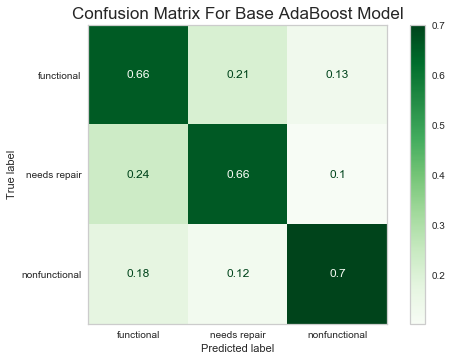

__________________________________________________________________


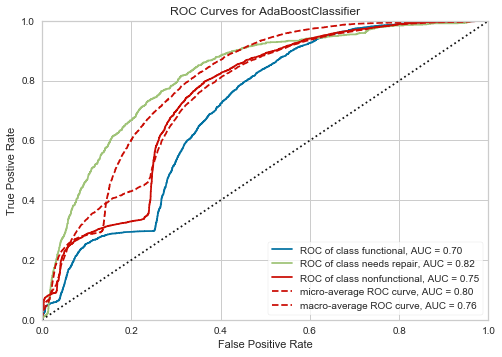

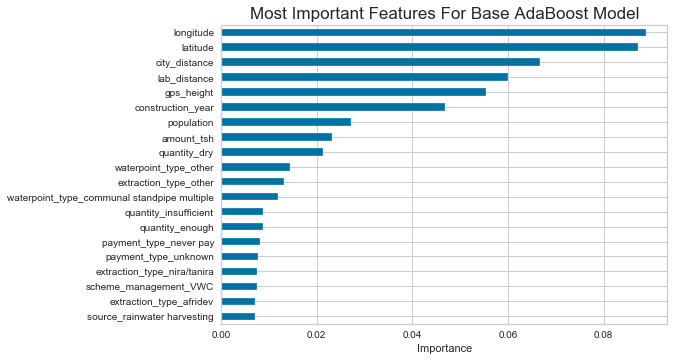

In [231]:
evaluate_model(ada_base, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Base AdaBoost Model')

## Grid Search

In [ ]:
ada_params = {'n_estimators': [100, 200, 300], 
              'learning_rate': [.5, .1], 
              'base_estimator__max_depth': [None, 3, 7], 
              'base_estimator__max_features': [None, 'auto'], 
              'base_estimator__min_samples_split': [2, 10, 20]}

ada_clf = AdaBoostClassifier(random_state=123, 
                             base_estimator=DecisionTreeClassifier(
                                 class_weight='balanced'))

grid = GridSearchCV(ada_clf, ada_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

ada_grid = grid.fit(X_train_tf, y_train)

In [ ]:
ada_grid.best_params_

```python
{'base_estimator__max_depth': None,
 'base_estimator__max_features': None,
 'base_estimator__min_samples_split': 20,
 'learning_rate': 0.1,
 'n_estimators': 200}
```

In [ ]:
ada_params = {'n_estimators': [150, 200, 250], 
              'learning_rate': [.1, .05],   
              'base_estimator__min_samples_split': [20, 40, 60]}

ada_clf = AdaBoostClassifier(random_state=123, 
                             base_estimator=DecisionTreeClassifier(max_depth=None, max_features=None, 
                                                                   class_weight='balanced'))

grid = GridSearchCV(ada_clf, ada_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

ada_grid2 = grid.fit(X_train_tf, y_train)

In [ ]:
ada_grid2.best_params_

```python
{'base_estimator__min_samples_split': 40,
 'learning_rate': 0.05,
 'n_estimators': 250}
```

In [ ]:
ada_gridmodel = ada_grid2.best_estimator_
ada_gridmodel

```python
AdaBoostClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                         min_samples_split=40),
                   learning_rate=0.05, n_estimators=250, random_state=123)
```

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched AdaBoost Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.88      0.84      8065
 needs repair       0.52      0.31      0.39      1079
nonfunctional       0.83      0.77      0.80      5706

     accuracy                           0.80     14850
    macro avg       0.72      0.65      0.68     14850
 weighted avg       0.79      0.80      0.79     14850

__________________________________________________________________


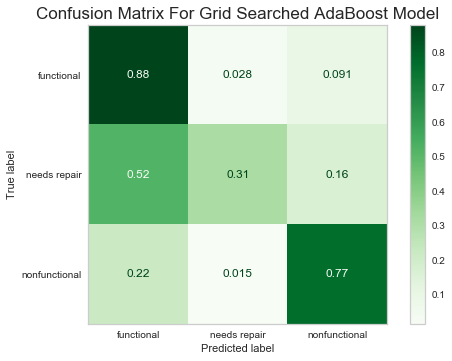

__________________________________________________________________


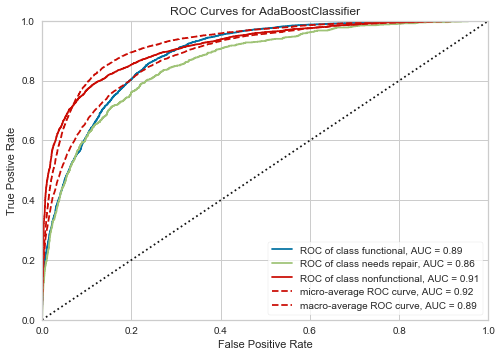

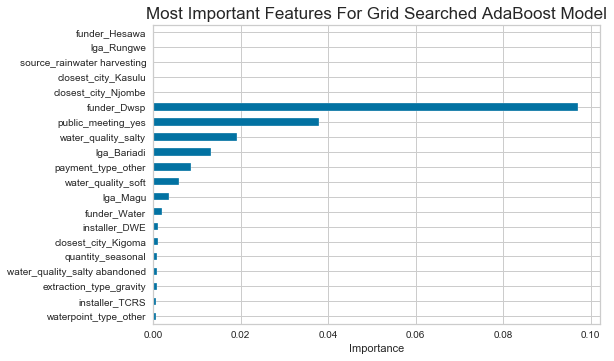

In [234]:
evaluate_model(ada_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Grid Searched AdaBoost Model')

## SMOTE Model

In [235]:
ada_gridmodel

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                         min_samples_split=40),
                   learning_rate=0.05, n_estimators=250, random_state=123)

In [236]:
ada_clf = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(min_samples_split=40),
                   learning_rate=0.05, n_estimators=250, random_state=123)

ada_smote = ada_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	SMOTE AdaBoost Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.82      0.83      0.82      8065
 needs repair       0.41      0.45      0.43      1079
nonfunctional       0.81      0.78      0.80      5706

     accuracy                           0.78     14850
    macro avg       0.68      0.69      0.68     14850
 weighted avg       0.79      0.78      0.78     14850

__________________________________________________________________


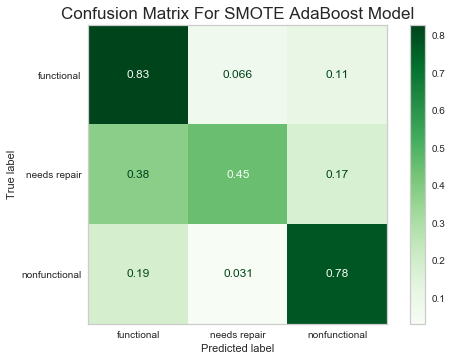

__________________________________________________________________


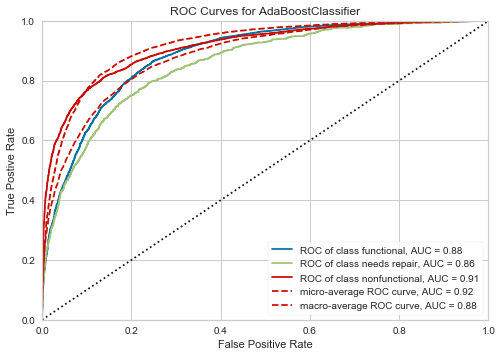

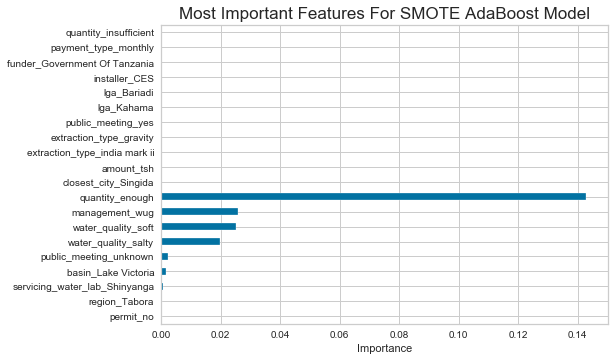

In [237]:
evaluate_model(ada_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='SMOTE AdaBoost Model')

# XGBOOST

## Base Model

In [238]:
# Calculate class weight
from sklearn.utils import class_weight
k_train = class_weight.compute_class_weight('balanced', np.unique(y_train), y_train)
wt = dict(zip(np.unique(y_train), k_train))

# Map class weights to corresponding target class values, make sure class labels have range (0, n_classes-1)
w_array = y_train.map(wt)
set(zip(y_train,w_array))

# Convert wt series to wt array
w_array = w_array.values

In [239]:
from xgboost import XGBClassifier
eval_set = [(X_train_tf, y_train), (X_test_tf, y_test)]
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123)
xgb_base = xgb_clf.fit(X_train_tf, y_train, sample_weight=w_array, 
                       early_stopping_rounds=10, eval_metric='mlogloss', 
                       eval_set=eval_set)

[0]	validation_0-mlogloss:1.07254	validation_1-mlogloss:1.07329
Multiple eval metrics have been passed: 'validation_1-mlogloss' will be used for early stopping.

Will train until validation_1-mlogloss hasn't improved in 10 rounds.
[1]	validation_0-mlogloss:1.05002	validation_1-mlogloss:1.05162
[2]	validation_0-mlogloss:1.03037	validation_1-mlogloss:1.0327
[3]	validation_0-mlogloss:1.01354	validation_1-mlogloss:1.01665
[4]	validation_0-mlogloss:0.998297	validation_1-mlogloss:1.00199
[5]	validation_0-mlogloss:0.984675	validation_1-mlogloss:0.988915
[6]	validation_0-mlogloss:0.972582	validation_1-mlogloss:0.977143
[7]	validation_0-mlogloss:0.961492	validation_1-mlogloss:0.966346
[8]	validation_0-mlogloss:0.950255	validation_1-mlogloss:0.955559
[9]	validation_0-mlogloss:0.940094	validation_1-mlogloss:0.945976
[10]	validation_0-mlogloss:0.931379	validation_1-mlogloss:0.937632
[11]	validation_0-mlogloss:0.923791	validation_1-mlogloss:0.930432
[12]	validation_0-mlogloss:0.917025	validation_1-

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base XGBoost Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.78      0.69      0.74      8065
 needs repair       0.21      0.69      0.32      1079
nonfunctional       0.83      0.61      0.70      5706

     accuracy                           0.66     14850
    macro avg       0.61      0.66      0.59     14850
 weighted avg       0.76      0.66      0.69     14850

__________________________________________________________________


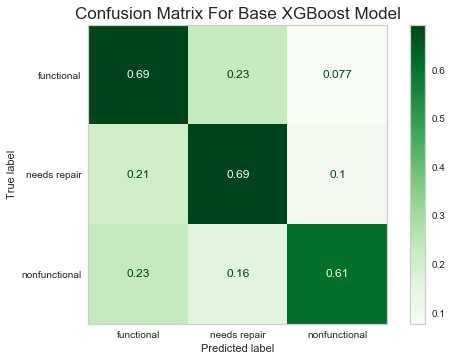

__________________________________________________________________


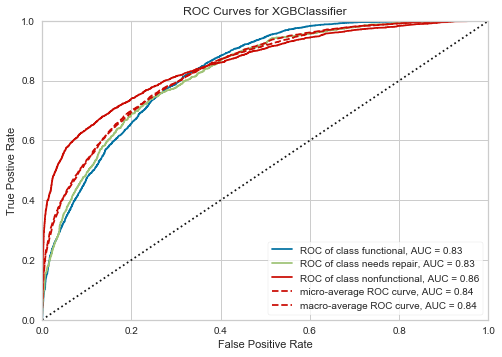

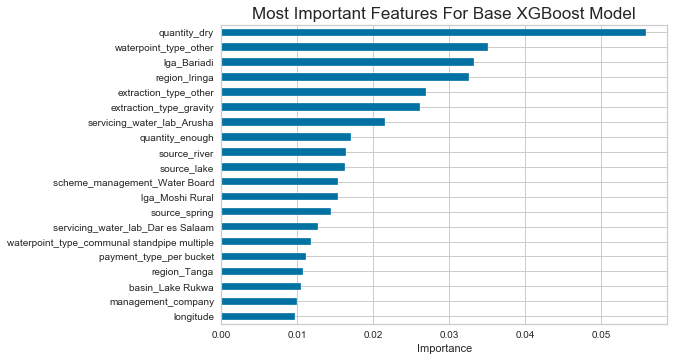

In [240]:
evaluate_model(xgb_base, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Base XGBoost Model')

## Grid Search

In [ ]:
xgb_params = {'max_depth': [None, 3, 10], 
              'learning_rate': [.1, .05], 
              'min_child_weight': [1, 5, 10], 
              'subsample': [.3, .5, .7]}
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123)
grid = GridSearchCV(xgb_clf, xgb_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

xgb_grid = grid.fit(X_train_tf, y_train)

In [ ]:
xgb_grid.best_params_

```python
{'learning_rate': 0.1,
 'max_depth': 10,
 'min_child_weight': 1,
 'subsample': 0.7}
```

In [ ]:
xgb_params = {'max_depth': [8, 10, 12], 
              'learning_rate': [.1, .08], 
              'min_child_weight': [1, 3], 
              'subsample': [.6, .7, .8]}
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123)
grid = GridSearchCV(xgb_clf, xgb_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)

xgb_grid2 = grid.fit(X_train_tf, y_train)

In [ ]:
xgb_grid2.best_params_

```python
{'learning_rate': 0.1,
 'max_depth': 12,
 'min_child_weight': 1,
 'subsample': 0.7}
```

In [ ]:
xgb_gridmodel = xgb_grid2.best_estimator_
xgb_gridmodel

```python
XGBClassifier(max_depth=12, n_jobs=-1, objective='multi:softprob',
              random_state=123, subsample=0.7)
```

In [242]:
eval_set = [(X_train_tf, y_train), (X_test_tf, y_test)]
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123, max_depth=12, 
                        subsample=.7, n_estimators=400)
xgb_gridmodel = xgb_clf.fit(X_train_tf, y_train, sample_weight=w_array, 
                       early_stopping_rounds=10, eval_metric='mlogloss', 
                       eval_set=eval_set)

[0]	validation_0-mlogloss:1.03896	validation_1-mlogloss:1.04429
Multiple eval metrics have been passed: 'validation_1-mlogloss' will be used for early stopping.

Will train until validation_1-mlogloss hasn't improved in 10 rounds.
[1]	validation_0-mlogloss:0.988323	validation_1-mlogloss:0.998765
[2]	validation_0-mlogloss:0.943288	validation_1-mlogloss:0.958224
[3]	validation_0-mlogloss:0.903421	validation_1-mlogloss:0.922961
[4]	validation_0-mlogloss:0.867519	validation_1-mlogloss:0.891414
[5]	validation_0-mlogloss:0.836116	validation_1-mlogloss:0.863853
[6]	validation_0-mlogloss:0.806539	validation_1-mlogloss:0.838486
[7]	validation_0-mlogloss:0.78127	validation_1-mlogloss:0.817123
[8]	validation_0-mlogloss:0.758253	validation_1-mlogloss:0.797782
[9]	validation_0-mlogloss:0.737514	validation_1-mlogloss:0.780387
[10]	validation_0-mlogloss:0.718478	validation_1-mlogloss:0.76474
[11]	validation_0-mlogloss:0.701904	validation_1-mlogloss:0.751457
[12]	validation_0-mlogloss:0.684755	validat

[121]	validation_0-mlogloss:0.345856	validation_1-mlogloss:0.548269
[122]	validation_0-mlogloss:0.344653	validation_1-mlogloss:0.548061
[123]	validation_0-mlogloss:0.343191	validation_1-mlogloss:0.54767
[124]	validation_0-mlogloss:0.34168	validation_1-mlogloss:0.547044
[125]	validation_0-mlogloss:0.339888	validation_1-mlogloss:0.546365
[126]	validation_0-mlogloss:0.337919	validation_1-mlogloss:0.545866
[127]	validation_0-mlogloss:0.336579	validation_1-mlogloss:0.54536
[128]	validation_0-mlogloss:0.335788	validation_1-mlogloss:0.545331
[129]	validation_0-mlogloss:0.334312	validation_1-mlogloss:0.545028
[130]	validation_0-mlogloss:0.332877	validation_1-mlogloss:0.544582
[131]	validation_0-mlogloss:0.331848	validation_1-mlogloss:0.544425
[132]	validation_0-mlogloss:0.330432	validation_1-mlogloss:0.543857
[133]	validation_0-mlogloss:0.328627	validation_1-mlogloss:0.543249
[134]	validation_0-mlogloss:0.327339	validation_1-mlogloss:0.542756
[135]	validation_0-mlogloss:0.325521	validation_1-m

[242]	validation_0-mlogloss:0.226383	validation_1-mlogloss:0.523056
[243]	validation_0-mlogloss:0.225656	validation_1-mlogloss:0.522969
[244]	validation_0-mlogloss:0.225014	validation_1-mlogloss:0.52291
[245]	validation_0-mlogloss:0.224155	validation_1-mlogloss:0.522863
[246]	validation_0-mlogloss:0.223071	validation_1-mlogloss:0.522831
[247]	validation_0-mlogloss:0.222542	validation_1-mlogloss:0.522761
[248]	validation_0-mlogloss:0.221611	validation_1-mlogloss:0.522765
[249]	validation_0-mlogloss:0.220994	validation_1-mlogloss:0.522669
[250]	validation_0-mlogloss:0.220237	validation_1-mlogloss:0.522565
[251]	validation_0-mlogloss:0.219659	validation_1-mlogloss:0.522645
[252]	validation_0-mlogloss:0.218988	validation_1-mlogloss:0.522586
[253]	validation_0-mlogloss:0.218164	validation_1-mlogloss:0.522499
[254]	validation_0-mlogloss:0.217171	validation_1-mlogloss:0.522478
[255]	validation_0-mlogloss:0.216278	validation_1-mlogloss:0.522531
[256]	validation_0-mlogloss:0.215759	validation_1

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched XGBoost Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.83      0.82      0.82      8065
 needs repair       0.40      0.54      0.46      1079
nonfunctional       0.83      0.79      0.81      5706

     accuracy                           0.79     14850
    macro avg       0.69      0.71      0.70     14850
 weighted avg       0.80      0.79      0.79     14850

__________________________________________________________________


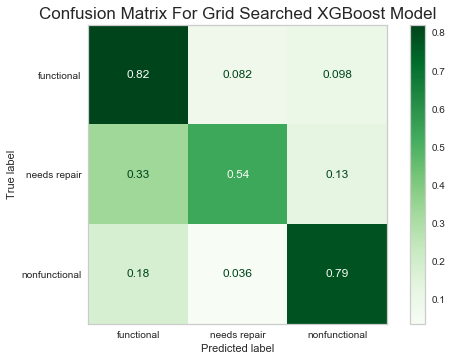

__________________________________________________________________


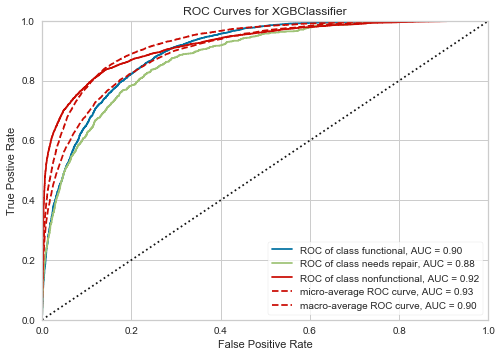

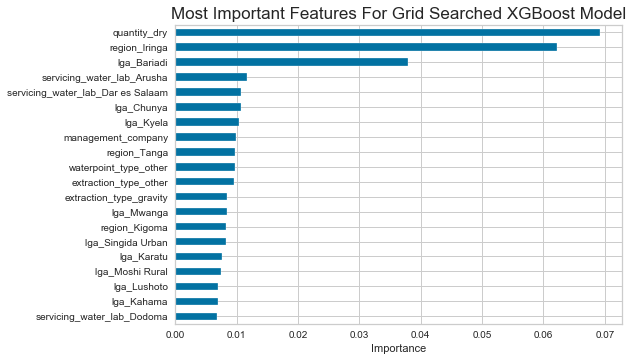

In [243]:
evaluate_model(xgb_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Grid Searched XGBoost Model')

## SMOTE Model

In [244]:
eval_set = [(X_train_smote, y_train_smote), (X_test_tf, y_test)]
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123, max_depth=12, 
                        subsample=.7, n_estimators=400)
xgb_smote = xgb_clf.fit(X_train_smote, y_train_smote, 
                       early_stopping_rounds=10, eval_metric='mlogloss', 
                       eval_set=eval_set)

[0]	validation_0-mlogloss:1.0319	validation_1-mlogloss:1.04221
Multiple eval metrics have been passed: 'validation_1-mlogloss' will be used for early stopping.

Will train until validation_1-mlogloss hasn't improved in 10 rounds.
[1]	validation_0-mlogloss:0.975853	validation_1-mlogloss:0.994989
[2]	validation_0-mlogloss:0.926866	validation_1-mlogloss:0.954245
[3]	validation_0-mlogloss:0.884608	validation_1-mlogloss:0.919025
[4]	validation_0-mlogloss:0.846635	validation_1-mlogloss:0.888312
[5]	validation_0-mlogloss:0.812189	validation_1-mlogloss:0.861017
[6]	validation_0-mlogloss:0.782025	validation_1-mlogloss:0.837269
[7]	validation_0-mlogloss:0.755619	validation_1-mlogloss:0.816703
[8]	validation_0-mlogloss:0.730841	validation_1-mlogloss:0.79782
[9]	validation_0-mlogloss:0.708782	validation_1-mlogloss:0.781242
[10]	validation_0-mlogloss:0.6871	validation_1-mlogloss:0.764963
[11]	validation_0-mlogloss:0.667746	validation_1-mlogloss:0.750935
[12]	validation_0-mlogloss:0.64997	validation

[121]	validation_0-mlogloss:0.295565	validation_1-mlogloss:0.546383
[122]	validation_0-mlogloss:0.294231	validation_1-mlogloss:0.54603
[123]	validation_0-mlogloss:0.293087	validation_1-mlogloss:0.545692
[124]	validation_0-mlogloss:0.291575	validation_1-mlogloss:0.545372
[125]	validation_0-mlogloss:0.290281	validation_1-mlogloss:0.545108
[126]	validation_0-mlogloss:0.28902	validation_1-mlogloss:0.544659
[127]	validation_0-mlogloss:0.28789	validation_1-mlogloss:0.544349
[128]	validation_0-mlogloss:0.285964	validation_1-mlogloss:0.543848
[129]	validation_0-mlogloss:0.284392	validation_1-mlogloss:0.543413
[130]	validation_0-mlogloss:0.283284	validation_1-mlogloss:0.543151
[131]	validation_0-mlogloss:0.281756	validation_1-mlogloss:0.54275
[132]	validation_0-mlogloss:0.280979	validation_1-mlogloss:0.542668
[133]	validation_0-mlogloss:0.279959	validation_1-mlogloss:0.542445
[134]	validation_0-mlogloss:0.279035	validation_1-mlogloss:0.542167
[135]	validation_0-mlogloss:0.277916	validation_1-ml

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	SMOTE XGBoost Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.83      0.82      0.82      8065
 needs repair       0.37      0.50      0.42      1079
nonfunctional       0.83      0.78      0.81      5706

     accuracy                           0.78     14850
    macro avg       0.68      0.70      0.69     14850
 weighted avg       0.80      0.78      0.79     14850

__________________________________________________________________


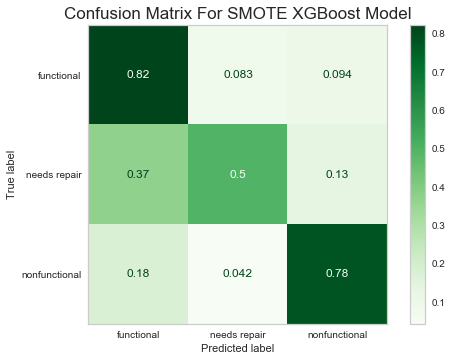

__________________________________________________________________


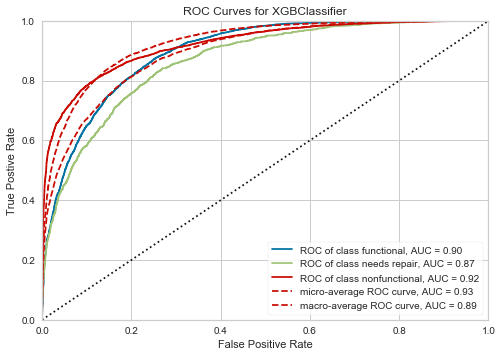

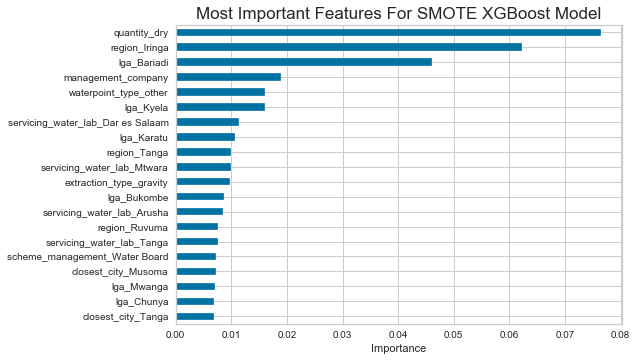

In [245]:
evaluate_model(xgb_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='SMOTE XGBoost Model')

# LINEAR SVM

## Base Model

In [246]:
from sklearn.svm import LinearSVC

In [247]:
svm_clf = LinearSVC(random_state=123, dual=False, 
                    class_weight='balanced')
svm_base = svm_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Linear SVM Base Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.77      0.79      0.78      8065
 needs repair       0.28      0.47      0.35      1079
nonfunctional       0.79      0.66      0.72      5706

     accuracy                           0.72     14850
    macro avg       0.61      0.64      0.62     14850
 weighted avg       0.75      0.72      0.73     14850

__________________________________________________________________


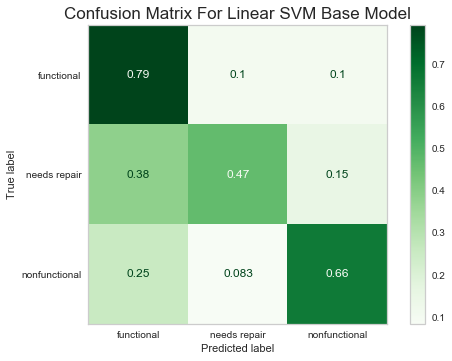

__________________________________________________________________


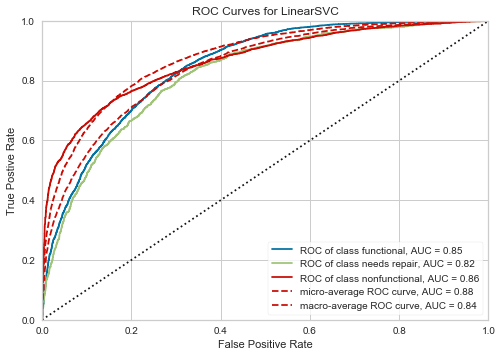

In [248]:
evaluate_model(svm_base, X_train_tf, y_train, X_test_tf, y_test, 
               title='Linear SVM Base Model')

## Grid Search

In [249]:
svm_params = {'C': [1, 10, 50, 100], 
              'fit_intercept': [True, False]}

svm_clf = LinearSVC(random_state=123, dual=False, class_weight='balanced')
grid = GridSearchCV(svm_clf, svm_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)
svm_grid = grid.fit(X_train_tf, y_train)

In [250]:
svm_grid.best_params_

{'C': 1, 'fit_intercept': True}

```python
{'C': 1, 'fit_intercept': True}
```

In [254]:
svm_params = {'C': [1, 2, 3]}

svm_clf = LinearSVC(random_state=123, fit_intercept=True, dual=False, 
                    class_weight='balanced')
grid = GridSearchCV(svm_clf, svm_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)
svm_grid2 = grid.fit(X_train_tf, y_train)

In [255]:
svm_grid2.best_params_

{'C': 1}

```python
{'C': 2}
```

In [256]:
svm_gridmodel = svm_grid2.best_estimator_
svm_gridmodel

LinearSVC(C=1, class_weight='balanced', dual=False, random_state=123)

```python
LinearSVC(C=2, class_weight='balanced', dual=False, random_state=123)
```

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched Linear SVM Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.77      0.79      0.78      8065
 needs repair       0.28      0.47      0.35      1079
nonfunctional       0.79      0.66      0.72      5706

     accuracy                           0.72     14850
    macro avg       0.61      0.64      0.62     14850
 weighted avg       0.75      0.72      0.73     14850

__________________________________________________________________


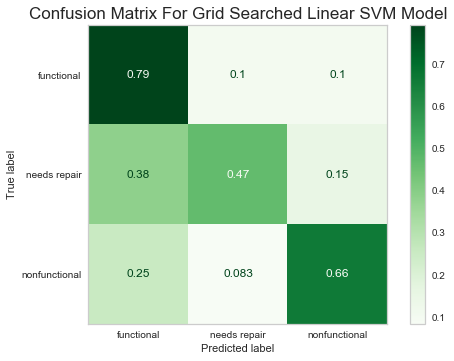

__________________________________________________________________


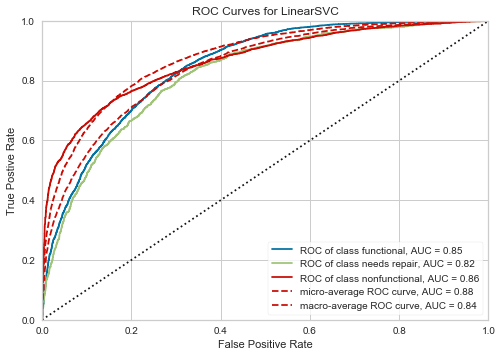

In [257]:
evaluate_model(svm_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               title='Grid Searched Linear SVM Model')

## SMOTE Model

In [258]:
svm_gridmodel

LinearSVC(C=1, class_weight='balanced', dual=False, random_state=123)

In [259]:
svm_clf = LinearSVC(random_state=123, dual=False, C=2)
svm_smote = svm_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	SMOTE Linear SVM Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.68      0.73      8065
 needs repair       0.21      0.63      0.32      1079
nonfunctional       0.78      0.65      0.71      5706

     accuracy                           0.67     14850
    macro avg       0.60      0.65      0.59     14850
 weighted avg       0.75      0.67      0.69     14850

__________________________________________________________________


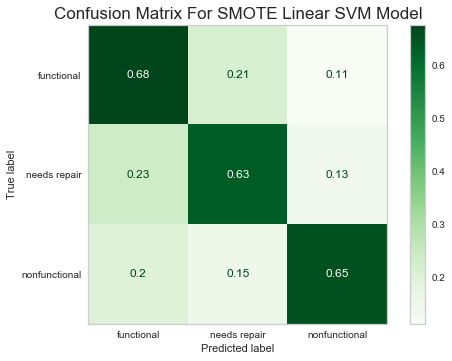

__________________________________________________________________


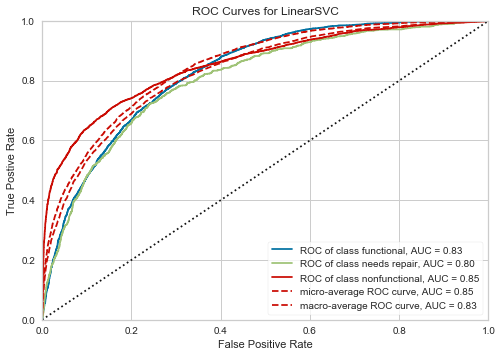

In [260]:
evaluate_model(svm_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='SMOTE Linear SVM Model')

# POLYNOMIAL SVM

## Base Model

In [261]:
from sklearn.svm import SVC

In [262]:
svm_clf = SVC(random_state=123, class_weight='balanced', kernel='poly')
svc_poly_base = svm_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base Polynomial SVM Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.82      0.72      0.77      8065
 needs repair       0.26      0.71      0.38      1079
nonfunctional       0.82      0.70      0.76      5706

     accuracy                           0.71     14850
    macro avg       0.64      0.71      0.63     14850
 weighted avg       0.78      0.71      0.74     14850

__________________________________________________________________


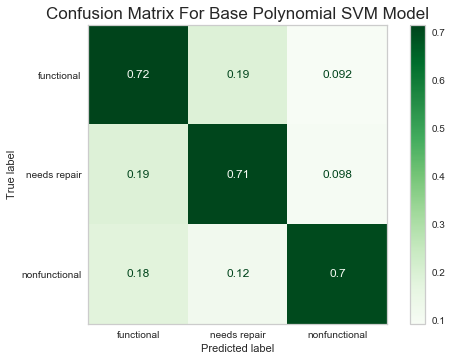

__________________________________________________________________


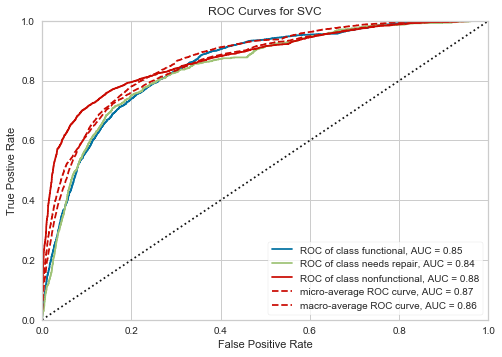

In [263]:
evaluate_model(svc_poly_base, X_train_tf, y_train, X_test_tf, y_test, 
               title='Base Polynomial SVM Model')

##  Grid Search

In [ ]:
svc_params = {'C': [1, 5, 10], 
              'degree': [3, 10], 
              'coef0': [0, 1], 
              'decision_function_shape': ['ovo', 'ovr']}

svm_clf = SVC(random_state=123, class_weight='balanced')
grid = GridSearchCV(svm_clf, svc_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)
svc_grid = grid.fit(X_train_tf, y_train)

In [ ]:
svc_grid.best_params_

```python
{'C': 10, 'coef0': 0, 'decision_function_shape': 'ovo', 'degree': 3}
```

In [ ]:
svc_params = {'C': [10, 20, 30], 
              'degree': [2, 3, 4, 5]}

svm_clf = SVC(random_state=123, coef0=0, decision_function_shape='ovo', 
              class_weight='balanced')

grid = GridSearchCV(svm_clf, svc_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)
svc_grid2 = grid.fit(X_train_tf, y_train)

In [ ]:
svc_grid2.best_params_

```python 
{'C': 20, 'degree': 2}
```

In [ ]:
svc_poly_gridmodel = svc_grid2.best_estimator_
svc_poly_gridmodel

```python
SVC(C=20, class_weight='balanced', coef0=0, decision_function_shape='ovo',
    degree=2, random_state=123)
```

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched Polynomial SVM Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.82      0.73      0.78      8065
 needs repair       0.28      0.66      0.39      1079
nonfunctional       0.82      0.74      0.78      5706

     accuracy                           0.73     14850
    macro avg       0.64      0.71      0.65     14850
 weighted avg       0.78      0.73      0.75     14850

__________________________________________________________________


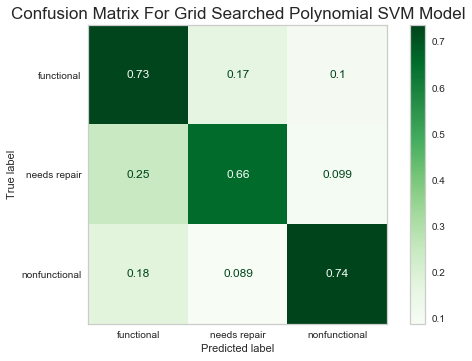

__________________________________________________________________


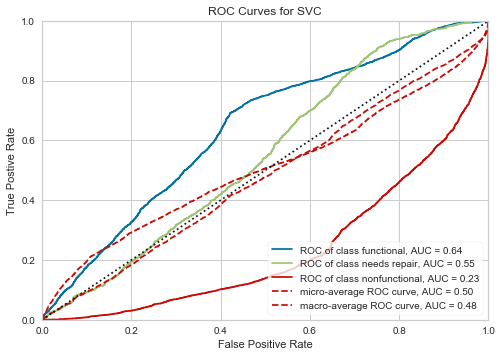

In [265]:
evaluate_model(svc_poly_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               title='Grid Searched Polynomial SVM Model')

## SMOTE Model

In [266]:
svc_poly_gridmodel

SVC(C=20, class_weight='balanced', coef0=0, decision_function_shape='ovo',
    degree=2, random_state=123)

```python
SVC(C=20, class_weight='balanced', coef0=0, decision_function_shape='ovo',
    degree=2, random_state=123)
```

In [267]:
svm_clf = SVC(random_state=123, degree=2, coef0=0, C=20, 
              decision_function_shape='ovo', kernel='poly')
svc_poly_smote = svm_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	SMOTE Polynomial SVM Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.81      0.75      0.78      8065
 needs repair       0.27      0.56      0.37      1079
nonfunctional       0.81      0.75      0.78      5706

     accuracy                           0.73     14850
    macro avg       0.63      0.68      0.64     14850
 weighted avg       0.77      0.73      0.75     14850

__________________________________________________________________


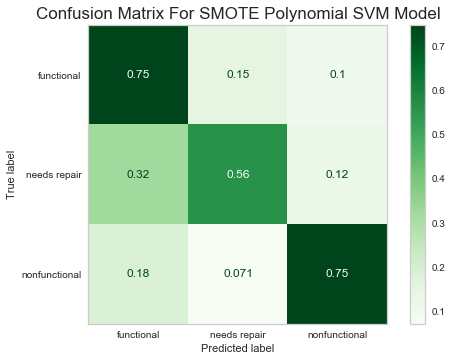

__________________________________________________________________


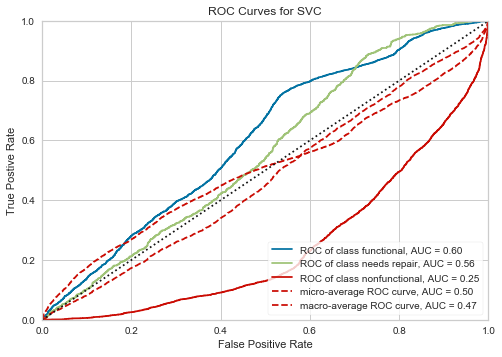

In [268]:
evaluate_model(svc_poly_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='SMOTE Polynomial SVM Model')

# STACKING

## Balanced Classes

In [269]:
from sklearn.ensemble import StackingClassifier

In [270]:
estimators_grid = [
    ('logreg', logreg_gridmodel),
    ('forest', forest_gridmodel),
    ('extratrees', extratrees_gridmodel),
    ('adaboost', ada_gridmodel),
    ('xgboost', xgb_gridmodel),
    ('linear_svm', svm_gridmodel),
    ('poly_svm', svc_poly_gridmodel)
]
estimators_grid

[('logreg', LogisticRegression(C=0.4552163974152526, class_weight='balanced',
                     multi_class='multinomial', random_state=123, solver='saga')),
 ('forest',
  RandomForestClassifier(class_weight='balanced_subsample', max_samples=0.5,
                         random_state=123)),
 ('extratrees',
  ExtraTreesClassifier(bootstrap=True, class_weight='balanced_subsample',
                       max_samples=0.5, random_state=123)),
 ('adaboost',
  AdaBoostClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                           min_samples_split=40),
                     learning_rate=0.05, n_estimators=250, random_state=123)),
 ('xgboost', XGBClassifier(max_depth=12, n_estimators=400, n_jobs=-1,
                objective='multi:softprob', random_state=123, subsample=0.7)),
 ('linear_svm',
  LinearSVC(C=1, class_weight='balanced', dual=False, random_state=123)),
 ('poly_svm',
  SVC(C=20, class_weight='balanced', coef0=

In [271]:
stack_grid = StackingClassifier(estimators=estimators_grid, 
                                final_estimator=forest_gridmodel, n_jobs=-1)
stack_grid

StackingClassifier(estimators=[('logreg',
                                LogisticRegression(C=0.4552163974152526,
                                                   class_weight='balanced',
                                                   multi_class='multinomial',
                                                   random_state=123,
                                                   solver='saga')),
                               ('forest',
                                RandomForestClassifier(class_weight='balanced_subsample',
                                                       max_samples=0.5,
                                                       random_state=123)),
                               ('extratrees',
                                ExtraTreesClassifier(bootstrap=True,
                                                     class_weight='balanced_subsample',...
                                              objective='multi:softprob',
                                   

In [ ]:
stackgrid_model = stack_grid.fit(X_train_tf, y_train)

In [ ]:
evaluate_model(stackgrid_model, X_train_tf, y_train, X_test_tf, y_test, 
               title='Stacking With Balanced Classes Model')

## SMOTE

In [ ]:
estimators_smote = [
    ('logreg', logreg_smote),
    ('forest', forest_smote),
    ('extratrees', extratrees_smote),
    ('adaboost', ada_smote),
    ('xgboost', xgb_smote),
    ('linear_svm', svm_smote),
    ('poly_svm', svc_poly_smote)
]
estimators_smote

In [ ]:
stack_smote = StackingClassifier(estimators=estimators_smote, 
                                final_estimator=xgb_smote, n_jobs=-1)
stack_smote

In [ ]:
stacksmote_model = stack_smote.fit(X_train_smote, y_train_smote)

In [ ]:
evaluate_model(stacksmote_model, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='Stacking With Smote Model')

## Pickle

In [ ]:
pickle.dump(stackgrid_model, open('stackgrid_model.sav', 'wb'))
pickle.dump(stacksmote_model, open('stacksmote_model.sav', 'wb'))

In [ ]:
%time
stack.fit(X_train_tf, y_train)

In [ ]:
stack.score(X_test_tf, y_test)

# INTERPRETATION

In [ ]:
import shap

In [ ]:
shap.__version__

In [ ]:
# def plot_bottom_features(model, xtrain, title=''):
#     importances = pd.Series(model.feature_importances_, index=xtrain.columns)
#     feat_importances.nlargest(20).sort_values().plot(kind='barh')
#     plt.title(f'Most Important Features For {title}', fontdict={'fontsize':17})
#     plt.xlabel('Importance')
#     return plt.show()

# FUTURE DIRECTIONS

In [ ]:
# preprocessing with clusters
# Catboost
# further tuning
# more feature engineering
# try different classifiers on my stack

# TESTING

micro vs macro
https://datascience.stackexchange.com/questions/15989/micro-average-vs-macro-average-performance-in-a-multiclass-classification-settin

In [ ]:
svm_params = {'C': [1, 10, 50, 100], 
              'fit_intercept': [True, False]}

svm_clf = LinearSVC(random_state=123, dual=False, class_weight='balanced')
grid = GridSearchCV(svm_clf, svm_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)
svm_grid3 = grid.fit(X_train_tf, y_train)

In [ ]:
svm_grid3.best_params_

In [ ]:
svm_params = {'C': [1, 2, 3]}

svm_clf = LinearSVC(random_state=123, fit_intercept=True, dual=False, 
                    class_weight='balanced')
grid = GridSearchCV(svm_clf, svm_params, scoring='recall_micro', 
                    n_jobs=-1, cv=3)
svm_grid4 = grid.fit(X_train_tf, y_train)

In [ ]:
svm_grid4.best_params_